<a href="https://colab.research.google.com/github/kdd2000/Dian_CF_VaR_ES_FORECAST/blob/main/Dian_CF_VaR_ES_FORECAST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Libraries

In [1]:
!pip install arch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.3/978.3 kB 10.6 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import math
import time
import warnings
import datetime as dt
from datetime import datetime, timedelta
from matplotlib.ticker import PercentFormatter

import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns

import yfinance as yf
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch

from arch import arch_model
from scipy.stats import norm, skew, kurtosis, probplot, chi2, t
from scipy.optimize import minimize

import tensorflow as tf
from tensorflow.keras import layers, Model, callbacks

warnings.filterwarnings('ignore')

In [3]:
np.random.seed(78)

# 1. Data Processing and Visualization

### 1.1. Uploading Data

In [4]:
from google.colab import files
import pandas as pd

uploaded = files.upload()

sp500 = pd.read_csv("sp500_15years_data.csv", na_values=['NA '])
fts100 = pd.read_csv("ftse100_15years_data.csv", na_values=['NA '])
eur_usd = pd.read_csv("usd_eur_15years_data.csv", na_values=['NA '])
gold = pd.read_csv("gold_15years_data.csv", na_values=['NA '])
oil = pd.read_csv("oil_15years_data.csv", na_values=['NA '])


Saving ftse100_15years_data.csv to ftse100_15years_data.csv
Saving gold_15years_data.csv to gold_15years_data.csv
Saving oil_15years_data.csv to oil_15years_data.csv
Saving sp500_15years_data.csv to sp500_15years_data.csv
Saving usd_eur_15years_data.csv to usd_eur_15years_data.csv


In [5]:
datasets = {
    'sp500': sp500,
    'fts100': fts100,
    'eur_usd': eur_usd,
    'gold': gold,
    'oil': oil
}

for name, df in datasets.items():
    df['Date'] = pd.to_datetime(df['Date'], utc=True).dt.tz_localize(None).dt.date

### 1.2. Merging Assets' Prices into One DataFrame

In [6]:
sp500_close = sp500[['Date', 'Close']].copy()
sp500_close.rename(columns={'Close': 'S&P500'}, inplace=True)

fts100_close = fts100[['Date', 'Close']].copy()
fts100_close.rename(columns={'Close': 'FTSE100'}, inplace=True)

eur_usd_close = eur_usd[['Date', 'Close']].copy()
eur_usd_close.rename(columns={'Close': 'EUR/USD'}, inplace=True)

gold_close = gold[['Date', 'Close']].copy()
gold_close.rename(columns={'Close': 'Gold'}, inplace=True)

oil_close = oil[['Date', 'Close']].copy()
oil_close.rename(columns={'Close': 'Crude Oil'}, inplace=True)

df_close = eur_usd_close.merge(sp500_close, on='Date') \
                        .merge(fts100_close, on='Date') \
                        .merge(gold_close, on='Date') \
                        .merge(oil_close, on='Date')


In [7]:
df_close

,Date,EUR/USD,S&P500,FTSE100,Gold,Crude Oil
0,2005-04-11,1.291506,1181.209961,4946.200195,428.600006,53.709999
1,2005-04-12,1.291206,1187.760010,4960.799805,427.600006,51.860001
2,2005-04-13,1.279492,1173.790039,4945.399902,429.299988,50.220001
3,2005-04-14,1.287001,1162.050049,4891.600098,424.000000,51.130001
4,2005-04-18,1.306506,1145.979980,4855.600098,427.500000,50.369999
...,...,...,...,...,...,...
4356,2025-03-28,1.080100,5580.939941,8658.900391,3086.500000,69.360001
4357,2025-03-31,1.081888,5611.850098,8634.799805,3122.800049,71.480003
4358,2025-04-01,1.079599,5633.069824,8608.500000,3118.899902,71.199997
4359,2025-04-02,1.090869,5670.970215,8474.700195,3139.899902,71.709999


## 1.3. Plots of Assets' Prices

### 1.3.1. Line Plot

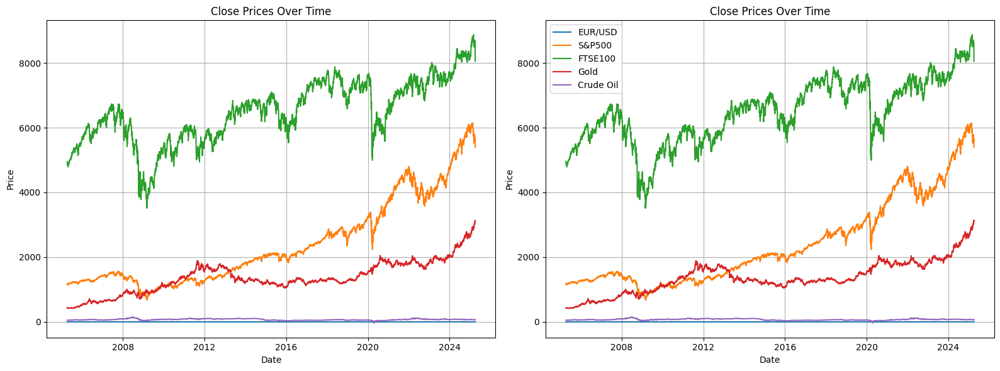

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

for ax in axes:
    for col in df_close.columns[1:]:
        ax.plot(df_close['Date'], df_close[col], label=col)
    ax.set_title('Close Prices Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel('Price')
    ax.grid(True)

axes[1].legend()
plt.tight_layout()
plt.show()

### 1.3.2. Normalized Prices

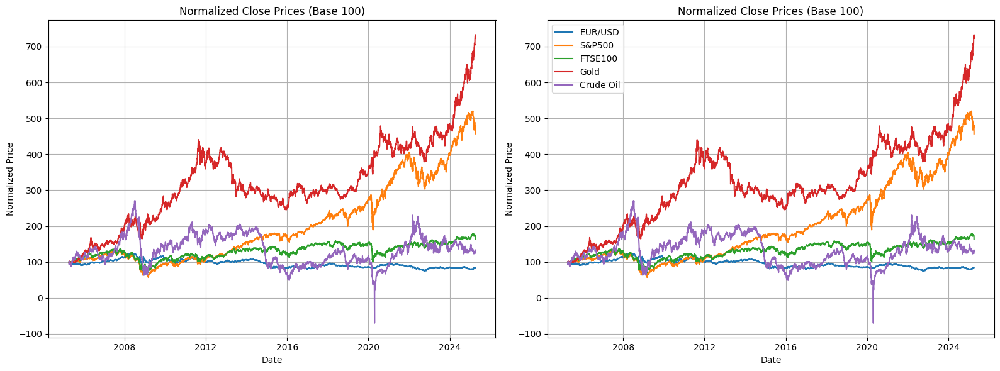

In [9]:
df_norm = df_close.copy()
for col in df_norm.columns[1:]:
    df_norm[col] = df_norm[col] / df_norm[col].iloc[0] * 100

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

for ax in axes:
    for col in df_norm.columns[1:]:
        ax.plot(df_norm['Date'], df_norm[col], label=col)
    ax.set_title('Normalized Close Prices (Base 100)')
    ax.set_xlabel('Date')
    ax.set_ylabel('Normalized Price')
    ax.grid(True)

axes[1].legend()

plt.tight_layout()
plt.show()

### 1.3.3. Rolling Averages (30-day)

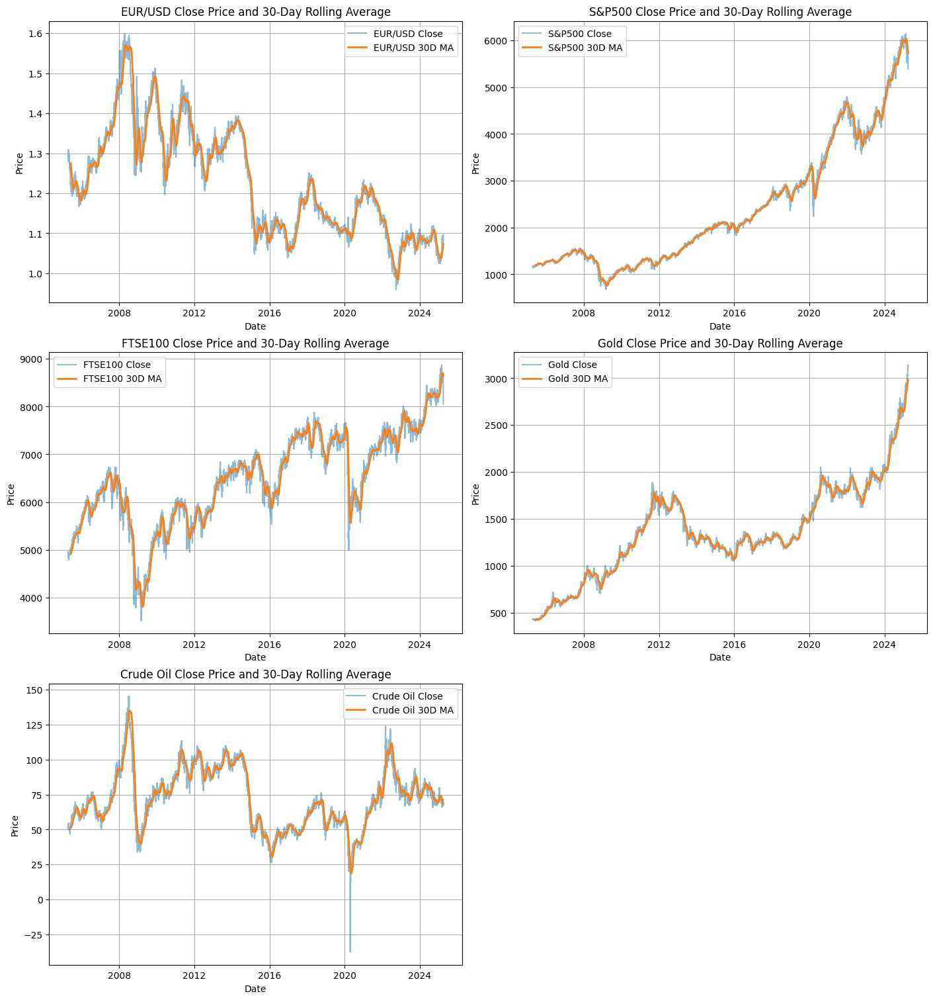

In [10]:
df_rolling = df_close.copy()
for col in df_rolling.columns[1:]:
    df_rolling[f'{col}_30d'] = df_close[col].rolling(window=30).mean()

num_assets = len(df_close.columns[1:])
ncols = 2
nrows = math.ceil(num_assets / ncols)

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 5 * nrows), constrained_layout=True)

axs = axs.flatten()

for i, col in enumerate(df_close.columns[1:]):
    ax = axs[i]
    ax.plot(df_close['Date'], df_close[col], label=f'{col} Close', alpha=0.5)
    ax.plot(df_close['Date'], df_rolling[f'{col}_30d'], label=f'{col} 30D MA', linewidth=2)
    ax.set_title(f'{col} Close Price and 30-Day Rolling Average')
    ax.set_xlabel('Date')
    ax.set_ylabel('Price')
    ax.legend()
    ax.grid(True)

for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.show()


### 1.3.4. Volatility Plots (Rolling 30-day Std Dev)

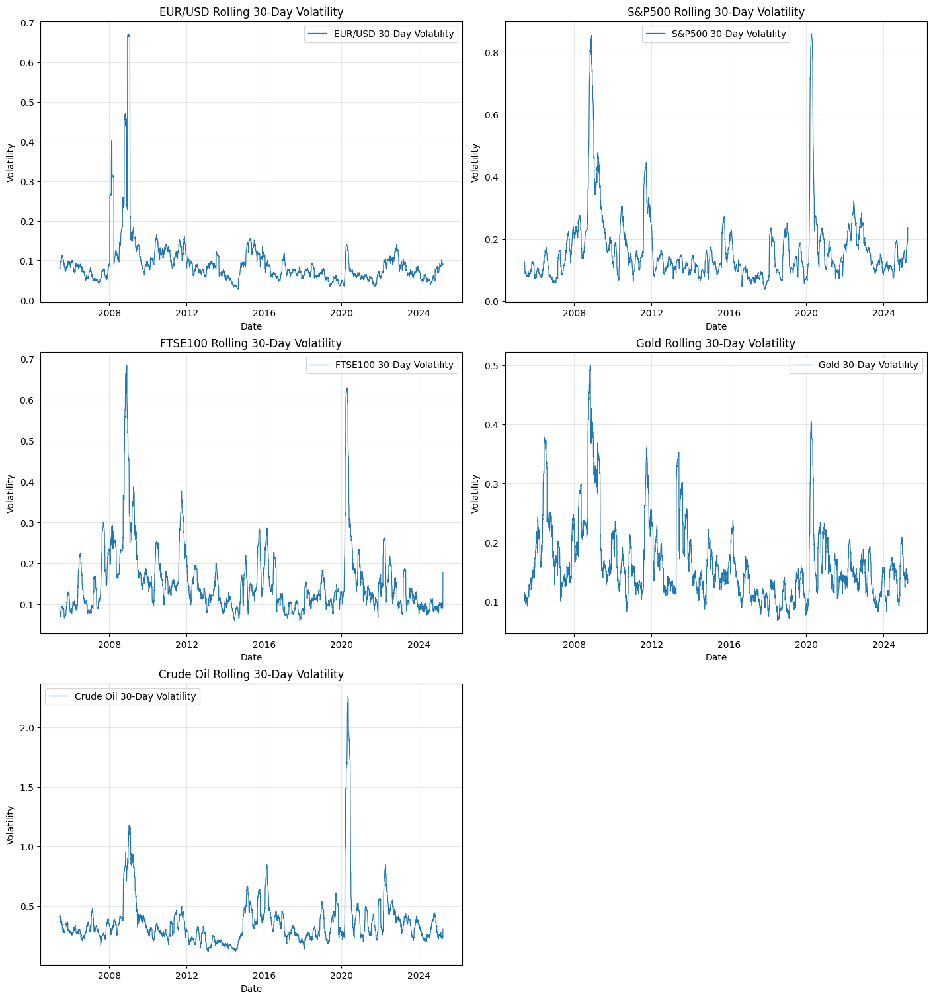

In [24]:
window = 30
annualize = True
trading_days = 252
ann_factor = np.sqrt(trading_days) if annualize else 1.0

df_volatility = df_logR[['Date']].copy()
for col in df_logR.columns[1:]:
    df_volatility[f'{col}_Vol'] = df_logR[col].rolling(window=window, min_periods=window).std() * ann_factor

assets = [c for c in df_logR.columns[1:]]
num_assets = len(assets)
ncols = 2
nrows = math.ceil(num_assets / ncols)

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 5 * nrows), constrained_layout=True)
axs = axs.flatten()

for i, col in enumerate(assets):
    ax = axs[i]
    ax.plot(df_volatility['Date'], df_volatility[f'{col}_Vol'], label=f'{col} {window}-Day Volatility', linewidth=0.9)
    ax.set_title(f'{col} Rolling {window}-Day Volatility')
    ax.set_xlabel('Date')
    ax.set_ylabel('Volatility')
    ax.grid(True, alpha=0.3)
    ax.legend()

for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.show()


- **Volatility Clustering**: All assets exhibit strong evidence of **volatility clustering** — high-volatility periods tend to be followed by further high volatility.
- **Crisis Sensitivity**:
  - **EUR/USD** saw a sharp volatility spike during the 2008 crisis, confirming forex market instability during systemic events.
  - **S&P 500** and **FTSE 100** showed extreme spikes in 2008, 2020 (COVID-19), and post-2022, consistent with known equity drawdowns.
  - **Gold** shows increasing volatility in recent years, possibly reflecting rising uncertainty and its evolving role as a hedge.
  - **Crude Oil** experienced the **most extreme volatility** in 2020, where prices briefly turned negative — emphasizing its exposure to geopolitical and supply chain shocks.

## 1.4 Computing Log Returns

In [12]:
def compute_log_return(df, close_col='Close', new_col='Return'):
    df[new_col] = np.log(df[close_col] / df[close_col].shift(1))
    return df.dropna()[['Date', new_col]]

sp500_R = compute_log_return(sp500, new_col='S&P500')
fts100_R = compute_log_return(fts100, new_col='FTSE100')
eur_usd_R = compute_log_return(eur_usd, new_col='EUR/USD')
gold_R = compute_log_return(gold, new_col='Gold')
oil_R = compute_log_return(oil, new_col='Crude Oil')

In [13]:
df_logR = eur_usd_R.merge(sp500_R, on='Date').merge(fts100_R, on='Date').merge(gold_R, on='Date').merge(oil_R, on='Date')

## 1.5. Computing Squared Returns

In [14]:
df_squaredR = df_logR.copy()
for col in df_squaredR.columns[1:]:
    df_squaredR[col] = df_squaredR[col] ** 2

## 1.6. Computing Absolute Log Returns

In [15]:
df_absR = df_logR.copy()
for col in df_absR.columns[1:]:
    df_absR[col] = df_absR[col].abs()

## 1.7. Computing Simple (arithmetic) Returns

In [16]:
df_simpleR = df_close.copy()
for col in df_simpleR.columns[1:]:
    df_simpleR[col] = df_simpleR[col].pct_change()
df_simpleR.dropna(inplace=True)

## 1.8. Returns Visualization

### 1.8.1. Plotting Types of Returns

In [21]:

assets = ["FTSE100", "Crude Oil"]

series_defs = [
    ("Log Returns", df_logR, "tab:blue"),
    ("Squared Log Returns", df_squaredR, "tab:orange"),
    ("Absolute Log Returns", df_absR, "tab:green"),
]

nrows = 3
ncols = len(assets)
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 10), constrained_layout=True)

axs = axs.reshape(nrows, ncols)

for c, asset in enumerate(assets):
    for r, (label, df, color) in enumerate(series_defs):
        ax = axs[r, c]
        ax.plot(df["Date"], df[asset], color=color, alpha=0.8)
        if r == 0:
            ax.set_title(asset, fontsize=12)
        if c == 0:
            ax.set_ylabel(label, fontsize=11)
        ax.grid(True, alpha=0.3)

for ax in axs[-1, :]:
    ax.set_xlabel("Date")

fig.suptitle("Figure 3.4: Returns by Transformation (rows) and Asset (columns)", y=1.02, fontsize=13)

out_path = "/content/returns_grid.png"
fig.savefig(out_path, dpi=300, bbox_inches="tight")
plt.close(fig)
files.download(out_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

- **Crude Oil** shows the most extreme spikes. High-risk profile and needs heavy-tailed modeling.
- **S&P 500** and **FTSE 100** demonstrate clear periods of volatility clustering aligning with known crisis periods.
- **Gold** appears more stable overall but still exhibits significant spikes in absolute returns during recent years.
- **EUR/USD** is relatively stable but sensitive to macro shocks (e.g., 2008, sovereign debt crisis).

### 1.8.2. Analyzing Returns Distribution

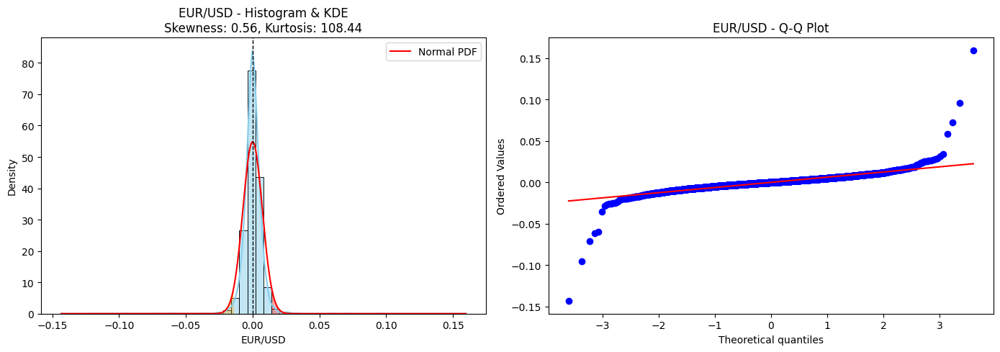

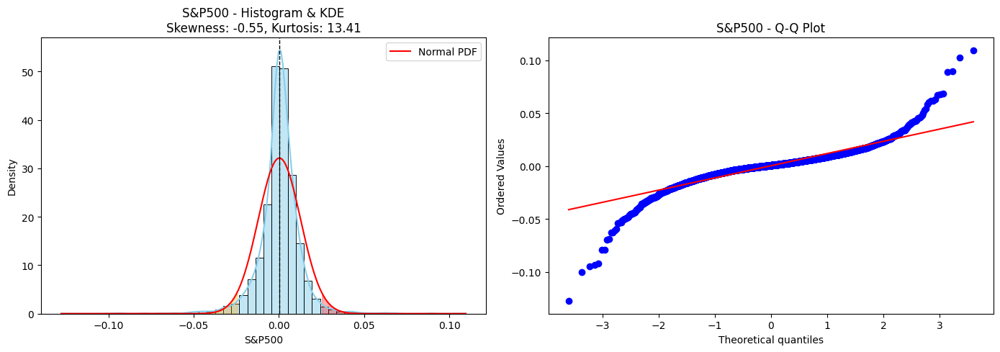

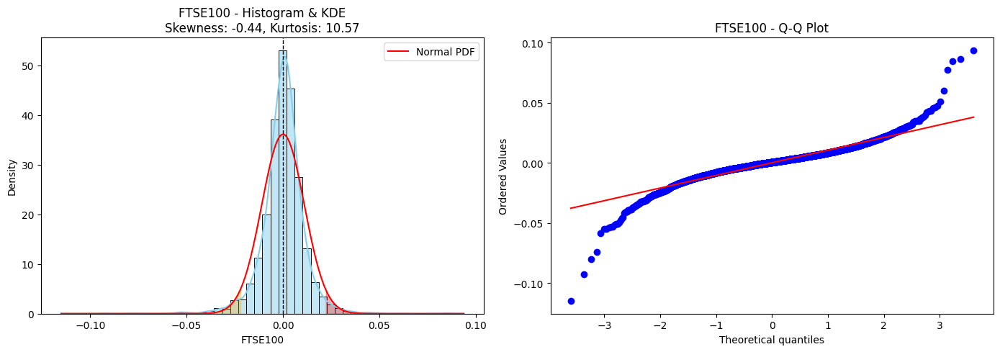

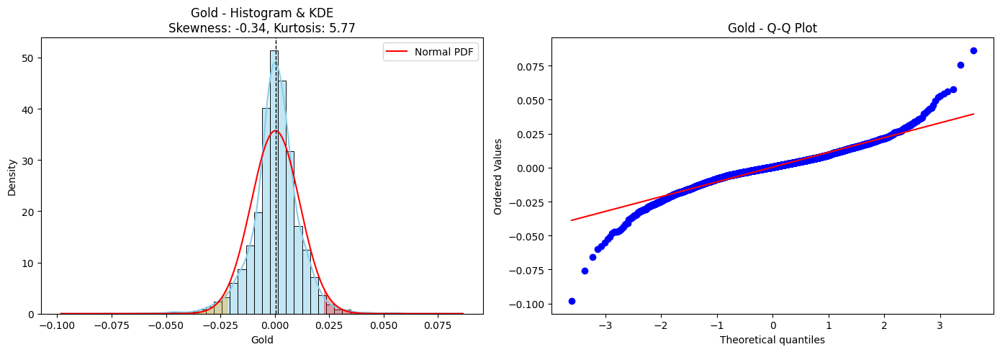

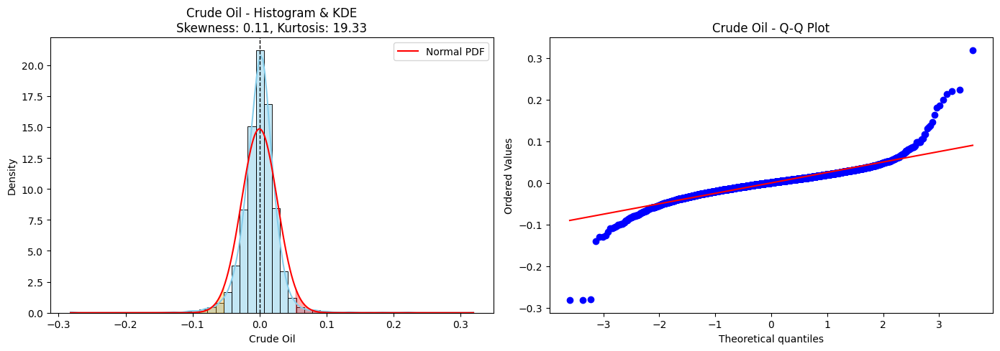

In [ ]:
# I am doing here: histogram + KDE + normal overlay + skewness + kurtosis + Q-Q plot
def analyze_log_returns(df_logR):
    for col in df_logR.columns[1:]:
        data = df_logR[col].dropna()
        mu, sigma = data.mean(), data.std()
        skew_val = skew(data)
        kurt_val = kurtosis(data)

        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        # Histogram + KDE + Normal overlay
        sns.histplot(data, bins=50, kde=True, stat="density", ax=axes[0], color="skyblue", edgecolor="black")
        x = np.linspace(data.min(), data.max(), 1000)
        axes[0].plot(x, norm.pdf(x, mu, sigma), 'r', label='Normal PDF')
        axes[0].set_title(f"{col} - Histogram & KDE\nSkewness: {skew_val:.2f}, Kurtosis: {kurt_val:.2f}")
        axes[0].legend()
        axes[0].axvline(mu, color='black', linestyle='--', linewidth=1)

        # Highlighting non-normal areas (fat tails)
        axes[0].fill_between(x, 0, norm.pdf(x, mu, sigma), where=(x < mu - 2*sigma), color='orange', alpha=0.3, label='Left Tail')
        axes[0].fill_between(x, 0, norm.pdf(x, mu, sigma), where=(x > mu + 2*sigma), color='red', alpha=0.3, label='Right Tail')

        # Q-Q Plot
        probplot(data, dist="norm", plot=axes[1])
        axes[1].set_title(f"{col} - Q-Q Plot")

        plt.tight_layout()
        plt.show()

analyze_log_returns(df_logR)

1. **All assets deviate significantly from normality**, as shown by:
   - **Fat tails** in the histograms, where extreme returns occur more frequently than the normal distribution predicts
   - **Curved Q-Q plots**, where returns deviate from the red line, especially in the tails
   - **High excess kurtosis** (e.g., EUR/USD = 108.44, Crude Oil = 19.33), confirming heavy-tailed behavior
   - **Skewness**, which shows asymmetry in return distributions (e.g., S&P 500 = -0.55, EUR/USD = 0.56)
     
- **EUR/USD** exhibits extremely high kurtosis indicating rare but severe shocks in the FX market.
- **Crude Oil** has the most dramatic deviation from normality, likely driven by price shocks and geopolitical risk.
- **S&P 500 and FTSE 100** show symmetric but fat-tailed behavior, characteristic of equity index returns.
- **Gold** shows modest skew and fat tails, consistent with its use as a hedge in volatile times.

### 1.8.3. Volatility Clustering

In [ ]:
def plot_volatility_clustering(df_absR, df_squaredR, crisis_events=None):

    if crisis_events is None:
        crisis_events = {
            "2008 Crisis": "2008-09-15",
            "Oil Price Collapse": "2014-11-27",
            "COVID Crash": "2020-03-16",
            "Ukraine War": "2022-02-24"
        }

    crisis_dates = {event: pd.to_datetime(date) for event, date in crisis_events.items()}

    for col in df_absR.columns[1:]:
        fig, ax = plt.subplots(figsize=(16, 6))

        ax.plot(df_absR['Date'], df_absR[col], label='Log Returns', color='steelblue', alpha=0.6)

        ax.plot(df_squaredR['Date'], df_squaredR[col], label='Squared Returns', color='firebrick', alpha=0.4)

        rolling_vol = df_absR[col].rolling(window=30).std()
        ax.plot(df_absR['Date'], rolling_vol, label='30-Day Rolling Volatility', color='black', linestyle='--', linewidth=1.5)

        date_min = pd.to_datetime(df_absR['Date'].min())
        date_max = pd.to_datetime(df_absR['Date'].max())
        for event, crisis_date in crisis_dates.items():
            if date_min < crisis_date < date_max:
                ax.axvline(crisis_date, color='purple', linestyle='--', linewidth=1)
                ax.annotate(event,
                            xy=(crisis_date, ax.get_ylim()[1]*0.8),
                            xytext=(crisis_date, ax.get_ylim()[1]*0.95),
                            arrowprops=dict(facecolor='black', arrowstyle='->'),
                            fontsize=9, rotation=0, ha='center')

        ax.set_title(f'Volatility Clustering for {col}')
        ax.set_xlabel('Date')
        ax.set_ylabel('Return / Volatility')
        ax.legend()
        ax.grid(True)
        ax.xaxis.set_major_locator(mdates.YearLocator(2))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.tight_layout()
        plt.show()


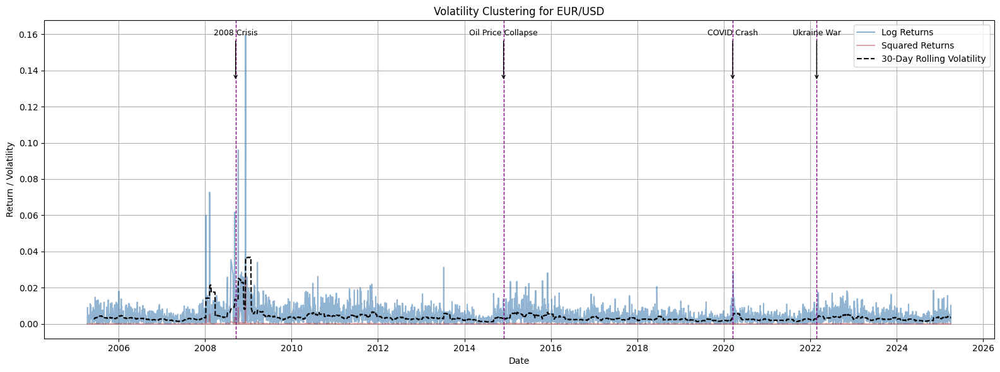

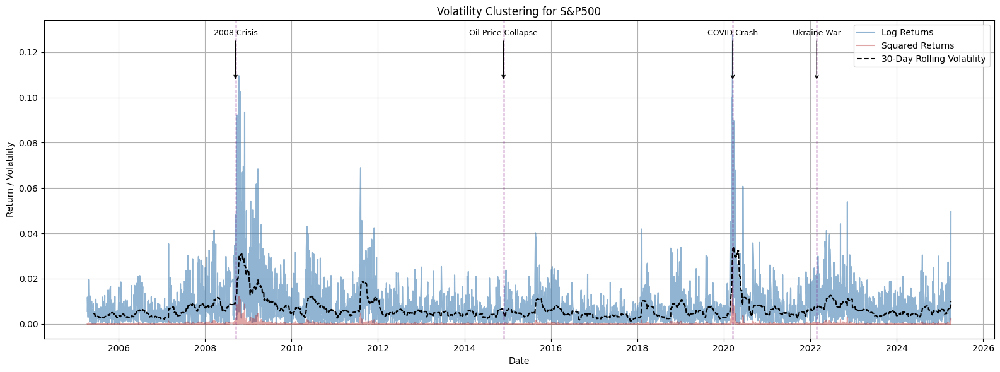

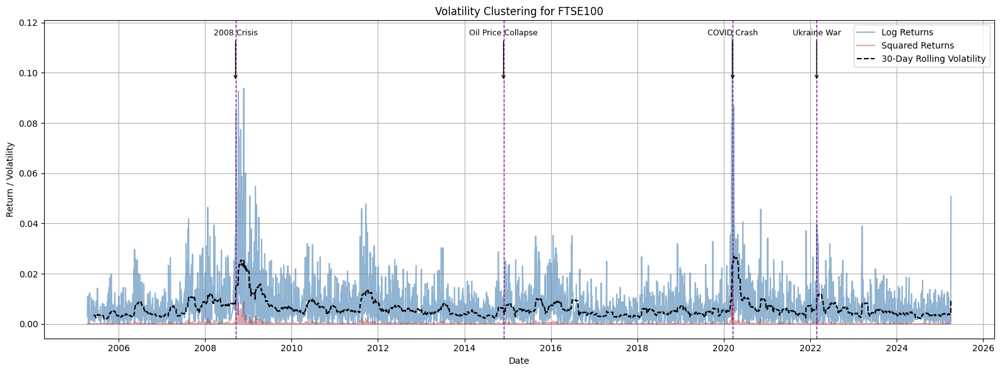

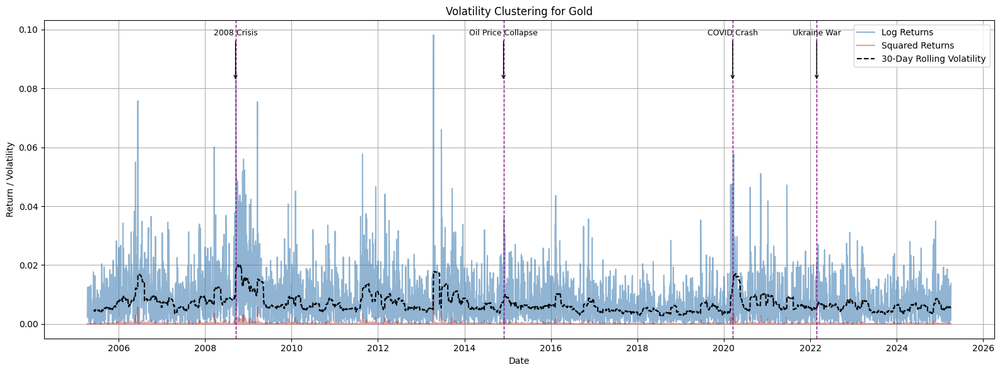

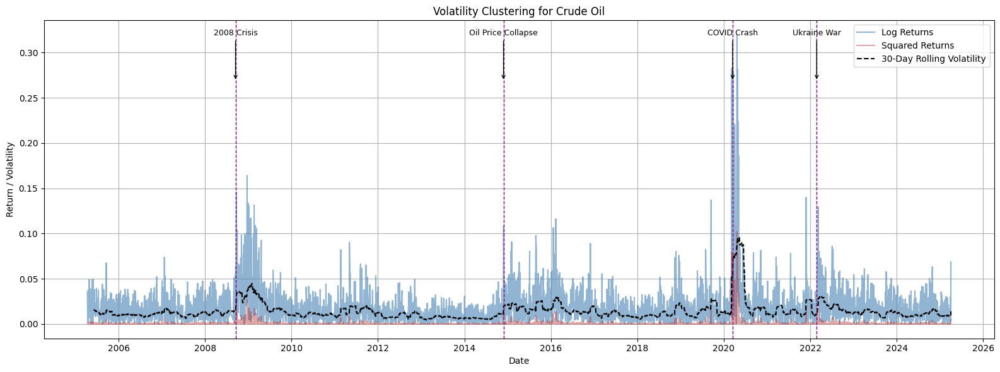

In [ ]:
plot_volatility_clustering(df_absR, df_squaredR)

- **Volatility clustering** is clearly observable: periods of high volatility are followed by further turbulence rather than immediate stabilization.
- Spikes in volatility align with major events:
  - **2008 Financial Crisis** and **COVID-19 Crash** generated the most pronounced shocks.
  - The **Oil Price Collapse** and **Ukraine War** had asset-specific effects, especially on commodities and energy-sensitive instruments.
- The **30-day rolling volatility** (black dashed line) captures persistent shifts in risk levels. Volatility doesn't fade instantly after a shock — instead, it decays gradually.

These plots visually confirm the empirical reality of volatility clustering across all assets in the dataset.

### 1.8.4. The Pearson correlation coefficients

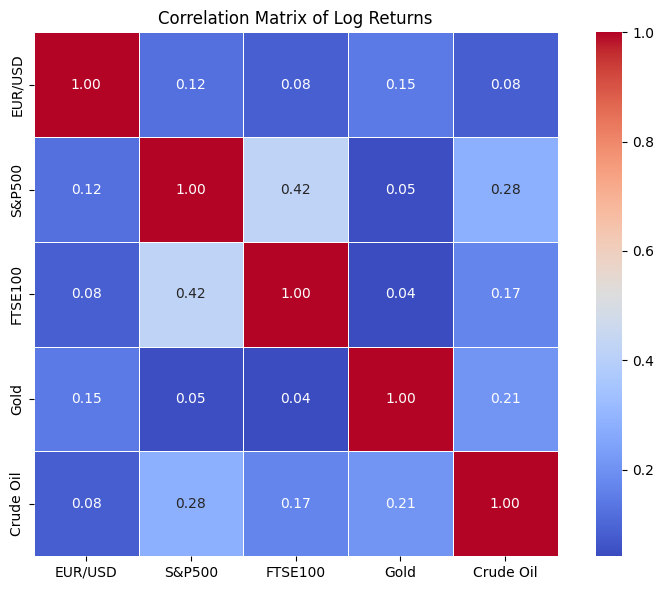

In [ ]:
corr_returns = df_logR.drop(columns='Date').corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_returns, annot=True, cmap='coolwarm', fmt=".2f", square=True, linewidths=.5)
plt.title('Correlation Matrix of Log Returns')
plt.tight_layout()
plt.show()


- **Low correlations dominate**. This suggests that the assets are not strongly linearly related over time which is a desirable property for portfolio diversification.
- The highest observed correlation is between **S&P500 and FTSE100 (0.42)**, which reflects their shared exposure to global equity market trends.
  - **Gold and EUR/USD** exhibit low correlations with all other assets which supports their typical use as hedging or safe-haven instruments.

These correlation values support the hypothesis that **multi-asset portfolios may benefit from diversification benefits**, especially in stress-testing VaR and ES forecasts.

### 1.8.6. Return vs. Volatility by Asset

In [ ]:
def return_vs_volatility(df_logR):
    """
    I am Computing mean return and volatility for each asset and plots a quadrant-style scatterplot.
    """
    asset_types = {
        'S&P500': 'Index',
        'FTSE100': 'Index',
        'EUR/USD': 'Forex',
        'Gold': 'Commodity',
        'Crude Oil': 'Commodity'
    }

    summary_stats = {
        'Asset': [],
        'Mean Return': [],
        'Volatility': [],
        'Type': []
    }

    for col in df_logR.columns[1:]:
        summary_stats['Asset'].append(col)
        summary_stats['Mean Return'].append(df_logR[col].mean())
        summary_stats['Volatility'].append(df_logR[col].std())
        summary_stats['Type'].append(asset_types.get(col, 'Other'))

    df_summary = pd.DataFrame(summary_stats)

    fig, ax = plt.subplots(figsize=(14, 10), constrained_layout=True)

    sns.scatterplot(
        data=df_summary,
        x='Mean Return',
        y='Volatility',
        hue='Type',
        style='Type',
        s=150,
        palette='Set2',
        ax=ax
    )

    # Label points
    for _, row in df_summary.iterrows():
        ax.text(row['Mean Return'], row['Volatility'] + 0.0005, row['Asset'],
                fontsize=10, ha='center', va='bottom')

    # Mean lines
    mean_x = df_summary['Mean Return'].mean()
    mean_y = df_summary['Volatility'].mean()
    ax.axvline(mean_x, color='gray', linestyle='--')
    ax.axhline(mean_y, color='gray', linestyle='--')

    # Quadrant labels
    x_offset = (df_summary['Mean Return'].max() - df_summary['Mean Return'].min()) * 0.1
    y_offset = (df_summary['Volatility'].max() - df_summary['Volatility'].min()) * 0.1

    ax.text(mean_x + x_offset, mean_y + y_offset, 'High Return\nHigh Risk', fontsize=11, color='green', ha='left')
    ax.text(mean_x - x_offset, mean_y + y_offset, 'Low Return\nHigh Risk', fontsize=11, color='orange', ha='right')
    ax.text(mean_x - x_offset, mean_y - y_offset, 'Low Return\nLow Risk', fontsize=11, color='blue', ha='right')
    ax.text(mean_x + x_offset, mean_y - y_offset, 'High Return\nLow Risk', fontsize=11, color='purple', ha='left')

    ax.set_title('Return vs. Volatility by Asset')
    ax.set_xlabel('Mean Daily Log Return')
    ax.set_ylabel('Volatility (Std Dev)')
    ax.grid(True)

    plt.show()

    return df_summary


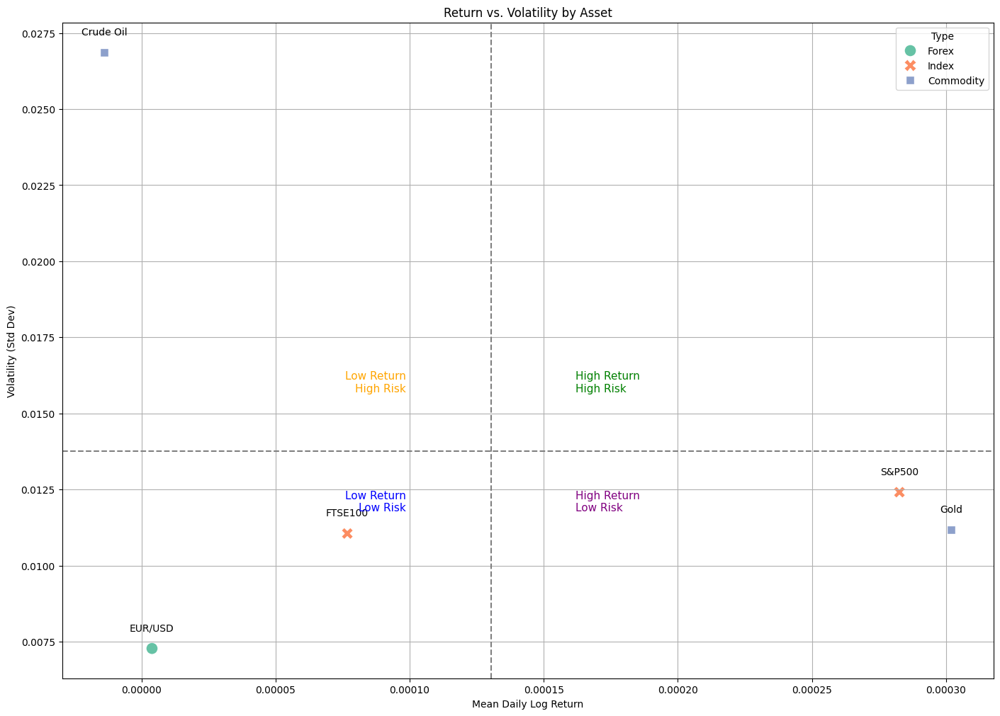

In [ ]:
df_summary = return_vs_volatility(df_logR)

- **Crude Oil** stands out with **the highest volatility** but offers **very low average returns**, placing it in the **"Low Return, High Risk"** quadrant. Making it the riskiest asset with poor risk-adjusted performance.
- **EUR/USD** shows both **minimal volatility** and **near-zero returns**, indicating a **low-risk, low-reward** profile. Its position aligns with the typical behavior of major currency pairs in stable periods.
- **FTSE100** is classified in the **"Low Return, Low Risk"** zone, reflecting its relatively conservative nature compared to other equity indices.
- **S&P 500** falls into the **"High Return, Low Risk"** quadrant — the most desirable zone — suggesting **superior risk-adjusted performance** among the selected assets.
- **Gold** is also positioned in this optimal quadrant, with **high average returns** and **moderate volatility**, supporting its role as a robust **store of value and hedge** in uncertain markets.

## 1.9. Key Hypotheses for VaR and ES Forecasting ##

The following hypotheses are derived from exploratory data analysis:

**H1.** *Asset returns exhibit fat tails and deviate from normality,*  
→ Traditional parametric models may underestimate tail risk; non-parametric and ML methods are expected to perform better.

**H2.** *All assets show volatility clustering,*  
→ GARCH-type and recurrent ML models (like LSTM) are suitable for capturing time-varying risk and improving VaR/ES forecasts.

**H3.** *Crisis periods (2008, 2020) produce sharp drawdowns and extreme volatility spikes,*  
→ These events are critical stress tests for evaluating the robustness of all forecasting models.

**H4.** *Crude Oil and EUR/USD exhibit the most extreme deviations from normality,*  
→ These assets will help assess how well models handle heavy tails and rare events.

**H5.** *S&P 500 shows high return and relatively low volatility,*  
→ It serves as a benchmark to evaluate risk-adjusted model performance across both traditional and ML-based approaches.
  #no no no we wont use it as a benchmark, more like a reference

## 1.6. Splitting Data ##

In [ ]:
df_logR['Date'] = pd.to_datetime(df_logR['Date'])
cutoff_date = pd.to_datetime("2018-12-12")
in_sample = df_logR[df_logR['Date'] < cutoff_date]
out_sample = df_logR[df_logR['Date'] >= cutoff_date]

## 1.7. Summary Statistics Over the Full Sample Period ##

In [ ]:
logR = df_logR.drop(columns='Date')
logR_in = in_sample.drop(columns='Date')
logR_out = out_sample.drop(columns='Date')

def compute_var_es(series, alpha):
    sorted_returns = np.sort(series) #ascending by default
    var = np.percentile(sorted_returns, alpha * 100)
    es = sorted_returns[sorted_returns <= var].mean()
    return var, es

alphas = [0.01, 0.05]

summary = {}

for col in logR.columns:
    total_n = len(logR[col])
    in_n = len(logR_in[col])
    out_n = len(logR_out[col])
    mean = logR[col].mean() * 252
    std = logR[col].std() * np.sqrt(252)
    skew_val = skew(logR[col])
    kurt_val = kurtosis(logR[col])

    stats = {
        "Total count": total_n,
        "In-sample": in_n,
        "Out-of-sample": out_n,
        "Mean": mean,
        "StdDev": std,
        "Skew": skew_val,
        "Kurt": kurt_val
    }

    for alpha in alphas:
        var, es = compute_var_es(logR[col], alpha)
        stats[f"VaR (α={alpha})"] = var
        stats[f"ES (α={alpha})"] = es

    summary[col] = stats

summary_df = pd.DataFrame(summary)

summary_df

,EUR/USD,S&P500,FTSE100,Gold,Crude Oil
Total count,4358.000000,4358.000000,4358.000000,4358.000000,4358.000000
In-sample,2970.000000,2970.000000,2970.000000,2970.000000,2970.000000
Out-of-sample,1388.000000,1388.000000,1388.000000,1388.000000,1388.000000
Mean,0.000985,0.071232,0.019341,0.076083,-0.003492
StdDev,0.115492,0.197022,0.175455,0.177340,0.426503
Skew,0.558555,-0.553863,-0.444107,-0.342843,0.105568
Kurt,108.444272,13.412303,10.570041,5.770886,19.328588
VaR (α=0.01),-0.016242,-0.037761,-0.031969,-0.031125,-0.072052
ES (α=0.01),-0.027843,-0.056062,-0.045826,-0.042811,-0.105237
VaR (α=0.05),-0.009255,-0.018473,-0.016916,-0.018000,-0.038616


## 1.8. ACF and PACF

In [ ]:
def acf_pacf(df_returns, lags=22):
    for col in df_returns.columns:
        if col.lower() != 'date':
            series = df_returns[col].dropna()

            fig, axes = plt.subplots(1, 2, figsize=(14, 4))

            plot_acf(series, lags=lags, ax=axes[0])
            axes[0].set_title(f'ACF - {col}')

            plot_pacf(series, lags=lags, ax=axes[1])
            axes[1].set_title(f'PACF - {col}')

            plt.tight_layout()
            plt.show()

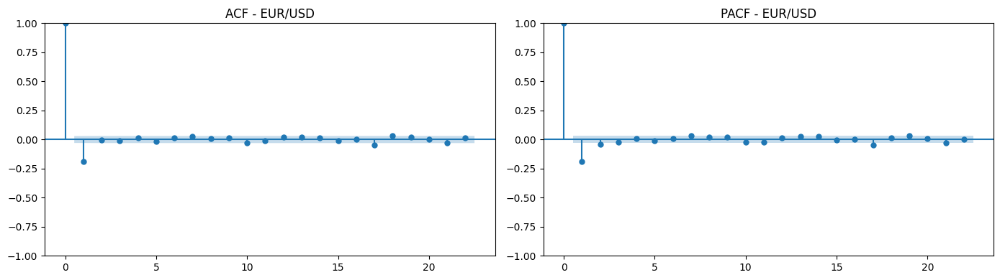

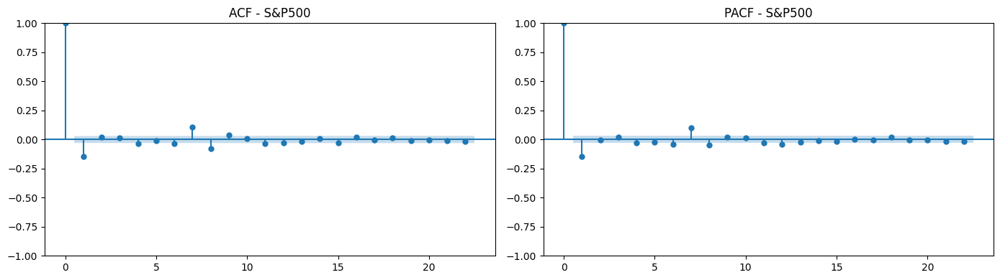

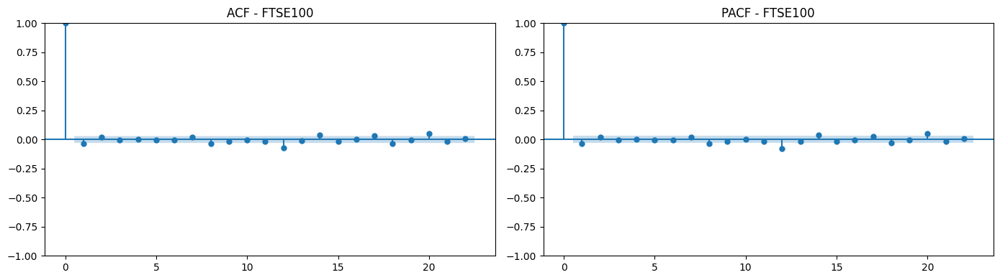

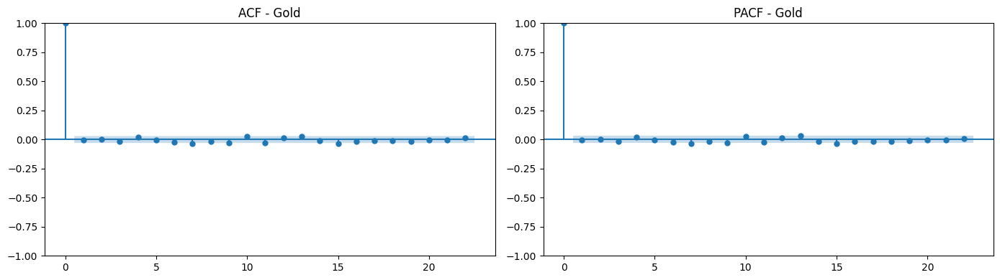

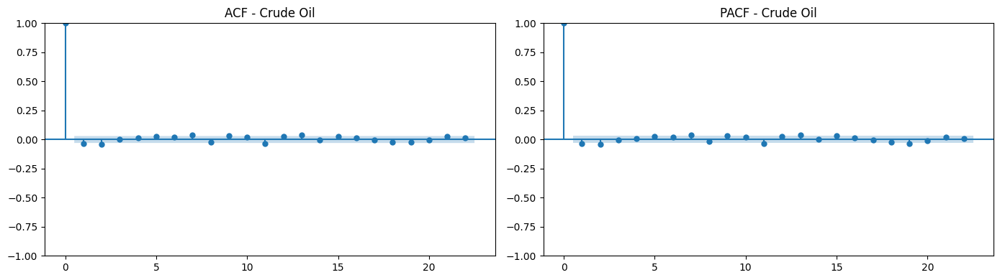

In [ ]:
acf_pacf(df_logR)

## 1.9. ADF test for stationarity

In [ ]:
def stationarity_adf(df_returns):
    for col in df_returns.columns:
        if col.lower() != 'date':
            print(f"\ADF Test for: {col}")
            adf_result = adfuller(df_returns[col].dropna())
            print("ADF Statistic:", round(adf_result[0], 4))
            print("p-value:", round(adf_result[1], 4))
            if adf_result[1] < 0.01:
                print("The series is stationary.")
            else:
                print("The series is NOT stationary.")

In [ ]:
stationarity_adf(df_logR)

\ADF Test for: EUR/USD
ADF Statistic: -10.9918
p-value: 0.0
The series is stationary.
\ADF Test for: S&P500
ADF Statistic: -14.3201
p-value: 0.0
The series is stationary.
\ADF Test for: FTSE100
ADF Statistic: -13.3077
p-value: 0.0
The series is stationary.
\ADF Test for: Gold
ADF Statistic: -18.1352
p-value: 0.0
The series is stationary.
\ADF Test for: Crude Oil
ADF Statistic: -12.959
p-value: 0.0
The series is stationary.


## 1.10. LM ARCH EFFECTS

In [ ]:
def LM_ARCH(df_logR):
    for col in df_logR.columns:
        if col.lower() != 'date':
            arch_test = het_arch(df_logR[col])
            test_statistic = arch_test[0]
            p_value = arch_test[1]
            print(f"LM Statistic: {test_statistic:.4f}")
            print(f"P-Value: {p_value:.4f}")

            if p_value < 0.01:
                print("ARCH effect")
            else:
                print("No ARCH effect")

In [ ]:
LM_ARCH(df_logR)

LM Statistic: 1557.6138
P-Value: 0.0000
ARCH effect
LM Statistic: 1319.9437
P-Value: 0.0000
ARCH effect
LM Statistic: 839.7465
P-Value: 0.0000
ARCH effect
LM Statistic: 255.5537
P-Value: 0.0000
ARCH effect
LM Statistic: 1166.1611
P-Value: 0.0000
ARCH effect


# 2. Models

## 2.1. Non-Parametric Method : Rolling window ##

In [ ]:
def rolling_window(in_sample,
                   out_sample,
                   window_sizes=[125, 250, 500],
                   alphas=[0.01, 0.05],
                   plot_window=None,
                   plot_alpha=None):

    # ensure lists
    if not isinstance(window_sizes, (list, tuple)):
        window_sizes = [window_sizes]
    if not isinstance(alphas, (list, tuple)):
        alphas = [alphas]

    # set indices
    ins = (
        in_sample
        .assign(Date=lambda df: pd.to_datetime(df['Date']))
        .sort_values('Date')
        .set_index('Date')
    )
    outs = (
        out_sample
        .assign(Date=lambda df: pd.to_datetime(df['Date']))
        .sort_values('Date')
        .set_index('Date')
    )

    plot_window = plot_window or window_sizes[0]
    plot_alpha  = plot_alpha  or alphas[0]

    results = []
    assets = ins.columns

    for w in window_sizes:
        for a in alphas:
            for asset in assets:
                history = ins[asset].dropna().tolist()

                var_list, es_list, dates = [], [], []

                for date in outs.index:
                    past = history[-w:]
                    if len(past) < w:
                        continue

                    sorted_ret = np.sort(past)
                    var = np.percentile(sorted_ret, a * 100)
                    es  = sorted_ret[sorted_ret <= var].mean()
                    actual = outs.at[date, asset]

                    results.append({
                        'Date': date,
                        'Asset': asset,
                        'Window': w,
                        'Alpha': a,
                        'Actual Return': actual,
                        'VaR': var,
                        'ES': es
                    })

                    history.append(actual)
                    dates.append(date)
                    var_list.append(var)
                    es_list.append(es)

                if w == plot_window and a == plot_alpha and dates:
                    plt.figure(figsize=(14, 6))
                    plt.plot(dates,
                             outs.loc[dates, asset],
                             label='Actual Returns',
                             color='steelblue')
                    plt.plot(dates,
                             var_list,
                             label=f'VaR ({int(a*100)}%)',
                             color='red',
                             linestyle='--')
                    plt.plot(dates,
                             es_list,
                             label=f'ES ({int(a*100)}%)',
                             color='green',
                             linestyle='--')
                    plt.axhline(0, color='black', linestyle='--', linewidth=1)
                    plt.title(f'{asset.upper()} – Actual vs VaR/ES '
                              f'(Window={w}, α={a})')
                    plt.xlabel('Date')
                    plt.ylabel('Return')
                    plt.legend()
                    plt.grid(True)
                    plt.tight_layout()
                    plt.show()

    return pd.DataFrame(results)

## 2.2. Parametric Method : GARCH ##

### 2.2.1. GARCH-t

In [ ]:
def garch_studnet_t(in_sample, p, q, scale_factor=100, lb_lags=20, arch_lags=20):
    model_fits = {}
    model_params = {}
    dates = in_sample['Date']
    rows = []  # for final table

    for asset in in_sample.columns:
        if asset.lower() == 'date':
            continue

        print(f"\n─ GARCH({p},{q}) with Student-t for {asset.upper()} (×{scale_factor})")

        # 1. Fit model
        series = in_sample[asset].dropna() * scale_factor
        model = arch_model(series, vol='Garch', p=p, q=q, dist='t')
        fit   = model.fit(disp="off")
        model_fits[asset] = fit

        # 2. Extract & store params
        ps = fit.params
        omega  = ps['omega']
        alpha1 = ps['alpha[1]']
        beta1  = ps['beta[1]']
        nu     = ps.get('nu', None)
        model_params[asset] = {
            'omega':  float(omega),
            'alpha1': float(alpha1),
            'beta1':  float(beta1),
            'nu':     float(nu) if nu is not None else None
        }

        # 3. Standardised residuals
        cond_vol  = fit.conditional_volatility
        z_t       = fit.resid / cond_vol
        z_t2      = z_t**2
        aligned_d = dates[-len(z_t):]

        # 4. Basic residual stats
        skew_val = skew(z_t)
        kurt_val = kurtosis(z_t)
        print(f"    • Skewness          : {skew_val:6.3f}")
        print(f"    • Kurtosis          : {kurt_val:6.3f}")
        if nu is not None:
            print(f"    • Degrees of freedom: {nu:6.3f}")

        # 5. Ljung-Box (mean + variance)
        lb_z   = acorr_ljungbox(z_t,  lags=lb_lags, return_df=True)
        lb_z2  = acorr_ljungbox(z_t2, lags=lb_lags, return_df=True)
        q_z,  p_z  = lb_z.iloc[-1]['lb_stat'],  lb_z.iloc[-1]['lb_pvalue']
        q_z2, p_z2 = lb_z2.iloc[-1]['lb_stat'], lb_z2.iloc[-1]['lb_pvalue']

        print(f"    • Ljung-Box  Q(z_t)     (lag {lb_lags:>2}) : Q={q_z:6.2f}, p={p_z:6.4f}")
        print(f"    • Ljung-Box  Q(z_t²)    (lag {lb_lags:>2}) : Q={q_z2:6.2f}, p={p_z2:6.4f}")

        # 6. ARCH-LM test on variance
        lm_stat, lm_pvalue, _, _ = het_arch(z_t, nlags=arch_lags)
        print(f"    • ARCH-LM   LM(z_t²)    (lag {arch_lags:>2}) : LM={lm_stat:6.2f}, p={lm_pvalue:6.4f}")

        # 7. Plots
        plt.figure(figsize=(14, 12))

        plt.subplot(3, 2, 1)
        plt.plot(aligned_d, cond_vol, color='teal')
        plt.title('Conditional Volatility')

        plt.subplot(3, 2, 2)
        plt.plot(aligned_d, z_t, color='teal')
        plt.axhline(0, color='gray', ls='--')
        plt.title('Standardised Residuals $z_t$')

        plt.subplot(3, 2, 3)
        plot_acf(z_t, ax=plt.gca(), lags=20)
        plt.title('ACF of $z_t$')

        plt.subplot(3, 2, 4)
        plot_pacf(z_t, ax=plt.gca(), lags=20)
        plt.title('PACF of $z_t$')

        plt.subplot(3, 2, 5)
        sns.histplot(z_t, kde=True, stat="density", color="teal")
        plt.title('Histogram of $z_t$')

        plt.subplot(3, 2, 6)
        if nu is not None:
            probplot(z_t, dist="t", sparams=(nu,), plot=plt)
            plt.title(f'Q-Q of $z_t$ vs Student-t($\\nu={nu:.2f}$)')
        else:
            probplot(z_t, plot=plt)
            plt.title('Q-Q of $z_t$ vs Normal')
        plt.gca().get_lines()[0].set_color('teal')
        plt.gca().get_lines()[1].set_color('gray')

        plt.tight_layout()
        plt.show()

        print(fit.summary())

        persistence = float(alpha1 + beta1)
        stationary = persistence < 1.0

        def sig_at(name, thr):
            pv = fit.pvalues.get(name, np.nan)
            return (pv < thr) if np.isfinite(pv) else False

        row = {
            "Asset": asset,
            f"Ljung-Box Q(z_t) p (lag {lb_lags})": f"{p_z:.3e}",
            f"Ljung-Box Q(z_t²) p (lag {lb_lags})": f"{p_z2:.3e}",
            f"ARCH-LM p (lag {arch_lags})": f"{lm_pvalue:.3e}",
            "ν (df)": round(nu, 3) if nu is not None else None,
            "Skew(z_t)": round(skew_val, 3),
            "Kurt(z_t)": round(kurt_val, 3),
            "∑α+∑β (persistence)": round(persistence, 4),
            "Stationary? (φ<1)": "Yes" if stationary else "No",
            "ω sig 1%/5%": f"{'Yes' if sig_at('omega',0.01) else 'No'} / {'Yes' if sig_at('omega',0.05) else 'No'}",
            "α sig 1%/5%": f"{'Yes' if sig_at('alpha[1]',0.01) else 'No'} / {'Yes' if sig_at('alpha[1]',0.05) else 'No'}",
            "β sig 1%/5%": f"{'Yes' if sig_at('beta[1]',0.01) else 'No'} / {'Yes' if sig_at('beta[1]',0.05) else 'No'}",
            "ν sig 1%/5%": f"{'Yes' if sig_at('nu',0.01) else 'No'} / {'Yes' if sig_at('nu',0.05) else 'No'}",
            "AIC": round(fit.aic, 2),
            "BIC": round(fit.bic, 2),
            "LogLik": round(fit.loglikelihood, 2),
            "Adequate @1%": "Yes" if (p_z>0.01 and p_z2>0.01 and lm_pvalue>0.01 and stationary) else "No",
            "Adequate @5%": "Yes" if (p_z>0.05 and p_z2>0.05 and lm_pvalue>0.05 and stationary) else "No",
        }
        rows.append(row)

    #Final diagnostic table
    diag_df = pd.DataFrame(rows)
    print("\n=== Diagnostic Summary Table (Student-t GARCH) ===")
    print(diag_df.to_string(index=False))

    return model_fits, model_params, diag_df


### 2.2.2. GARCH-normal

In [ ]:
def garch_normal(in_sample, p, q, scale_factor=100, lb_lags=20, arch_lags=20):
    model_fits = {}
    model_params = {}
    edf_resids = {}
    dates = in_sample['Date']

    rows = []

    for asset in in_sample.columns:
        if asset.lower() == 'date':
            continue

        print(f"\n─ GARCH({p},{q}) with Normal for {asset.upper()} (×{scale_factor})")

        # 1. Fit model
        series = in_sample[asset].dropna() * scale_factor
        model = arch_model(series, vol='Garch', p=p, q=q, dist='normal')
        fit   = model.fit(disp="off")
        model_fits[asset] = fit

        # 2. Extract & store just the core params
        ps = fit.params
        omega  = ps['omega']
        alpha1 = ps['alpha[1]']
        beta1  = ps['beta[1]']
        model_params[asset] = {
            'omega':  float(omega),
            'alpha1': float(alpha1),
            'beta1':  float(beta1),
            'nu':     None
        }

        # 3. Standardised residuals
        cond_vol  = fit.conditional_volatility
        z_t       = fit.resid / cond_vol          # standardized residuals
        edf_resids[asset] = z_t.dropna().values
        z_t2      = z_t**2
        aligned_d = dates[-len(z_t):]

        # 4. Basic residual stats
        skew_val = skew(z_t)
        kurt_val = kurtosis(z_t)
        print(f"    • Skewness          : {skew_val:6.3f}")
        print(f"    • Kurtosis          : {kurt_val:6.3f}")

        # 5. Ljung-Box (mean + variance)
        lb_z   = acorr_ljungbox(z_t,  lags=lb_lags, return_df=True)
        lb_z2  = acorr_ljungbox(z_t2, lags=lb_lags, return_df=True)
        q_z,  p_z  = lb_z.iloc[-1]['lb_stat'],  lb_z.iloc[-1]['lb_pvalue']
        q_z2, p_z2 = lb_z2.iloc[-1]['lb_stat'], lb_z2.iloc[-1]['lb_pvalue']

        print(f"    • Ljung-Box  Q(z_t)     (lag {lb_lags:>2}) : Q={q_z:6.2f}, p={p_z:6.4f}")
        print(f"    • Ljung-Box  Q(z_t²)    (lag {lb_lags:>2}) : Q={q_z2:6.2f}, p={p_z2:6.4f}")

        # 6. ARCH-LM test on variance
        lm_stat, lm_pvalue, _, _ = het_arch(z_t, nlags=arch_lags)
        print(f"    • ARCH-LM   LM(z_t²)    (lag {arch_lags:>2}) : LM={lm_stat:6.2f}, p={lm_pvalue:6.4f}")

        # 7. Plots
        plt.figure(figsize=(14, 12))

        plt.subplot(3, 2, 1)
        plt.plot(aligned_d, cond_vol, color='teal')
        plt.title('Conditional Volatility')

        plt.subplot(3, 2, 2)
        plt.plot(aligned_d, z_t, color='teal')
        plt.axhline(0, color='gray', ls='--')
        plt.title('Standardised Residuals $z_t$')

        plt.subplot(3, 2, 3)
        plot_acf(z_t, ax=plt.gca(), lags=20)
        plt.title('ACF of $z_t$')

        plt.subplot(3, 2, 4)
        plot_pacf(z_t, ax=plt.gca(), lags=20)
        plt.title('PACF of $z_t$')

        plt.subplot(3, 2, 5)
        sns.histplot(z_t, kde=True, stat="density", color="teal")
        plt.title('Histogram of $z_t$')

        plt.subplot(3, 2, 6)
        probplot(z_t, dist="norm", plot=plt)
        plt.title('Q-Q of $z_t$ vs Normal')
        plt.gca().get_lines()[0].set_color('teal')   # sample
        plt.gca().get_lines()[1].set_color('gray')   # 45° line

        plt.tight_layout()
        plt.show()

        print(fit.summary())

        # Row for final diagnostic table
        persistence = float(alpha1 + beta1)
        stationary = persistence < 1.0

        def sig_at(name, thr):
            pv = fit.pvalues.get(name, np.nan)
            return (pv < thr) if np.isfinite(pv) else False

        row = {
            "Asset": asset,
            f"Ljung-Box Q(z_t) p (lag {lb_lags})": f"{p_z:.3e}",
            f"Ljung-Box Q(z_t²) p (lag {lb_lags})": f"{p_z2:.3e}",
            f"ARCH-LM p (lag {arch_lags})": f"{lm_pvalue:.3e}",
            "Skew(z_t)": round(skew_val, 3),
            "Kurt(z_t)": round(kurt_val, 3),
            "∑α+∑β (persistence)": round(persistence, 4),
            "Stationary? (φ<1)": "Yes" if stationary else "No",
            "ω sig 1%/5%": f"{'Yes' if sig_at('omega',0.01) else 'No'} / {'Yes' if sig_at('omega',0.05) else 'No'}",
            "α sig 1%/5%": f"{'Yes' if sig_at('alpha[1]',0.01) else 'No'} / {'Yes' if sig_at('alpha[1]',0.05) else 'No'}",
            "β sig 1%/5%": f"{'Yes' if sig_at('beta[1]',0.01) else 'No'} / {'Yes' if sig_at('beta[1]',0.05) else 'No'}",
            "AIC": round(fit.aic, 2),
            "BIC": round(fit.bic, 2),
            "LogLik": round(fit.loglikelihood, 2),
            "Adequate @1%": "Yes" if (p_z>0.01 and p_z2>0.01 and lm_pvalue>0.01 and stationary) else "No",
            "Adequate @5%": "Yes" if (p_z>0.05 and p_z2>0.05 and lm_pvalue>0.05 and stationary) else "No",
        }
        rows.append(row)

    # Diagnostic table at the end
    diag_df = pd.DataFrame(rows)
    print("\n=== Diagnostic Summary Table (Normal GARCH) ===")
    print(diag_df.to_string(index=False))

    return model_fits, model_params, edf_resids, diag_df


### 2.2.3. AR(1)-GARCH-t for EUR/USD

In [ ]:
def ar1_garch_student_t_eurusd(in_sample, p, q, scale_factor=100, lb_lags=20, arch_lags=20):
    model_fits = {}
    model_params = {}
    dates = in_sample['Date']

    asset = 'EUR/USD'

    print(f"\n─ AR(1)-GARCH({p},{q}) with Student-t for {asset.upper()} (×{scale_factor})")

    # 1) Fit model
    series = in_sample[asset].dropna() * scale_factor
    model = arch_model(series, vol='Garch', p=p, q=q, mean='AR', lags=1, dist='t')
    fit = model.fit(disp="off")
    model_fits[asset] = fit

    # 2) Extract & store params
    ps = fit.params
    omega  = ps['omega']
    alpha1 = ps['alpha[1]']
    beta1  = ps['beta[1]']
    phi1   = ps.get('ar.L1', 0.0)
    mu     = ps.get('mu', 0.0)
    nu     = ps.get('nu', None)

    model_params[asset] = {
        'mu':     float(mu),
        'phi1':   float(phi1),
        'omega':  float(omega),
        'alpha1': float(alpha1),
        'beta1':  float(beta1),
        'nu':     float(nu) if nu is not None else None
    }

    # 3) Standardized residuals (edf_resids)
    resid = fit.resid.dropna()
    cond_vol = fit.conditional_volatility.dropna()
    z_t = resid / cond_vol
    aligned_d = dates[-len(z_t):]
    edf_resids = pd.DataFrame({'Date': aligned_d, 'z_t': z_t})

    # 4) Basic residual stats
    print(f"    • Skewness          : {skew(z_t):6.3f}")
    print(f"    • Kurtosis          : {kurtosis(z_t):6.3f}")

    # 5) Ljung-Box tests (mean + variance)
    lb_z  = acorr_ljungbox(z_t, lags=lb_lags, return_df=True)
    lb_z2 = acorr_ljungbox(z_t**2, lags=lb_lags, return_df=True)

    q_z,  p_z  = lb_z.iloc[-1]['lb_stat'],  lb_z.iloc[-1]['lb_pvalue']
    q_z2, p_z2 = lb_z2.iloc[-1]['lb_stat'], lb_z2.iloc[-1]['lb_pvalue']

    print(f"    • Ljung-Box  Q(z_t)     (lag {lb_lags:>2}) : Q={q_z:6.2f}, p={p_z:6.4f}")
    print(f"    • Ljung-Box  Q(z_t²)    (lag {lb_lags:>2}) : Q={q_z2:6.2f}, p={p_z2:6.4f}")

    # 6) ARCH-LM test
    lm_stat, lm_pvalue, _, _ = het_arch(z_t, nlags=arch_lags)
    print(f"    • ARCH-LM   LM(z_t²)    (lag {arch_lags:>2}) : LM={lm_stat:6.2f}, p={lm_pvalue:6.4f}")

    # 7) Diagnostic plots
    plt.figure(figsize=(14, 12))

    plt.subplot(3, 2, 1)
    plt.plot(aligned_d, cond_vol, color='teal')
    plt.title('Conditional Volatility')

    plt.subplot(3, 2, 2)
    plt.plot(aligned_d, z_t, color='teal')
    plt.axhline(0, color='gray', ls='--')
    plt.title('Standardised Residuals $z_t$')

    plt.subplot(3, 2, 3)
    plot_acf(z_t, ax=plt.gca(), lags=20)
    plt.title('ACF of $z_t$')

    plt.subplot(3, 2, 4)
    plot_pacf(z_t, ax=plt.gca(), lags=20)
    plt.title('PACF of $z_t$')

    plt.subplot(3, 2, 5)
    sns.histplot(z_t, kde=True, stat="density", color="teal")
    plt.title('Histogram of $z_t$')

    plt.subplot(3, 2, 6)
    if nu is not None:
        probplot(z_t, dist="t", sparams=(nu,), plot=plt)
        plt.title(f'Q-Q of $z_t$ vs Student-t($\\nu={nu:.2f}$)')
    else:
        probplot(z_t, plot=plt)
        plt.title('Q-Q of $z_t$ vs Normal')
    plt.gca().get_lines()[0].set_color('teal')   # sample
    plt.gca().get_lines()[1].set_color('gray')   # 45° line

    plt.tight_layout()
    plt.show()

    print(fit.summary())

    # Diagnostic table
    # Moments & persistence
    skew_val = float(skew(z_t, bias=False))
    kurt_val = float(kurtosis(z_t, fisher=False, bias=False))  # normal=3
    persistence = float(alpha1 + beta1)
    stationary = persistence < 1.0

    # t-specific info
    nu_val = float(nu) if nu is not None else np.nan
    var_finite  = (nu_val > 2) if np.isfinite(nu_val) else False
    kurt_finite = (nu_val > 4) if np.isfinite(nu_val) else False
    exkurt_t    = (6.0/(nu_val-4.0)) if kurt_finite else np.nan
    uncond_var  = (float(omega) / (1.0 - persistence)) if stationary else np.nan

    # parameter significance helper
    def sig_at(name, thr):
        pv = fit.pvalues.get(name, np.nan)
        return (pv < thr) if np.isfinite(pv) else False

    row = {
        "Asset": asset,
        f"Ljung-Box Q(z_t) p (lag {lb_lags})":  f"{p_z:.3e}",
        f"Ljung-Box Q(z_t²) p (lag {lb_lags})": f"{p_z2:.3e}",
        f"ARCH-LM p (lag {arch_lags})":         f"{lm_pvalue:.3e}",
        "ν (df)": round(nu_val, 3) if np.isfinite(nu_val) else None,
        "Var finite? (ν>2)": "Yes" if var_finite else "No",
        "Kurt finite? (ν>4)": "Yes" if kurt_finite else "No",
        "ExKurt_t (if ν>4)": round(exkurt_t, 3) if np.isfinite(exkurt_t) else None,
        "Skew(z_t)": round(skew_val, 3),
        "Kurt(z_t)": round(kurt_val, 3),
        "∑α+∑β (persistence)": round(persistence, 4),
        "Stationary? (φ<1)": "Yes" if stationary else "No",
        "Uncond Var (ω/(1-α-β))": round(uncond_var, 6) if np.isfinite(uncond_var) else None,
        "μ sig 1%/5%":  f"{'Yes' if sig_at('mu',0.01) else 'No'} / {'Yes' if sig_at('mu',0.05) else 'No'}",
        "φ₁ sig 1%/5%": f"{'Yes' if sig_at('ar.L1',0.01) else 'No'} / {'Yes' if sig_at('ar.L1',0.05) else 'No'}",
        "ω sig 1%/5%":  f"{'Yes' if sig_at('omega',0.01) else 'No'} / {'Yes' if sig_at('omega',0.05) else 'No'}",
        "α sig 1%/5%":  f"{'Yes' if sig_at('alpha[1]',0.01) else 'No'} / {'Yes' if sig_at('alpha[1]',0.05) else 'No'}",
        "β sig 1%/5%":  f"{'Yes' if sig_at('beta[1]',0.01) else 'No'} / {'Yes' if sig_at('beta[1]',0.05) else 'No'}",
        "ν sig 1%/5%":  f"{'Yes' if sig_at('nu',0.01) else 'No'} / {'Yes' if sig_at('nu',0.05) else 'No'}",
        "AIC": round(fit.aic, 2),
        "BIC": round(fit.bic, 2),
        "LogLik": round(fit.loglikelihood, 2),
        # Adequacy (no AC, no ARCH, stationary)
        "Adequate @1%": "Yes" if (p_z>0.01 and p_z2>0.01 and lm_pvalue>0.01 and stationary) else "No",
        "Adequate @5%": "Yes" if (p_z>0.05 and p_z2>0.05 and lm_pvalue>0.05 and stationary) else "No",
    }

    diag_df = pd.DataFrame([row])
    print("\n=== Diagnostic Summary Table (AR(1)-GARCH Student-t, EUR/USD) ===")
    print(diag_df.to_string(index=False))

    return model_fits, model_params, edf_resids, diag_df


## 2.3. Semi Parametric MethodS

## 2.3.1. GARCH-EDF

The semi-parametric GARCH-EDF (Empirical Distribution Function) approach is implemented by first fitting GARCH(1,1) models with normal innovations to the S&P 500, FTSE 100, Crude Oil, and Gold returns. The model fits and standardized residuals obtained from these GARCH-normal specifications are then used to construct empirical distribution functions for VaR and ES estimation. For the EUR/USD exchange rate, however, an AR(1)-GARCH(1,2) model is employed instead, as it better captures the dynamics of this asset. The fits and residuals from the AR(1)-GARCH(1,2) specification are similarly utilized to apply the EDF-based semi-parametric method.

## 2.4. Model Specification Check


─ GARCH(1,1) with Student-t for EUR/USD (×100)
    • Skewness          :  0.770
    • Kurtosis          : 10.489
    • Degrees of freedom:  5.673
    • Ljung-Box  Q(z_t)     (lag 20) : Q= 40.56, p=0.0042
    • Ljung-Box  Q(z_t²)    (lag 20) : Q= 55.30, p=0.0000
    • ARCH-LM   LM(z_t²)    (lag 20) : LM= 56.76, p=0.0000


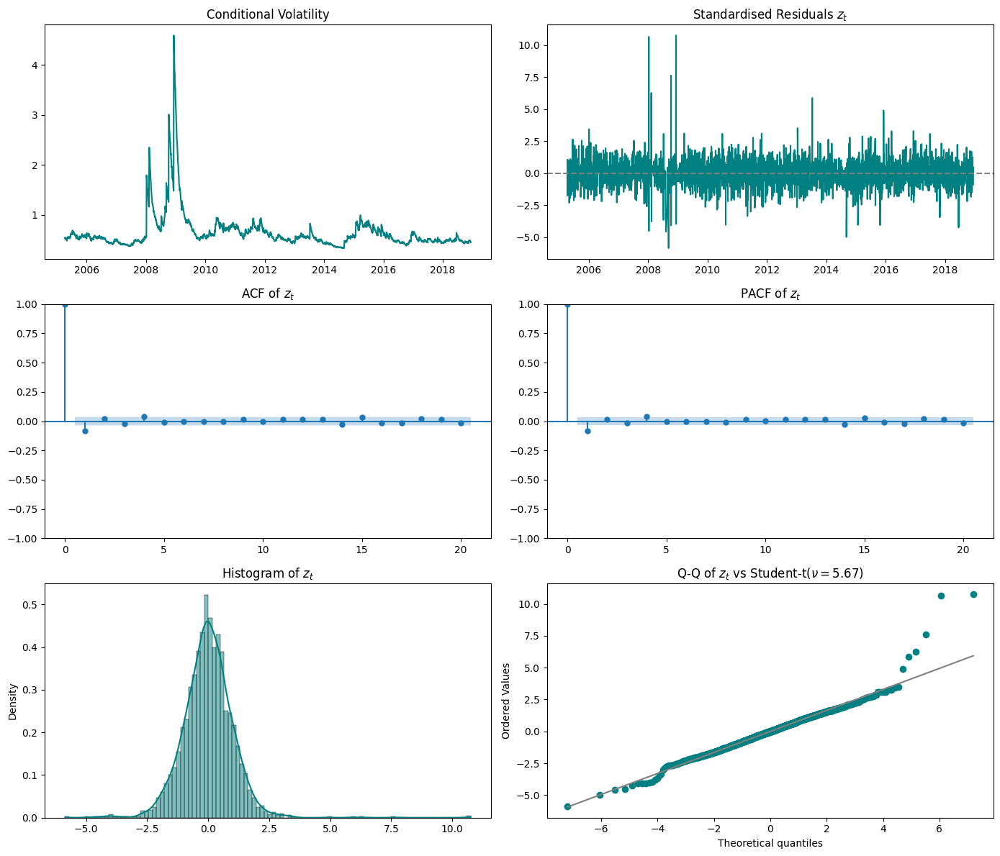

                        Constant Mean - GARCH Model Results                         
Dep. Variable:                      EUR/USD   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -2625.41
Distribution:      Standardized Student's t   AIC:                           5260.83
Method:                  Maximum Likelihood   BIC:                           5290.81
                                              No. Observations:                 2970
Date:                      Sun, Sep 07 2025   Df Residuals:                     2969
Time:                              10:27:50   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
m

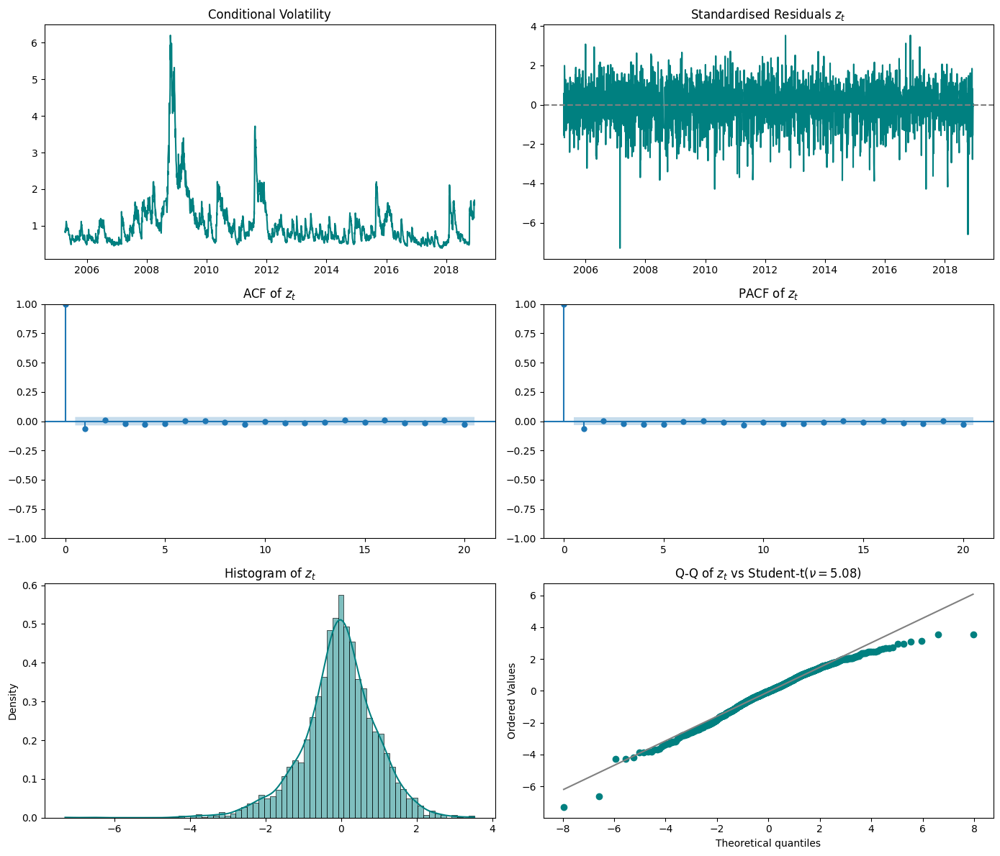

                        Constant Mean - GARCH Model Results                         
Dep. Variable:                       S&P500   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -3796.12
Distribution:      Standardized Student's t   AIC:                           7602.25
Method:                  Maximum Likelihood   BIC:                           7632.23
                                              No. Observations:                 2970
Date:                      Sun, Sep 07 2025   Df Residuals:                     2969
Time:                              10:27:51   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu  

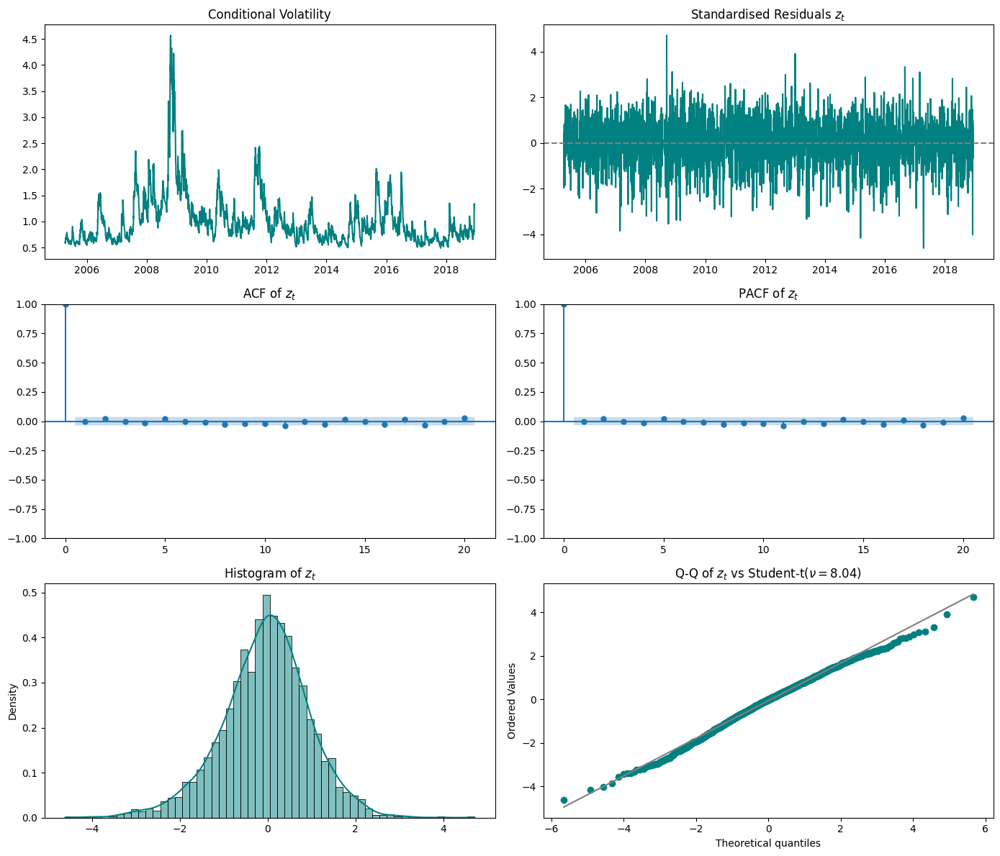

                        Constant Mean - GARCH Model Results                         
Dep. Variable:                      FTSE100   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -3963.94
Distribution:      Standardized Student's t   AIC:                           7937.87
Method:                  Maximum Likelihood   BIC:                           7967.85
                                              No. Observations:                 2970
Date:                      Sun, Sep 07 2025   Df Residuals:                     2969
Time:                              10:27:53   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu  

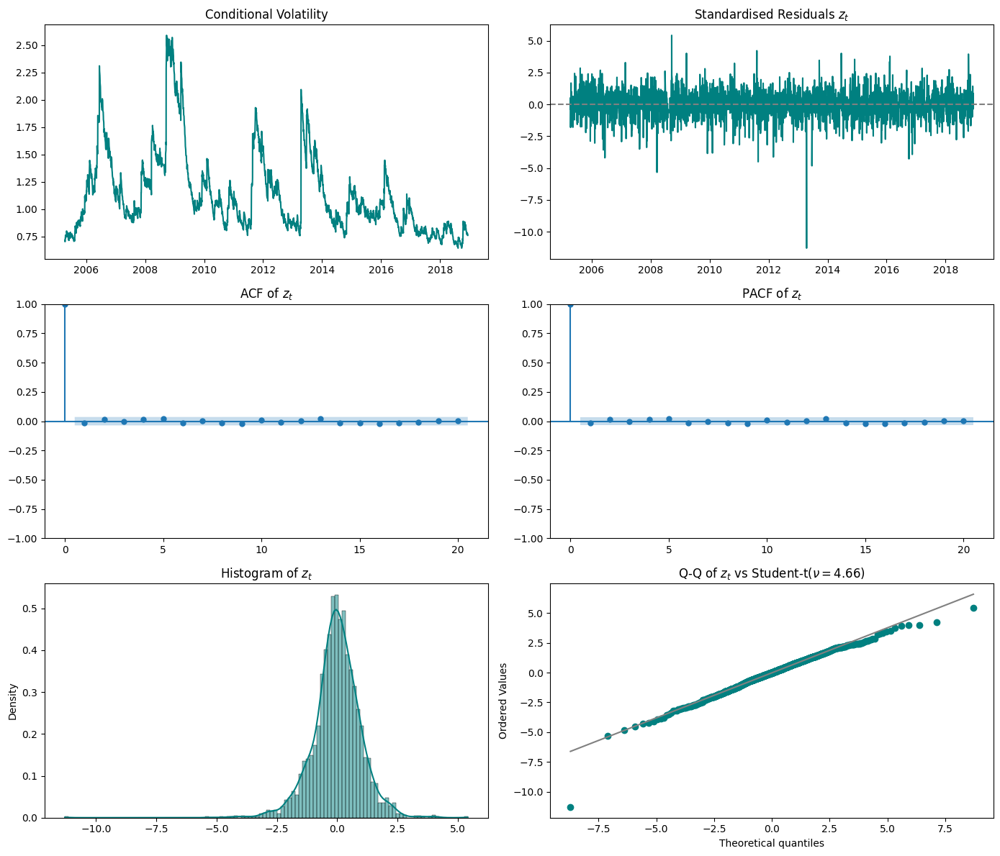

                        Constant Mean - GARCH Model Results                         
Dep. Variable:                         Gold   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -4299.10
Distribution:      Standardized Student's t   AIC:                           8608.20
Method:                  Maximum Likelihood   BIC:                           8638.18
                                              No. Observations:                 2970
Date:                      Sun, Sep 07 2025   Df Residuals:                     2969
Time:                              10:27:54   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
m

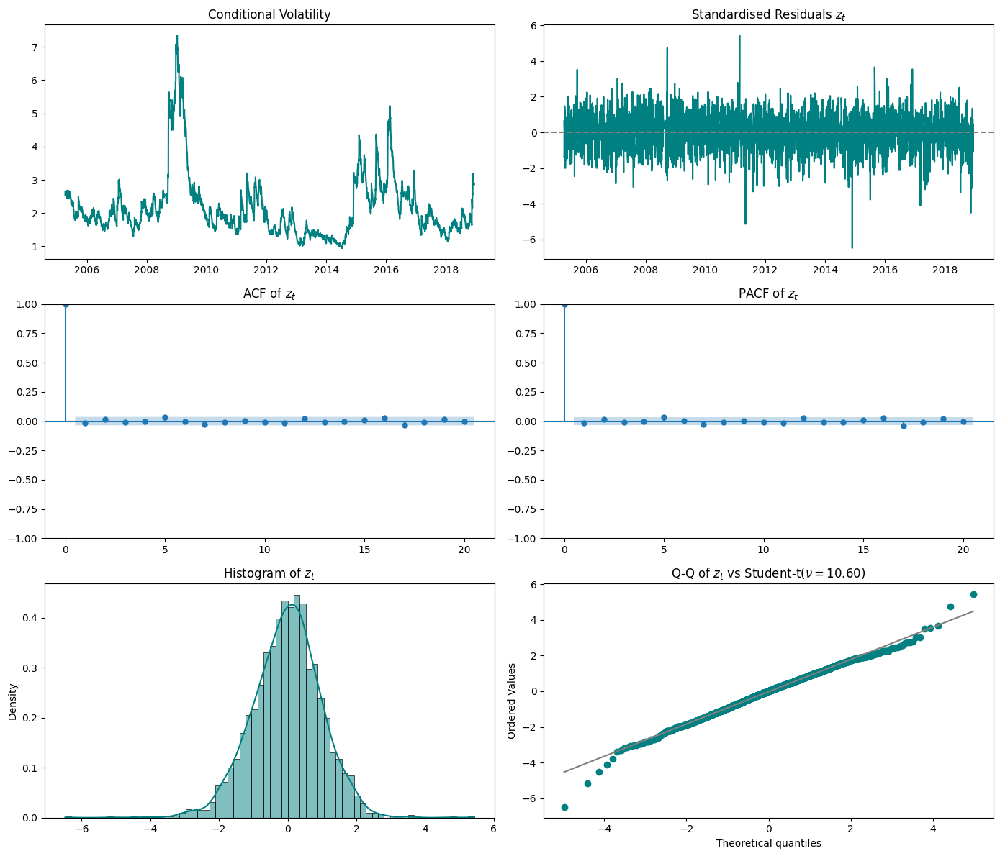

                        Constant Mean - GARCH Model Results                         
Dep. Variable:                    Crude Oil   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -6271.17
Distribution:      Standardized Student's t   AIC:                           12552.3
Method:                  Maximum Likelihood   BIC:                           12582.3
                                              No. Observations:                 2970
Date:                      Sun, Sep 07 2025   Df Residuals:                     2969
Time:                              10:27:56   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
m

In [ ]:
# GARCH-t
fits_t, params_t, diag_t = garch_studnet_t(
    in_sample, p=1, q=1, scale_factor=100, lb_lags=20, arch_lags=20)


─ GARCH(1,1) with Normal for EUR/USD (×100)
    • Skewness          :  0.629
    • Kurtosis          :  9.005
    • Ljung-Box  Q(z_t)     (lag 20) : Q= 37.71, p=0.0096
    • Ljung-Box  Q(z_t²)    (lag 20) : Q= 45.97, p=0.0008
    • ARCH-LM   LM(z_t²)    (lag 20) : LM= 47.03, p=0.0006


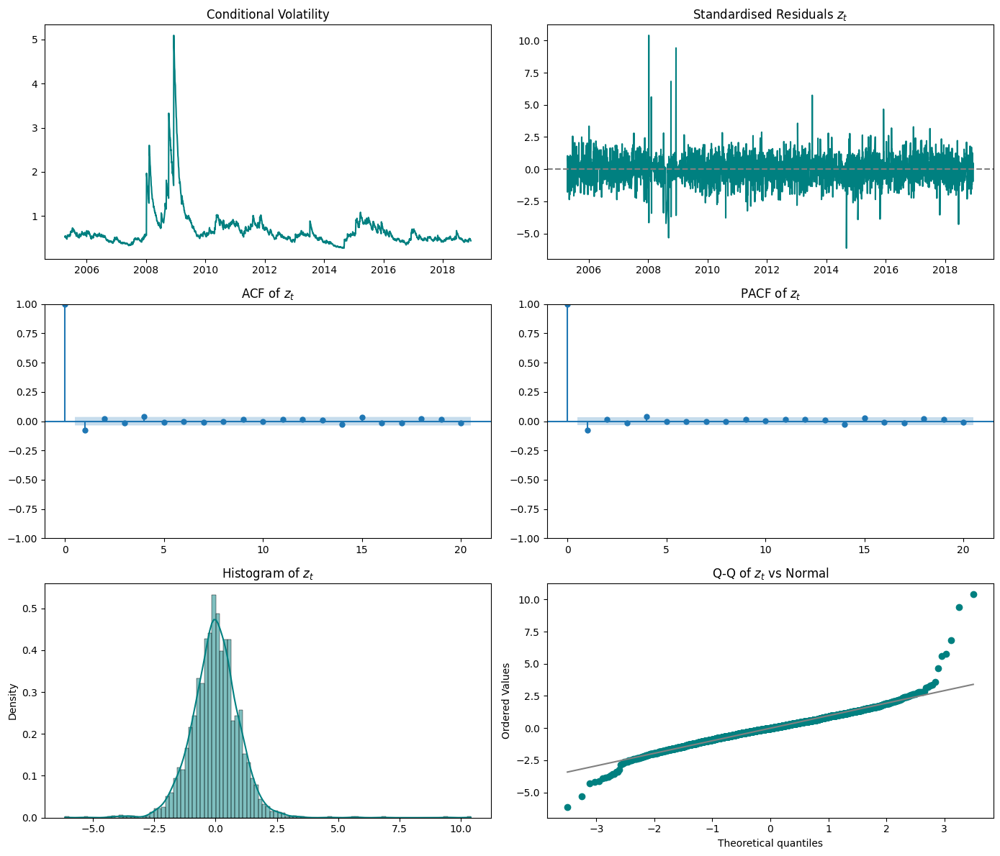

                     Constant Mean - GARCH Model Results                      
Dep. Variable:                EUR/USD   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -2803.75
Distribution:                  Normal   AIC:                           5615.50
Method:            Maximum Likelihood   BIC:                           5639.48
                                        No. Observations:                 2970
Date:                Sun, Sep 07 2025   Df Residuals:                     2969
Time:                        10:27:57   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu             0.0116  9.982e-03      1.158      0.247 

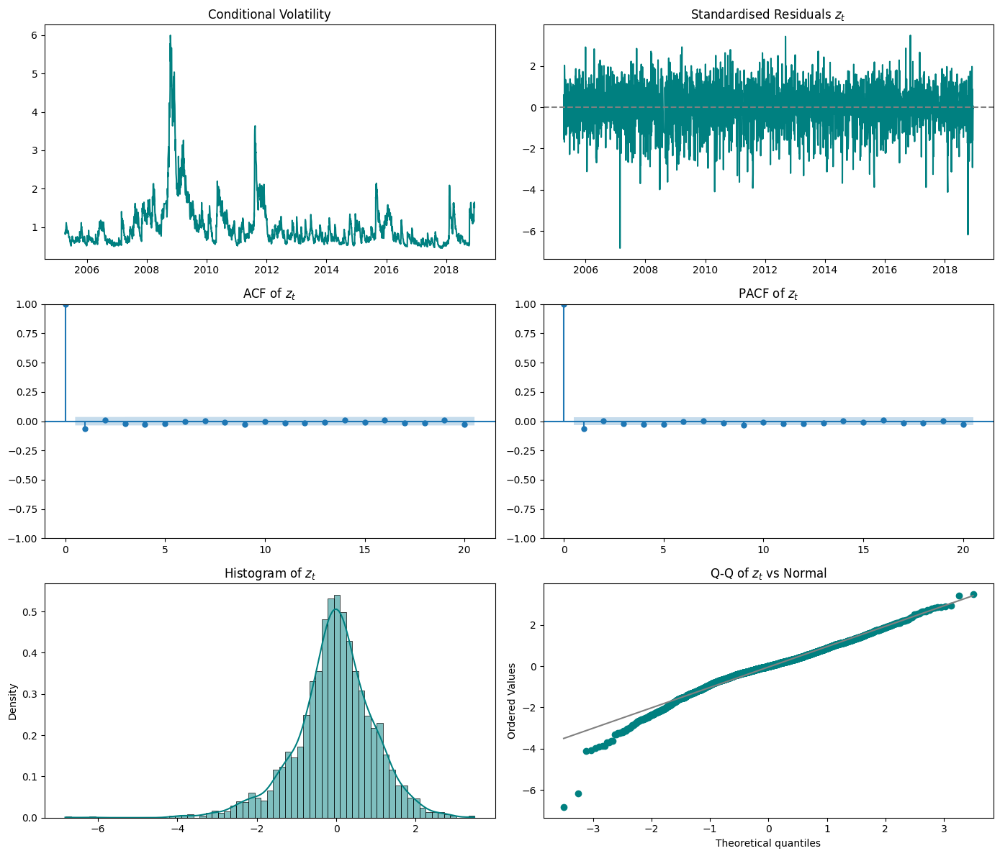

                     Constant Mean - GARCH Model Results                      
Dep. Variable:                 S&P500   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -3888.17
Distribution:                  Normal   AIC:                           7784.34
Method:            Maximum Likelihood   BIC:                           7808.33
                                        No. Observations:                 2970
Date:                Sun, Sep 07 2025   Df Residuals:                     2969
Time:                        10:27:59   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu             0.0654  1.381e-02      4.730  2.240e-06 [3.

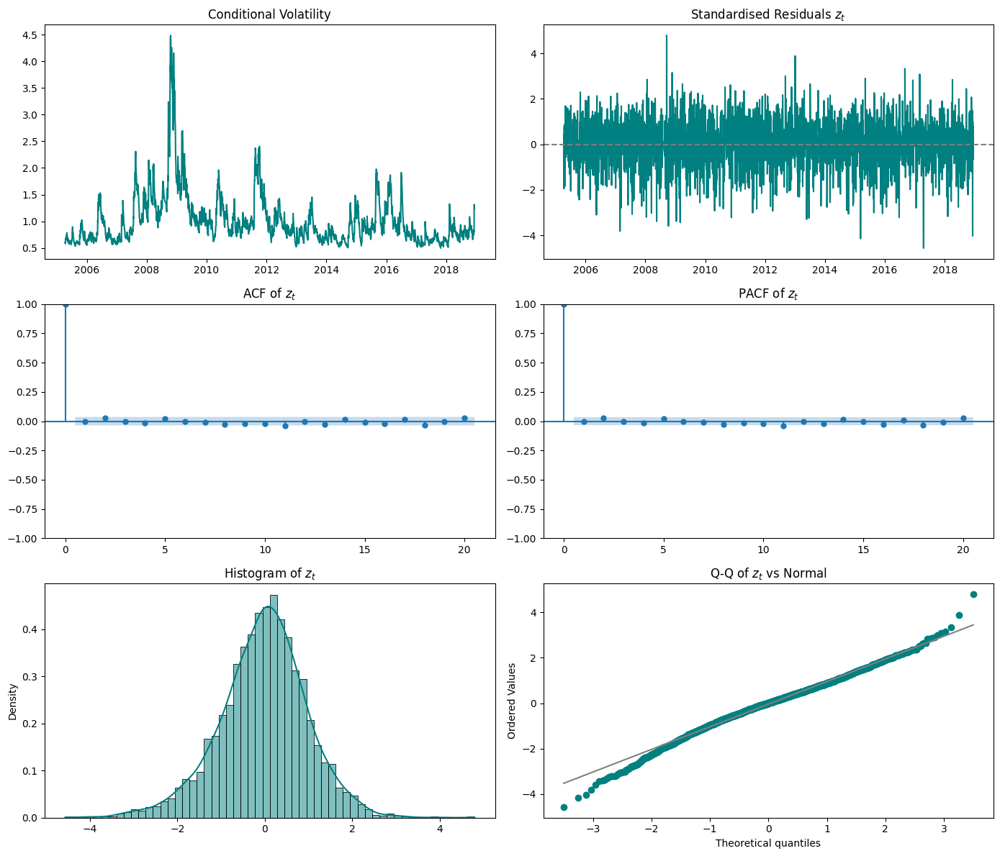

                     Constant Mean - GARCH Model Results                      
Dep. Variable:                FTSE100   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -3999.15
Distribution:                  Normal   AIC:                           8006.30
Method:            Maximum Likelihood   BIC:                           8030.29
                                        No. Observations:                 2970
Date:                Sun, Sep 07 2025   Df Residuals:                     2969
Time:                        10:28:00   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu             0.0407  1.558e-02      2.615  8.930e-03 [1.

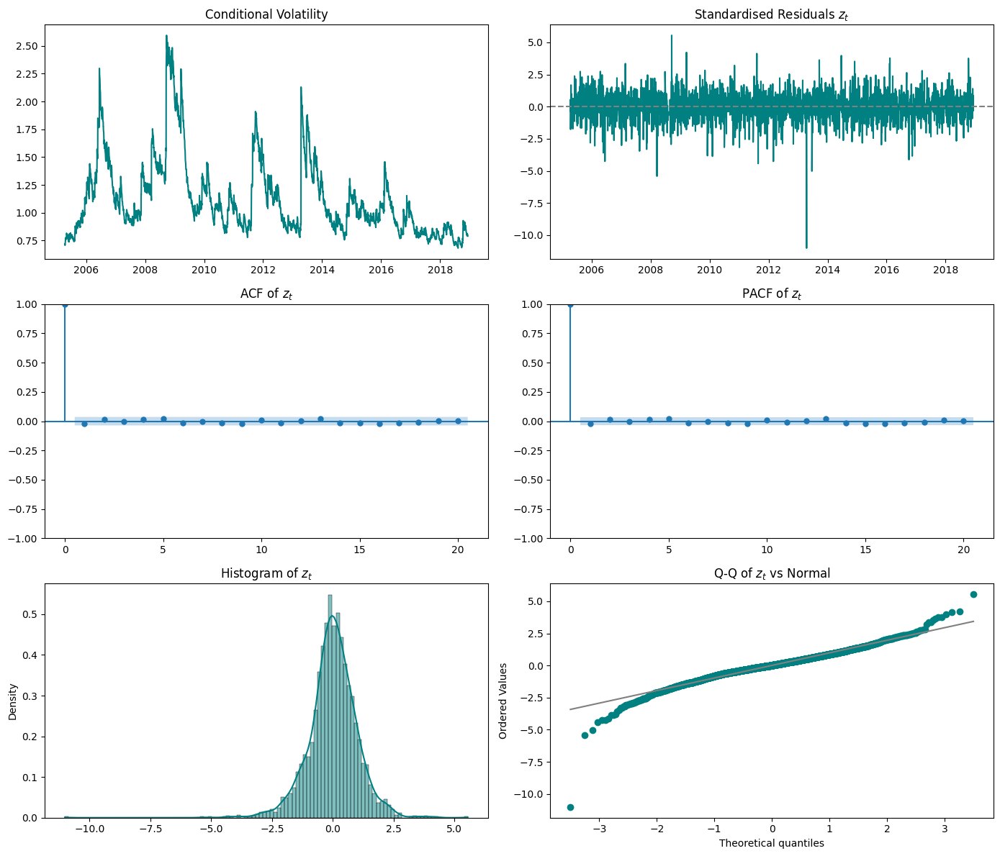

                     Constant Mean - GARCH Model Results                      
Dep. Variable:                   Gold   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -4457.49
Distribution:                  Normal   AIC:                           8922.99
Method:            Maximum Likelihood   BIC:                           8946.97
                                        No. Observations:                 2970
Date:                Sun, Sep 07 2025   Df Residuals:                     2969
Time:                        10:28:04   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu         8.7277e-03  1.912e-02      0.457      0.648 

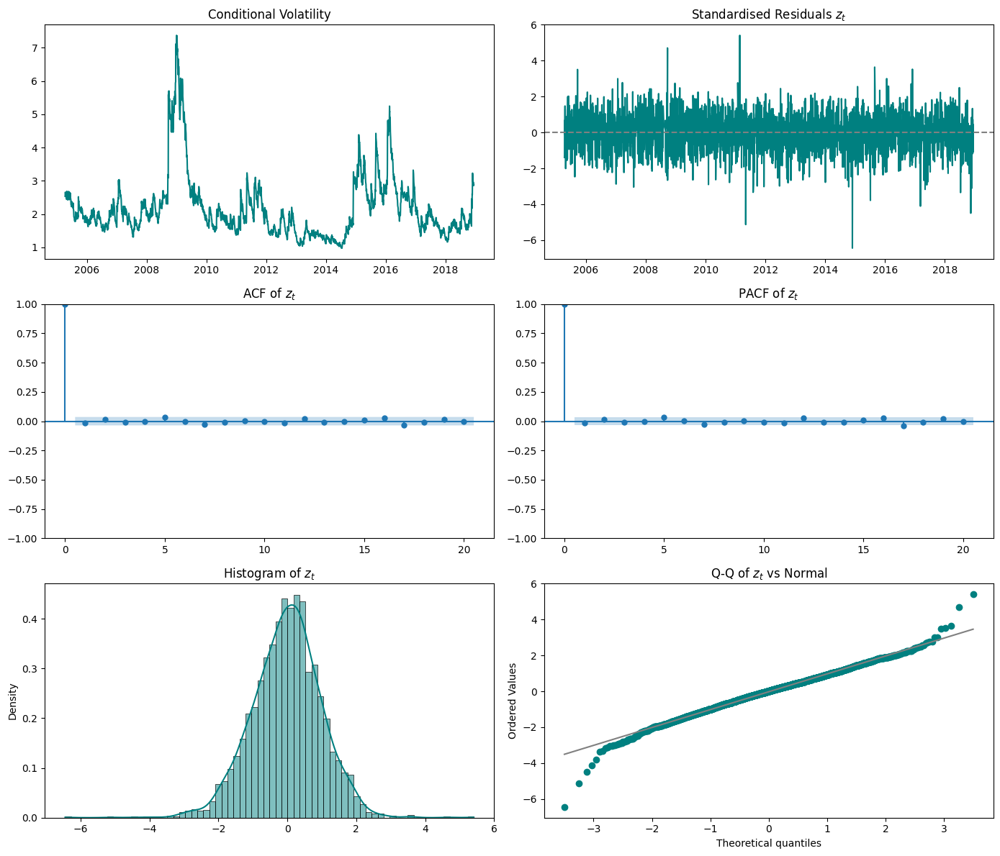

                     Constant Mean - GARCH Model Results                      
Dep. Variable:              Crude Oil   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -6304.47
Distribution:                  Normal   AIC:                           12616.9
Method:            Maximum Likelihood   BIC:                           12640.9
                                        No. Observations:                 2970
Date:                Sun, Sep 07 2025   Df Residuals:                     2969
Time:                        10:28:06   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu             0.0290  3.272e-02      0.885      0.376 

In [ ]:
# GARCH(1,1)
fits_norm, params_norm, resids_norm, diag_norm = garch_normal(
    in_sample,
    p=1, q=1,
    scale_factor=100,
    lb_lags=20,
    arch_lags=20)


─ AR(1)-GARCH(1,2) with Student-t for EUR/USD (×100)
    • Skewness          :  0.764
    • Kurtosis          : 10.148
    • Ljung-Box  Q(z_t)     (lag 20) : Q= 20.73, p=0.4133
    • Ljung-Box  Q(z_t²)    (lag 20) : Q= 27.40, p=0.1245
    • ARCH-LM   LM(z_t²)    (lag 20) : LM= 27.40, p=0.1244


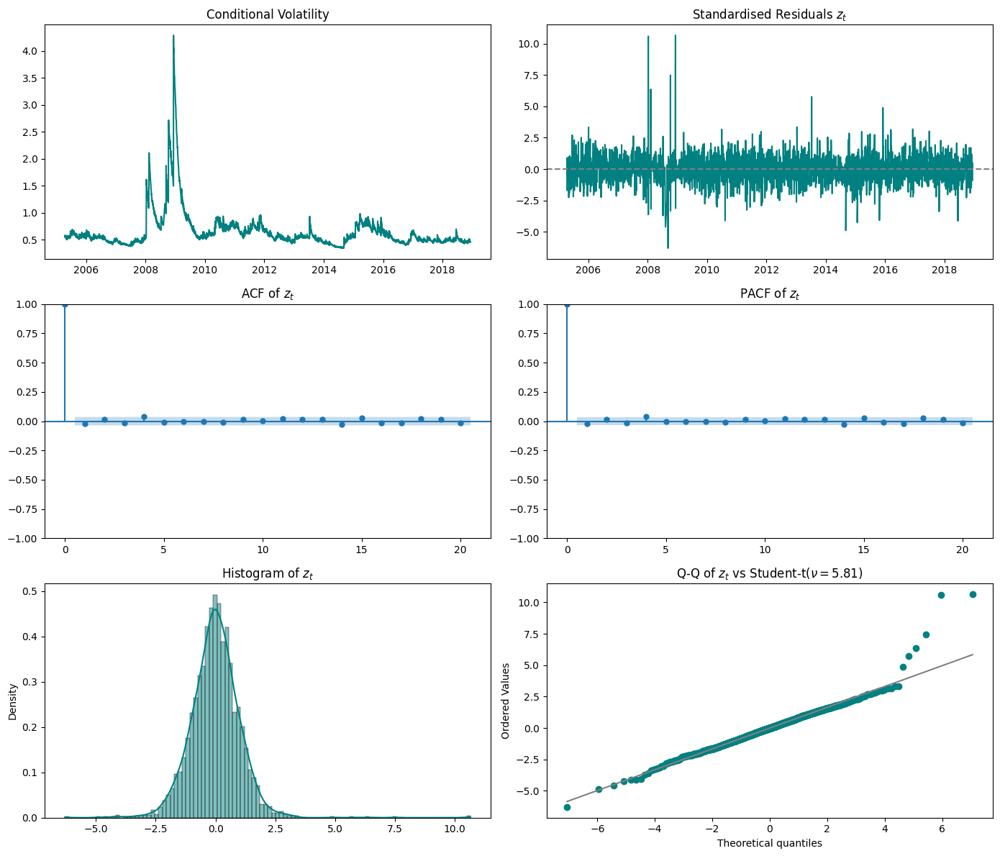

                              AR - GARCH Model Results                              
Dep. Variable:                      EUR/USD   R-squared:                       0.023
Mean Model:                              AR   Adj. R-squared:                  0.023
Vol Model:                            GARCH   Log-Likelihood:               -2616.10
Distribution:      Standardized Student's t   AIC:                           5246.20
Method:                  Maximum Likelihood   BIC:                           5288.17
                                              No. Observations:                 2969
Date:                      Sun, Sep 07 2025   Df Residuals:                     2967
Time:                              10:28:08   Df Model:                            2
                                  Mean Model                                  
                 coef    std err          t      P>|t|        95.0% Conf. Int.
-----------------------------------------------------------------------------

In [ ]:
# AR(1)-GARCH(1,2)
fits_ar_garch, parameters_ar_garch, edf_resids_argarch, diag_ar_t = ar1_garch_student_t_eurusd(
    in_sample, p=1, q=2, scale_factor=100, lb_lags=20, arch_lags=20)


## 2.5. Forecasts

### 2.5.1. Forecast Functions

In [ ]:
from scipy.stats import t

def forecast_garch_t(model_fits, in_sample, out_sample, alpha):
    all_forecasts = []

    for asset in [col for col in in_sample.columns if col.lower() not in ['date', 'eur/usd']]:
        fit = model_fits[asset]
        omega = fit.params['omega']
        alpha1 = fit.params['alpha[1]']
        beta1 = fit.params['beta[1]']
        nu = fit.params.get('nu')  # Degrees of freedom for Student-t

        if nu is None:
            raise ValueError(f"Degrees of freedom 'nu' not found for {asset}. Ensure model is fitted with Student-t distribution.")

        # Initialize conditional variance
        last_vol = fit.conditional_volatility.iloc[-1]
        cond_var = last_vol**2

        # Student-t quantile and ES coefficient
        z_alpha = t.ppf(alpha, df=nu)
        pdf_z = t.pdf(z_alpha, df=nu)
        es_coef = ((nu + z_alpha**2) / (nu - 1)) * pdf_z / alpha

        forecast_dates = pd.to_datetime(out_sample['Date'])
        forecast_returns = out_sample[asset].values
        forecast_var = []
        forecast_es = []

        for r in forecast_returns:
            # Forecast variance
            cond_var = omega + alpha1 * (r * 100)**2 + beta1 * cond_var
            cond_std = np.sqrt(cond_var)

            var_t = z_alpha * cond_std / 100
            es_t = -es_coef * cond_std / 100

            forecast_var.append(var_t)
            forecast_es.append(es_t)

        df_asset = pd.DataFrame({
            'Date': forecast_dates,
            'Asset': asset,
            'Alpha': alpha,
            'Actual Return': forecast_returns,
            'VaR': forecast_var,
            'ES': forecast_es
        })

        all_forecasts.append(df_asset)

        # Plotting
        plt.figure(figsize=(14, 6))
        plt.plot(df_asset['Date'], df_asset['Actual Return'], label="Actual")
        plt.plot(df_asset['Date'], df_asset['VaR'], label=f"VaR ({int(alpha*100)}%)")
        plt.plot(df_asset['Date'], df_asset['ES'], label=f"ES ({int(alpha*100)}%)")
        plt.title(f'Forecasted VaR and ES, Garch(1,1)-t - {asset}')
        plt.xlabel('Date')
        plt.ylabel('Returns')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    final_df = pd.concat(all_forecasts, ignore_index=True)
    return final_df


In [ ]:
def forecast_garch_normal(model_fits, in_sample, out_sample, alpha):
    all_forecasts = []

    for asset in [col for col in in_sample.columns if col.lower() not in ['date', 'eur/usd']]:
        fit = model_fits[asset]
        omega = fit.params['omega']
        alpha1 = fit.params['alpha[1]']
        beta1 = fit.params['beta[1]']

        # Initialize conditional variance
        last_vol = fit.conditional_volatility.iloc[-1]
        cond_var = last_vol**2

        z_alpha = norm.ppf(alpha)
        es_coef = norm.pdf(z_alpha) / alpha

        forecast_dates = pd.to_datetime(out_sample['Date'])
        forecast_returns = out_sample[asset].values
        forecast_var = []
        forecast_es = []

        for r in forecast_returns:
            # Forecast variance
            cond_var = omega + alpha1 * (r * 100)**2 + beta1 * cond_var
            cond_std = np.sqrt(cond_var)

            var_t = z_alpha * cond_std / 100
            es_t = -es_coef * cond_std / 100

            forecast_var.append(var_t)
            forecast_es.append(es_t)

        df_asset = pd.DataFrame({
            'Date': forecast_dates,
            'Asset': asset,
            'Alpha': alpha,
            'Actual Return': forecast_returns,
            'VaR': forecast_var,
            'ES': forecast_es
        })

        all_forecasts.append(df_asset)

        # Plotting
        plt.figure(figsize=(14, 6))
        plt.plot(df_asset['Date'], df_asset['Actual Return'], label="Actual")
        plt.plot(df_asset['Date'], df_asset['VaR'], label=f"VaR ({int(alpha*100)}%)")
        plt.plot(df_asset['Date'], df_asset['ES'], label=f"ES ({int(alpha*100)}%)")
        plt.title(f'Forecasted VaR and ES, Garch(1,1)-N - {asset}')
        plt.xlabel('Date')
        plt.ylabel('Returns')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    final_df = pd.concat(all_forecasts, ignore_index=True)
    return final_df


In [ ]:
def forecast_ar1_garch12_t(model_fits, in_sample, out_sample,
                            alpha, scale_factor=100):
    """
    Forecast VaR and ES for EUR/USD using AR(1)-GARCH(1,2) with Student-t innovations,
    """
    asset = 'EUR/USD'
    out = out_sample.copy()
    forecast_dates = out['Date']
    forecast_returns = out[asset].values

    fit = model_fits[asset]

    # Extract GARCH(1,2)-t parameters
    ω = fit.params['omega']
    α1 = fit.params['alpha[1]']
    β1 = fit.params['beta[1]']
    β2 = fit.params.get('beta[2]', 0.0)
    φ1 = fit.params.get('ar.L1', 0.0)
    ν = fit.params['nu']
    μ = fit.params.get('mu', 0.0)

    # Student-t quantile and ES coefficient
    z_alpha = t.ppf(alpha, df=ν)
    pdf_z = t.pdf(z_alpha, df=ν)
    es_coef = ((ν + z_alpha**2) / (ν - 1)) * pdf_z / alpha

    last_vol = fit.conditional_volatility.iloc[-1]
    cond_var_1 = last_vol**2
    cond_var_2 = cond_var_1  # for GARCH(1,2)

    # Retrieve previous two realized returns (scaled)
    prev_ret = in_sample[asset].iloc[-1] * scale_factor
    prev2_ret = in_sample[asset].iloc[-2] * scale_factor

    forecast_var = []
    forecast_es = []

    for r in forecast_returns:
        r_scaled = r * scale_factor

        forecast_mean = μ + φ1 * prev_ret

        # Variance recursion with realized returns
        cond_var = (
            ω
            + α1 * prev_ret**2
            + β1 * cond_var_1
            + β2 * cond_var_2
        )
        cond_std = np.sqrt(cond_var)

        var_t = z_alpha * cond_std / scale_factor
        es_t = -es_coef * cond_std / scale_factor

        forecast_var.append(var_t)
        forecast_es.append(es_t)

        # Update lags
        cond_var_2 = cond_var_1
        cond_var_1 = cond_var
        prev2_ret = prev_ret
        prev_ret = r_scaled

    df_forecasts = pd.DataFrame({
        'Date': forecast_dates,
        'Asset': asset,
        'Alpha': alpha,
        'Actual Return': forecast_returns,
        'VaR': forecast_var,
        'ES': forecast_es
    })

    plt.figure(figsize=(14, 6))
    plt.plot(df_forecasts['Date'], df_forecasts['Actual Return'], label='Actual')
    plt.plot(df_forecasts['Date'], df_forecasts['VaR'], label=f'VaR ({int(alpha*100)}%)')
    plt.plot(df_forecasts['Date'], df_forecasts['ES'], label=f'ES ({int(alpha*100)}%)')
    plt.title(f'{asset} – Forecasted VaR and ES (AR(1)-GARCH(1,2)-t)')
    plt.xlabel('Date')
    plt.ylabel('Returns')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return df_forecasts

In [ ]:
def forecast_garch_edf(model_fits, edf_resids, in_sample, out_sample, alpha):
    in_sample['Date'] = pd.to_datetime(in_sample['Date'])
    out_sample['Date'] = pd.to_datetime(out_sample['Date'])

    all_forecasts = []

    for asset in [col for col in in_sample.columns if col.lower() not in ['date', 'EUR/USD']]:
        fit = model_fits[asset]
        omega = fit.params['omega']
        alpha1 = fit.params['alpha[1]']
        beta1 = fit.params['beta[1]']

        # EDF-based quantiles and expected shortfall
        z_edf = np.quantile(edf_resids[asset], alpha)
        es_edf = np.mean([z for z in edf_resids[asset] if z < z_edf])

        # Initial conditional variance
        last_vol = fit.conditional_volatility.iloc[-1]
        cond_var = last_vol**2

        forecast_dates = out_sample['Date']
        forecast_returns = out_sample[asset].values
        forecast_var = []
        forecast_es = []

        for r in forecast_returns:
            # GARCH(1,1) variance update
            cond_var = omega + alpha1 * (r * 100)**2 + beta1 * cond_var
            cond_std = np.sqrt(cond_var)

            var_t = z_edf * cond_std / 100
            es_t = es_edf * cond_std / 100

            forecast_var.append(var_t)
            forecast_es.append(es_t)

        df_asset = pd.DataFrame({
            'Date': forecast_dates,
            'Asset': asset,
            'Alpha': alpha,
            'Actual Return': forecast_returns,
            'VaR': forecast_var,
            'ES': forecast_es
        })

        all_forecasts.append(df_asset)

        # Plotting
        plt.figure(figsize=(14, 6))
        plt.plot(df_asset['Date'], df_asset['Actual Return'], label="Actual")
        plt.plot(df_asset['Date'], df_asset['VaR'], label=f"VaR EDF ({int(alpha*100)}%)")
        plt.plot(df_asset['Date'], df_asset['ES'], label=f"ES EDF ({int(alpha*100)}%)")
        plt.title(f'Forecasted VaR and ES (EDF) - {asset}')
        plt.xlabel('Date')
        plt.ylabel('Returns')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    final_df = pd.concat(all_forecasts, ignore_index=True)
    return final_df

In [ ]:
def forecast_ar1_garch_edf_eurusd(model_fits, edf_resids, in_sample, out_sample, alpha, scale_factor=100):
    """
    Forecasts VaR and ES using AR(1)-GARCH(1,2) model and empirical residuals (EDF),
    for EUR/USD only.
    """

    in_sample['Date'] = pd.to_datetime(in_sample['Date'])
    out_sample['Date'] = pd.to_datetime(out_sample['Date'])

    asset = 'EUR/USD'
    if asset not in in_sample.columns:
        raise ValueError(f"'{asset}' not found in input dataframe columns.")

    fit = model_fits[asset]
    omega  = fit.params['omega']
    alpha1 = fit.params['alpha[1]']
    beta1  = fit.params['beta[1]']
    beta2  = fit.params['beta[2]']

    # Extract EDF standardized residuals
    z_edf_array = edf_resids['z_t'].values

    # Empirical quantile and empirical expected shortfall
    z_edf = np.quantile(z_edf_array, alpha)
    es_edf = np.mean(z_edf_array[z_edf_array <= z_edf])

    # Initial variance from last in-sample conditional volatility
    last_vol = fit.conditional_volatility.iloc[-1]
    cond_var = last_vol**2

    forecast_dates = out_sample['Date']
    forecast_returns = out_sample[asset].dropna().values * scale_factor

    forecast_var = []
    forecast_es = []

    prev_ret = (in_sample.set_index('Date')
                            .at[in_sample['Date'].iloc[-1], asset]) * scale_factor

    for r in forecast_returns:
        # GARCH(1,2) update: uses previous squared return and previous variance
        cond_var = omega + alpha1 * (prev_ret**2) + beta1 * cond_var + beta2 * cond_var
        cond_std = np.sqrt(cond_var)

        var_t = z_edf * cond_std / scale_factor
        es_t = es_edf * cond_std / scale_factor

        forecast_var.append(var_t)
        forecast_es.append(es_t)

        prev_ret = r

    df_forecast = pd.DataFrame({
        'Date': forecast_dates,
        'Asset': asset,
        'Alpha': alpha,
        'Actual Return': forecast_returns / scale_factor,
        'VaR': forecast_var,
        'ES': forecast_es
    })

    # Plotting
    plt.figure(figsize=(14, 6))
    plt.plot(df_forecast['Date'], df_forecast['Actual Return'], label="Actual Return")
    plt.plot(df_forecast['Date'], df_forecast['VaR'], label=f"VaR EDF ({int(alpha*100)}%)")
    plt.plot(df_forecast['Date'], df_forecast['ES'], label=f"ES EDF ({int(alpha*100)}%)")
    plt.title(f'Forecasted VaR and ES (EDF) - {asset}')
    plt.xlabel('Date')
    plt.ylabel('Returns')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return df_forecast


### 2.5.2. Forecast Output

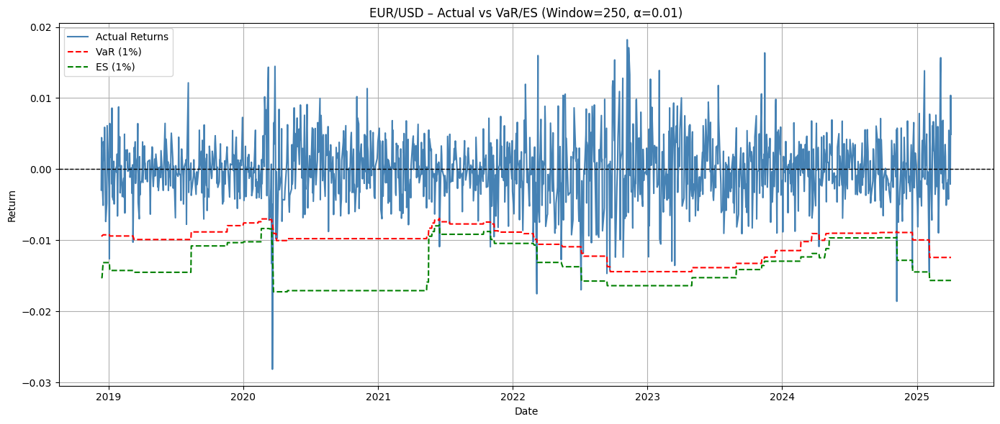

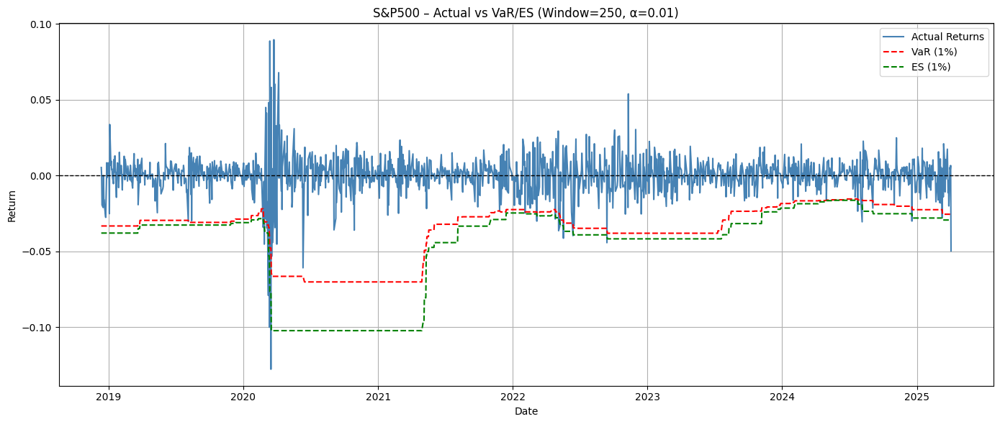

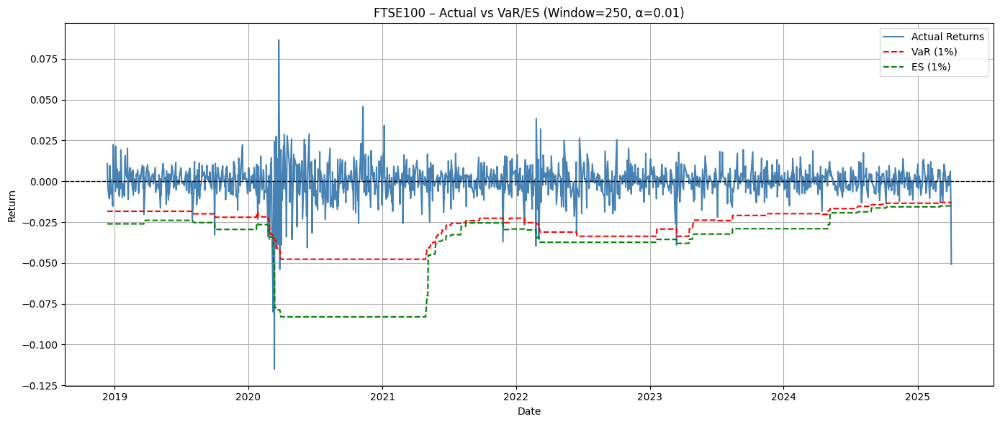

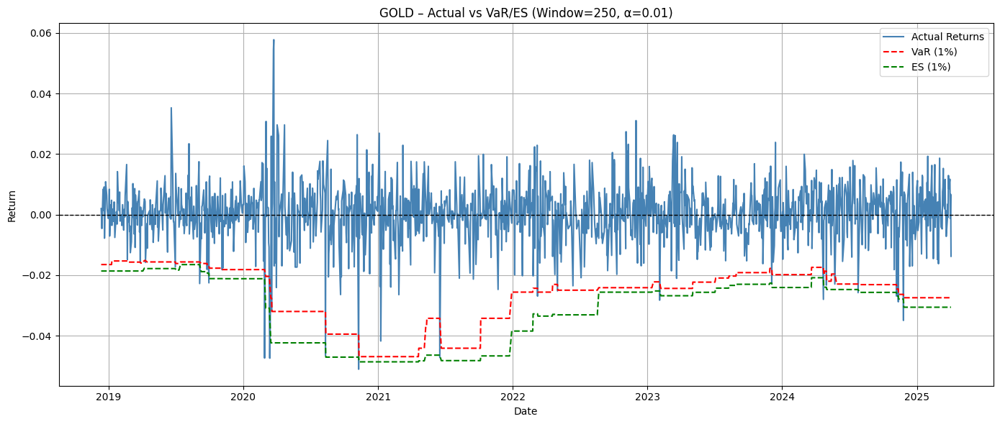

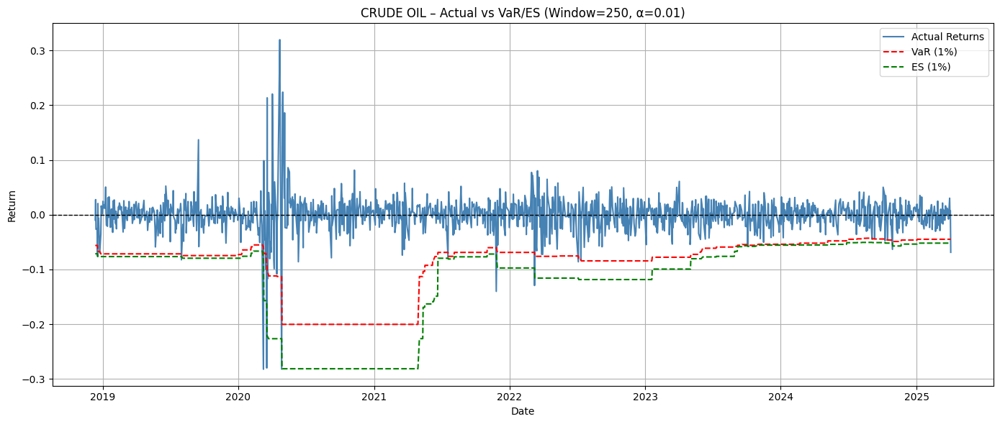

In [ ]:
rolling_window_250_df_1percent = rolling_window(in_sample, out_sample, window_sizes=[250], alphas=[0.01])

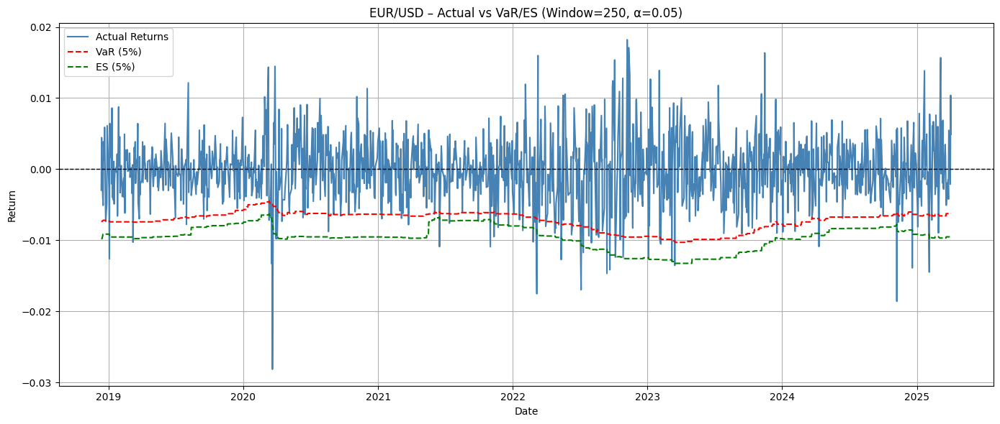

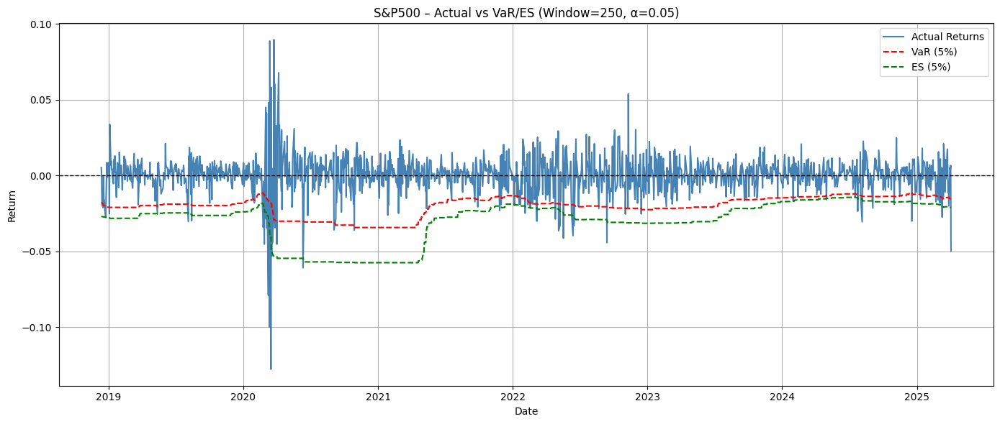

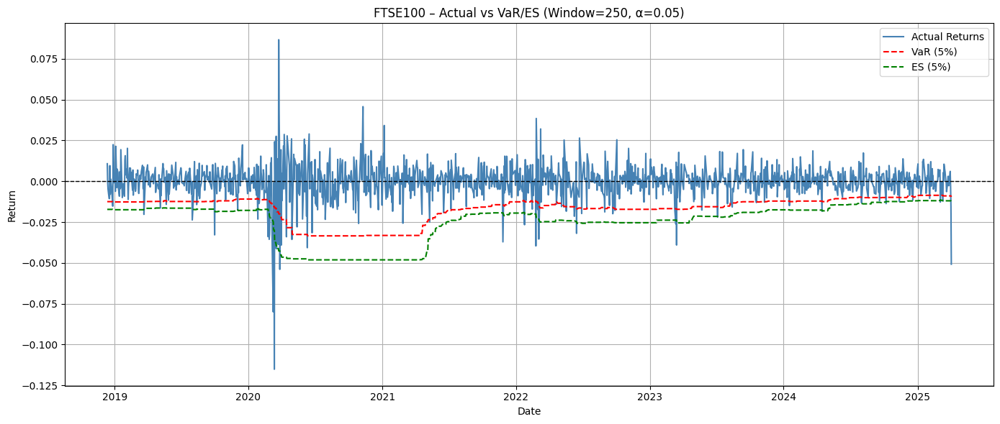

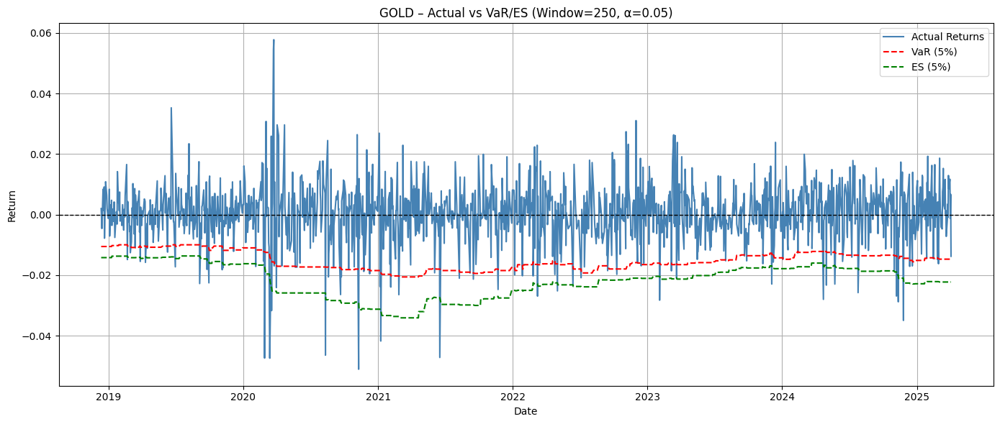

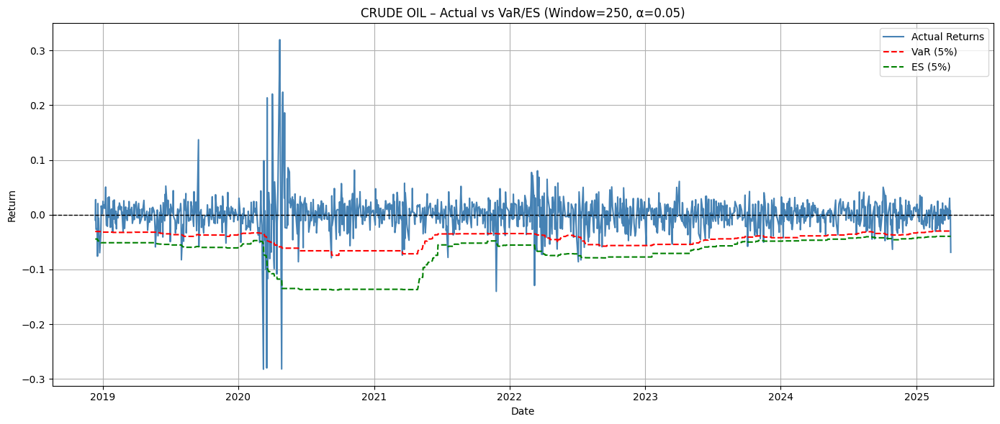

In [ ]:
rolling_window_250_df_5percent = rolling_window(in_sample, out_sample, window_sizes=[250], alphas=[0.05])

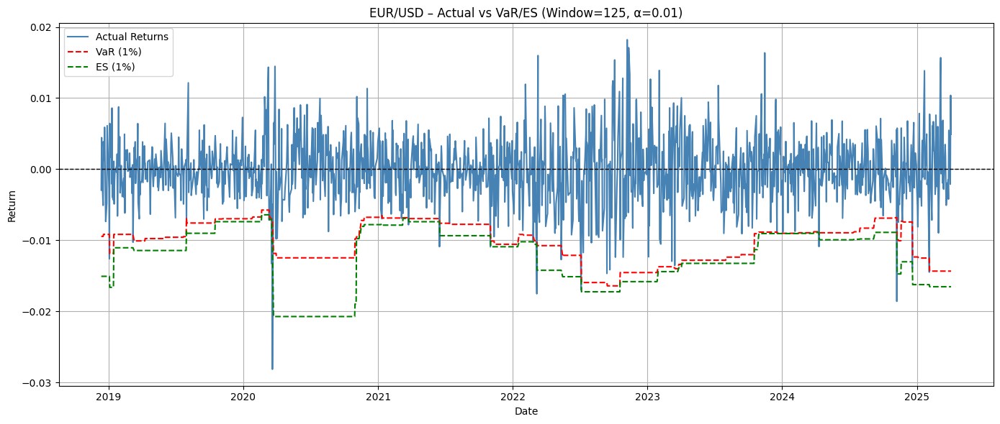

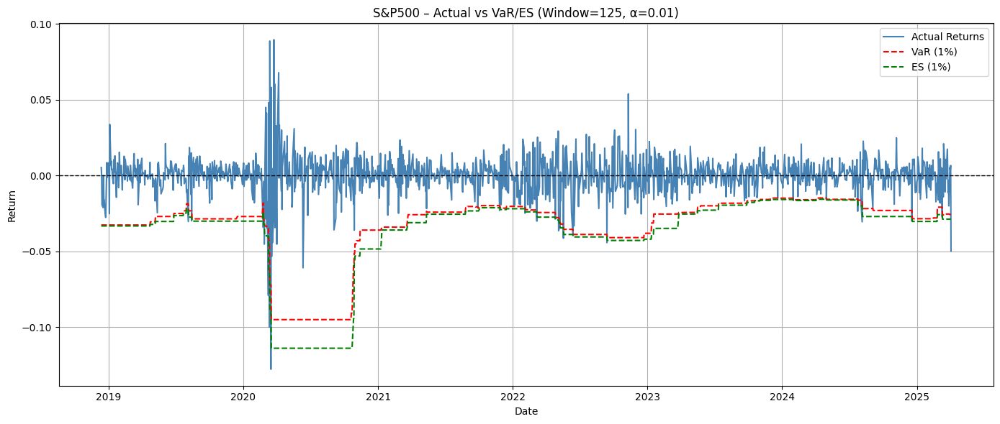

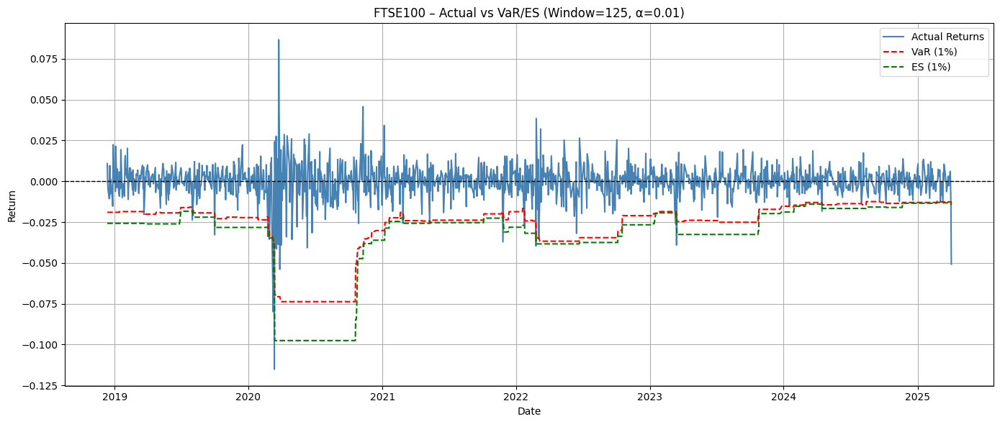

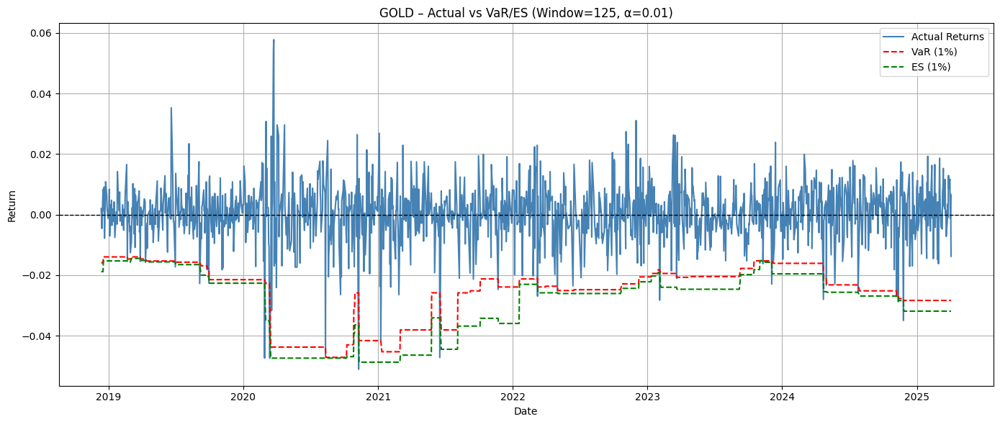

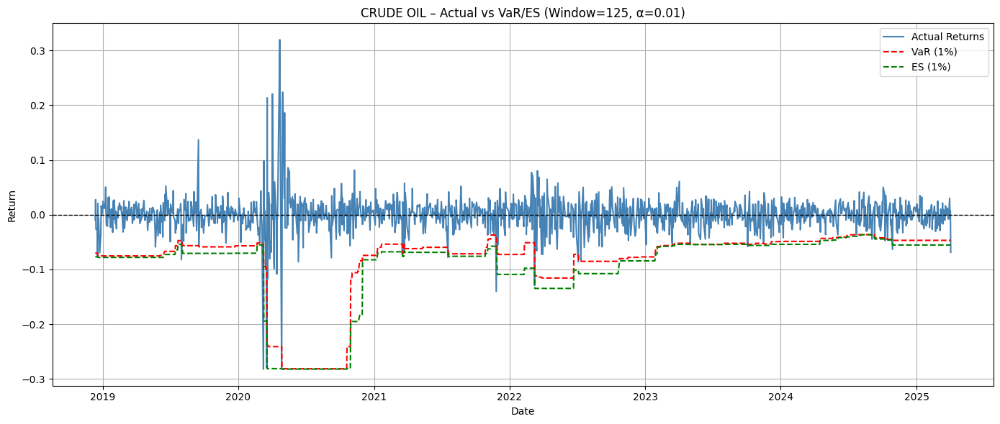

In [ ]:
rolling_window_125_df_1percent = rolling_window(in_sample, out_sample, window_sizes=[125], alphas=[0.01])

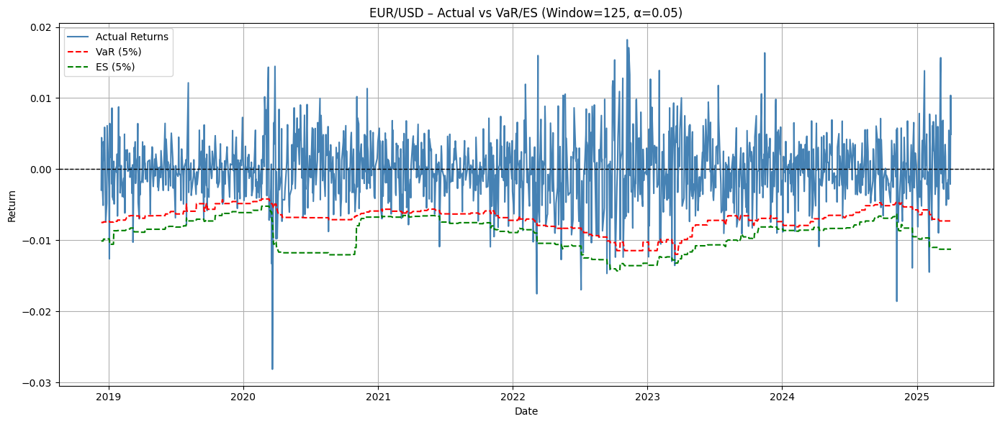

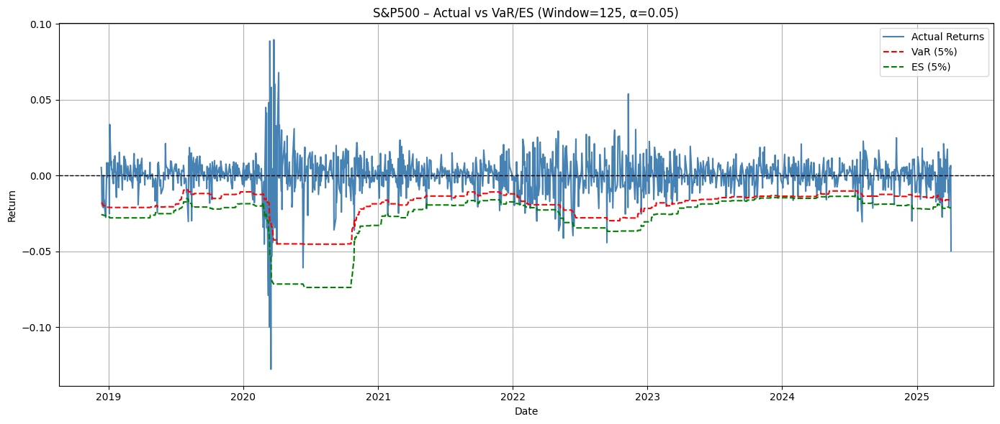

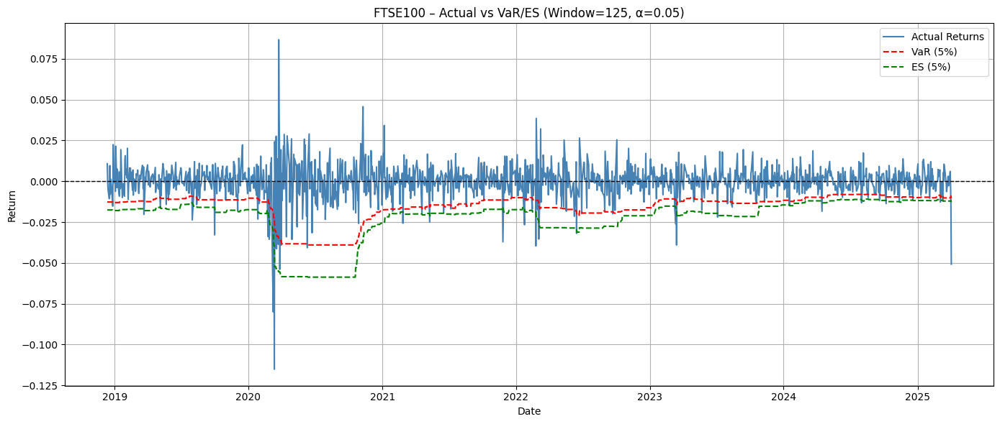

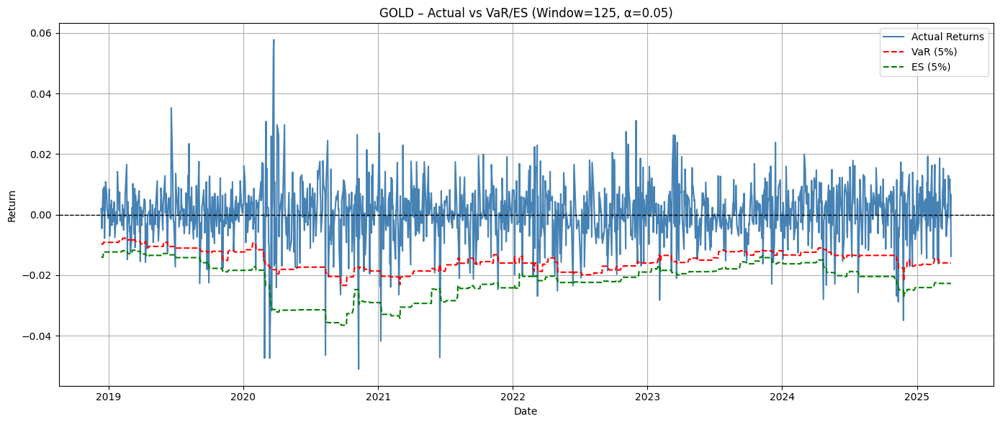

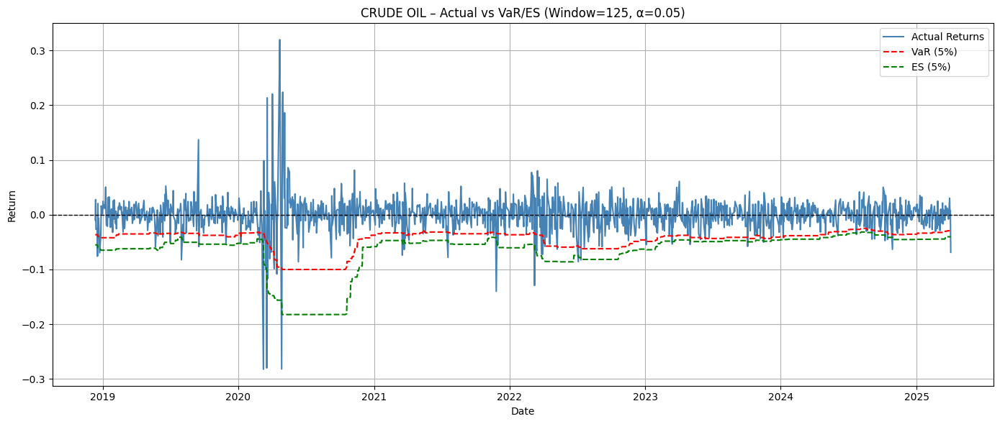

In [ ]:
rolling_window_125_df_5percent = rolling_window(in_sample, out_sample, window_sizes=[125], alphas=[0.05])

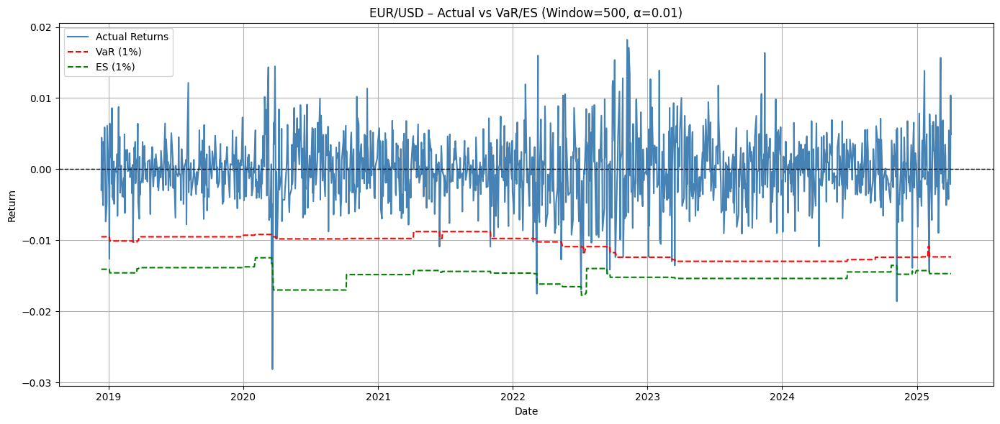

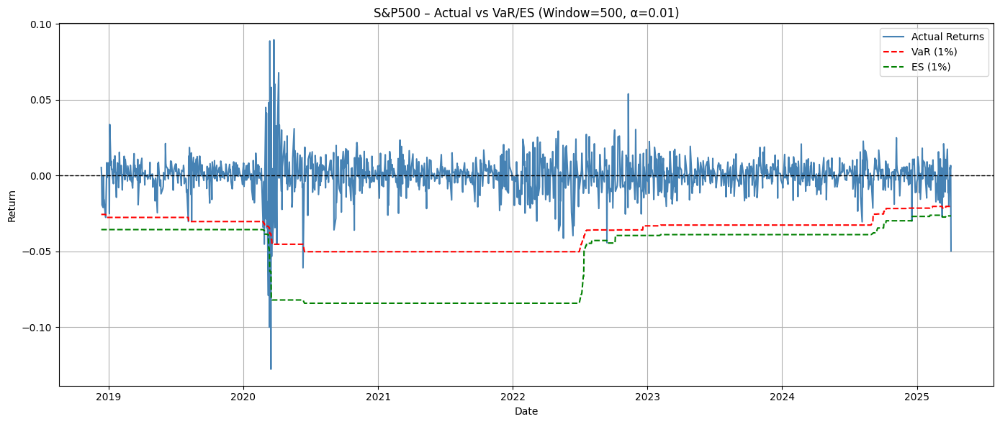

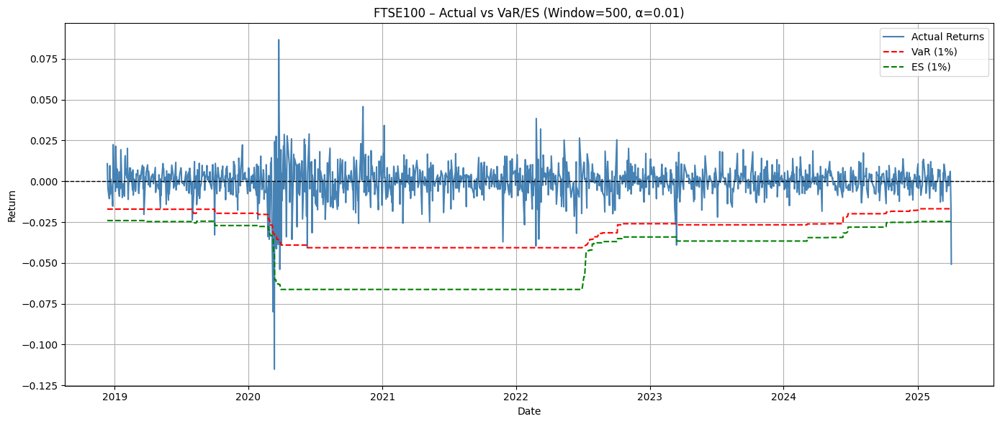

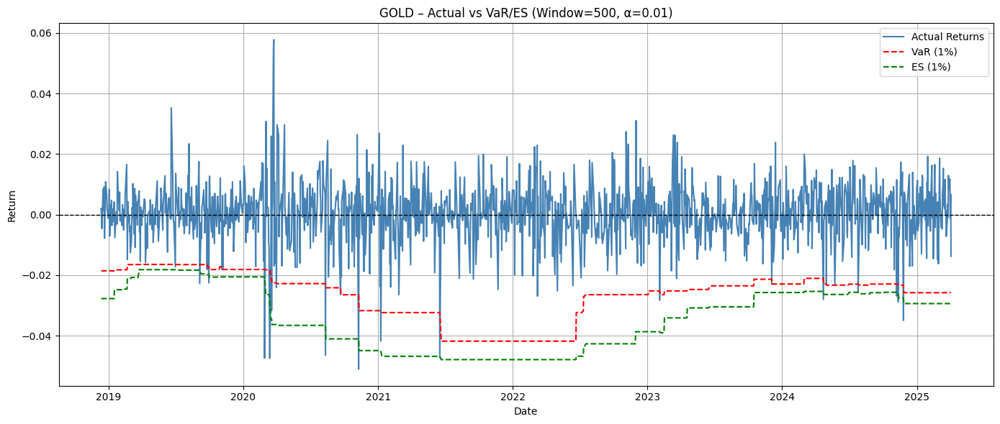

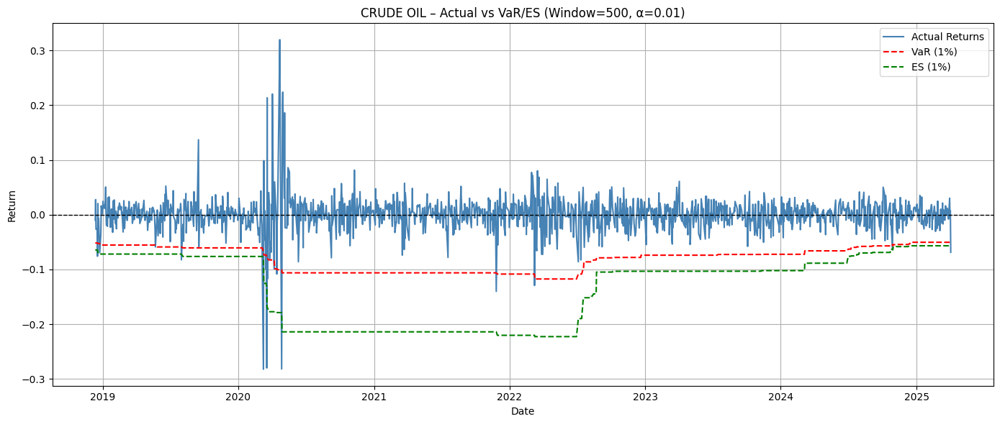

In [ ]:
rolling_window_500_df_1percent = rolling_window(in_sample, out_sample, window_sizes=[500], alphas=[0.01])

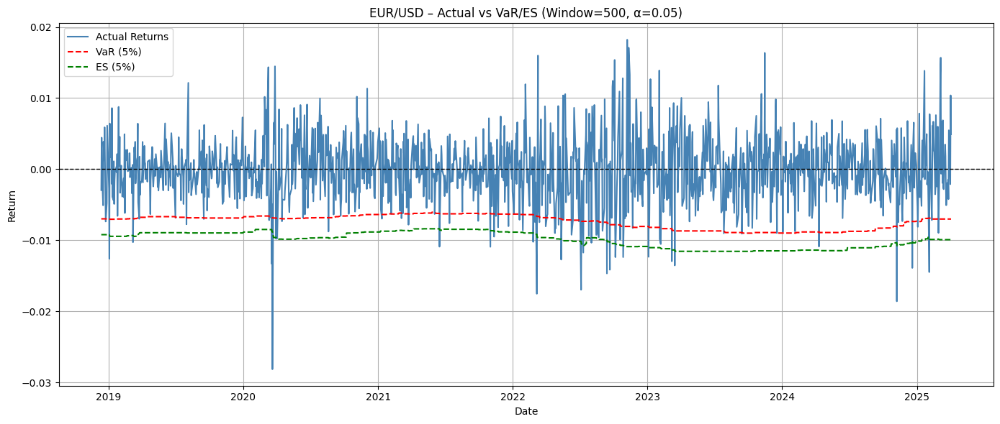

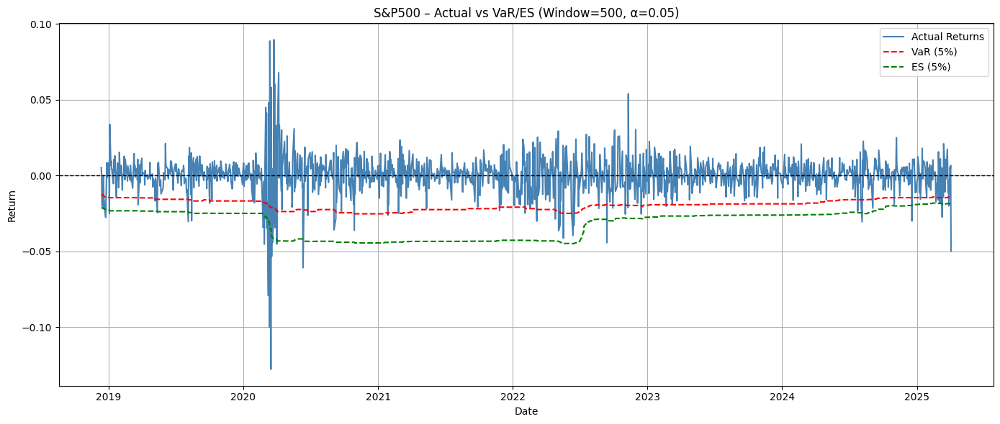

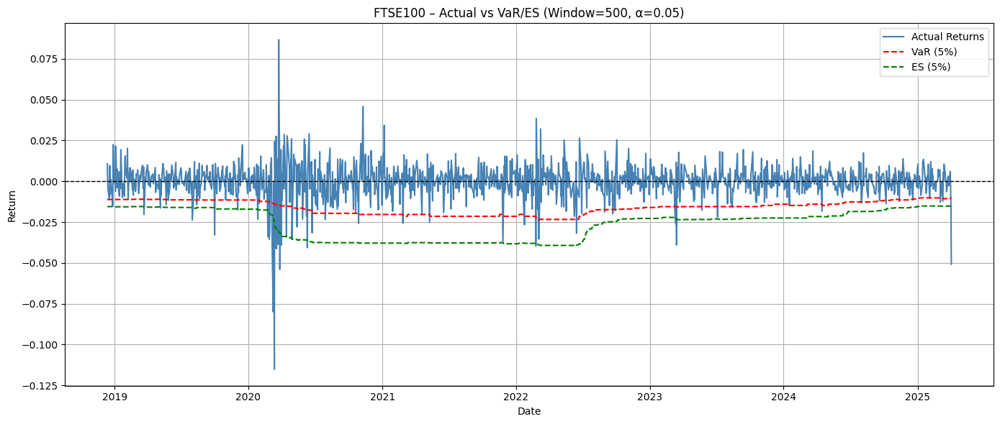

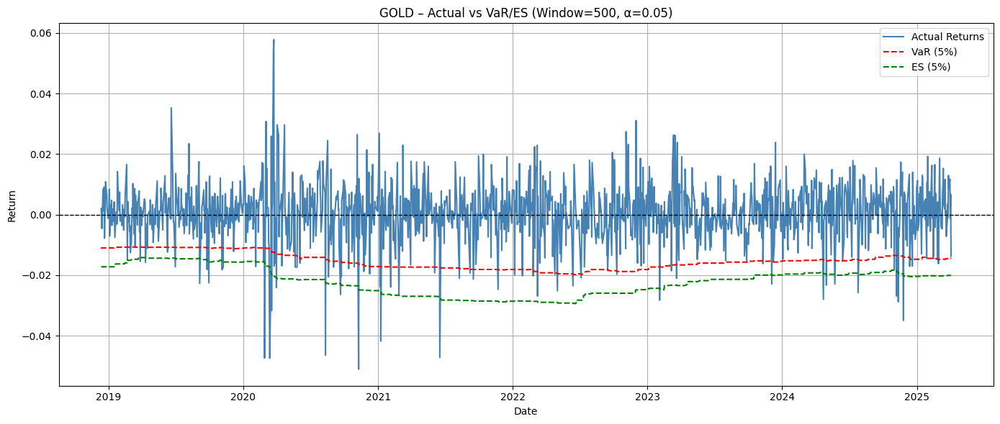

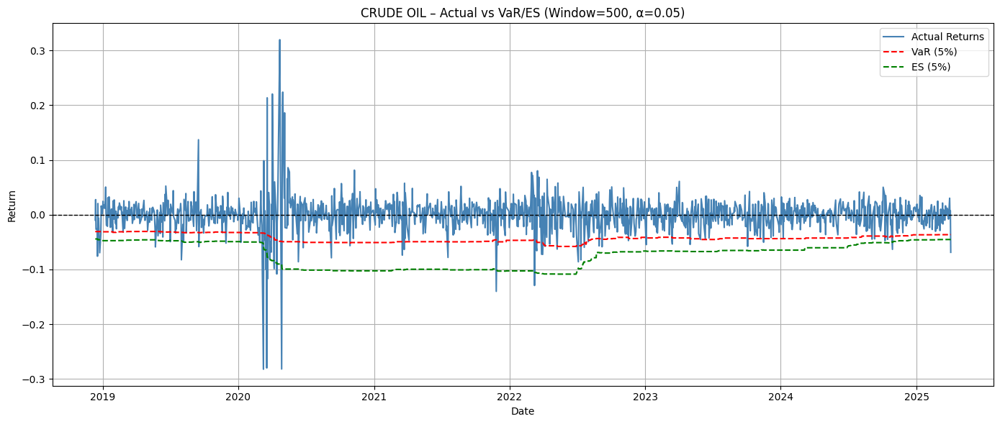

In [ ]:
rolling_window_500_df_5percent = rolling_window(in_sample, out_sample, window_sizes=[500], alphas=[0.05])

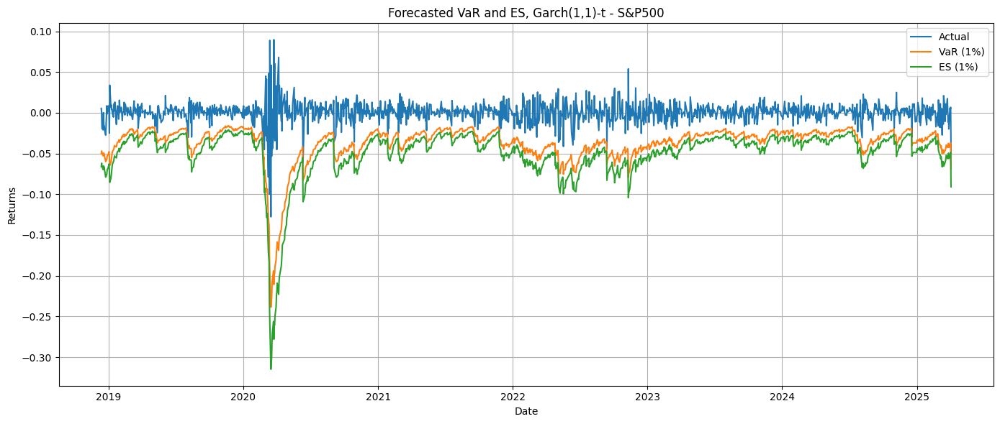

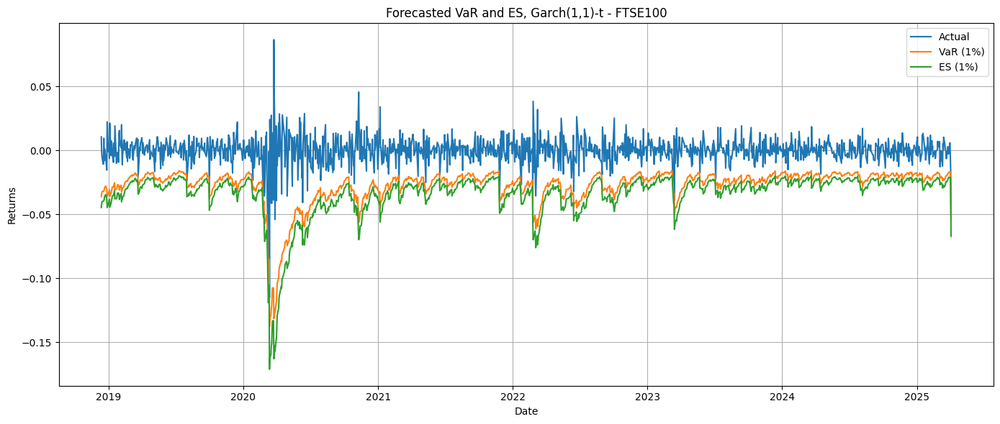

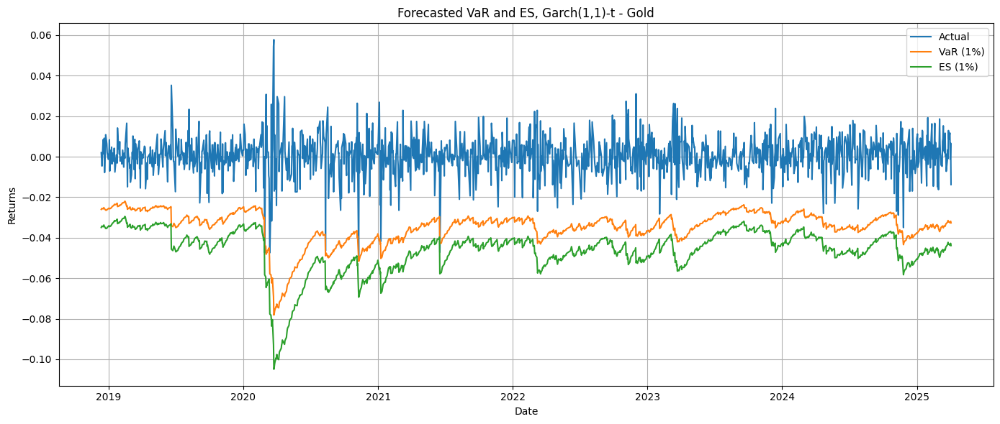

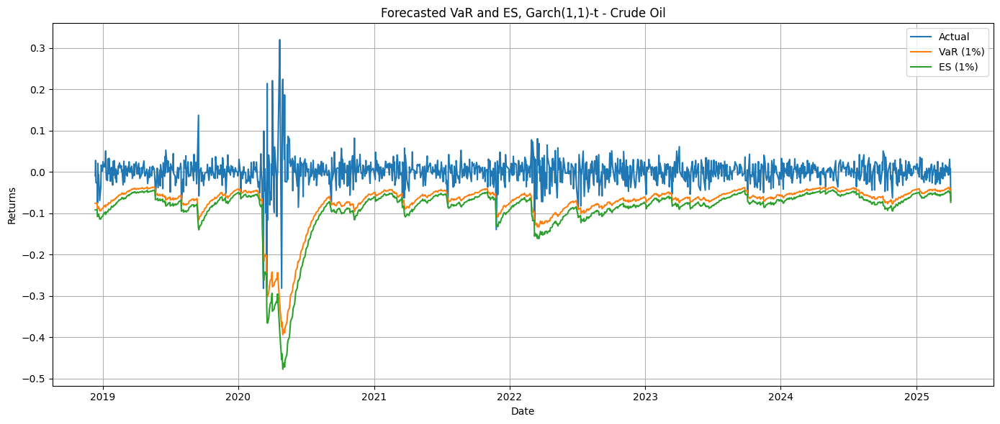

In [ ]:
df_forecast_garch_t_1percent = forecast_garch_t(fits_t, in_sample, out_sample, alpha=0.01)

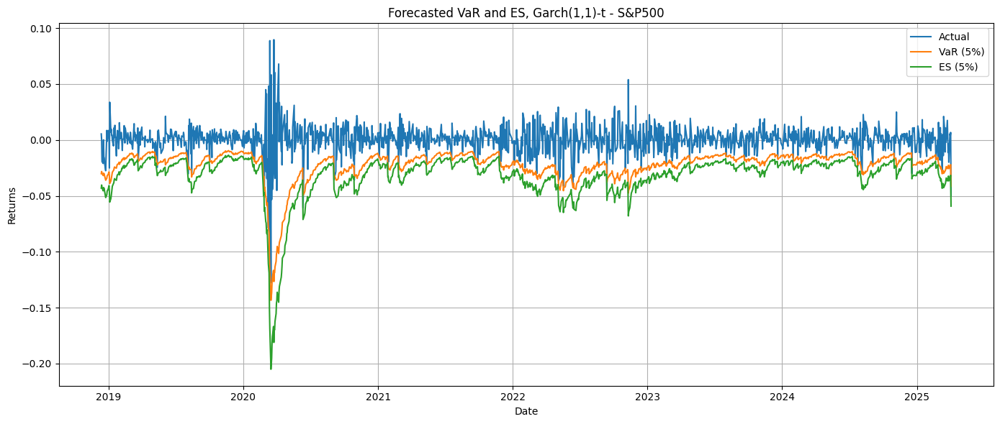

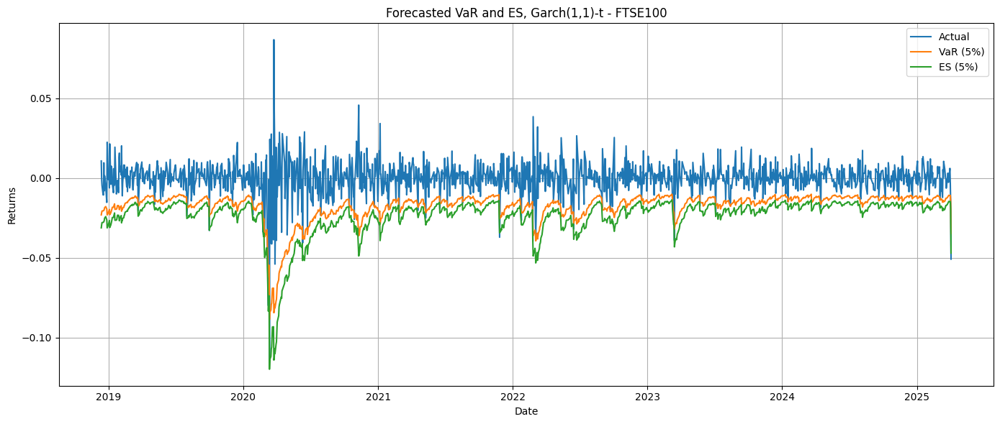

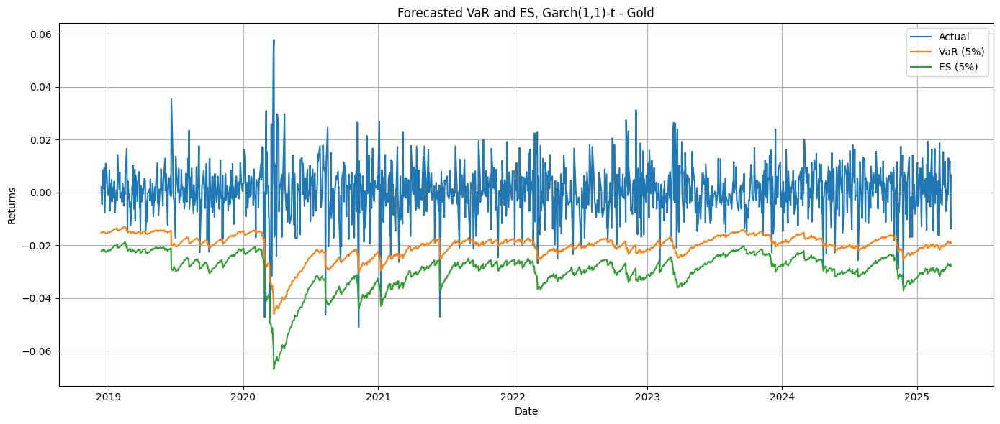

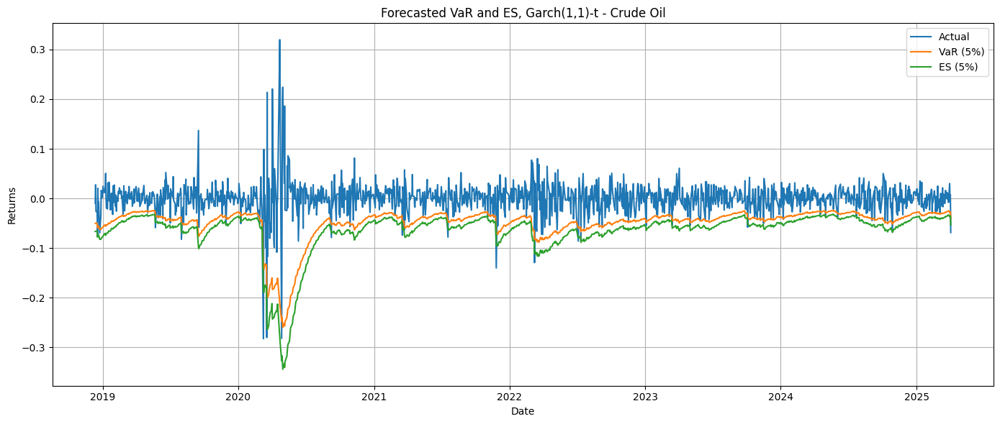

In [ ]:
df_forecast_garch_t_5percent = forecast_garch_t(fits_t, in_sample, out_sample, alpha=0.05)

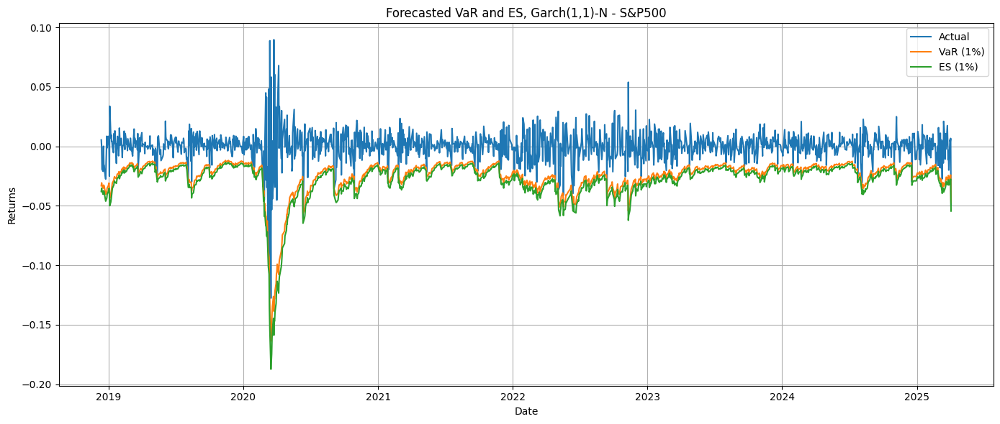

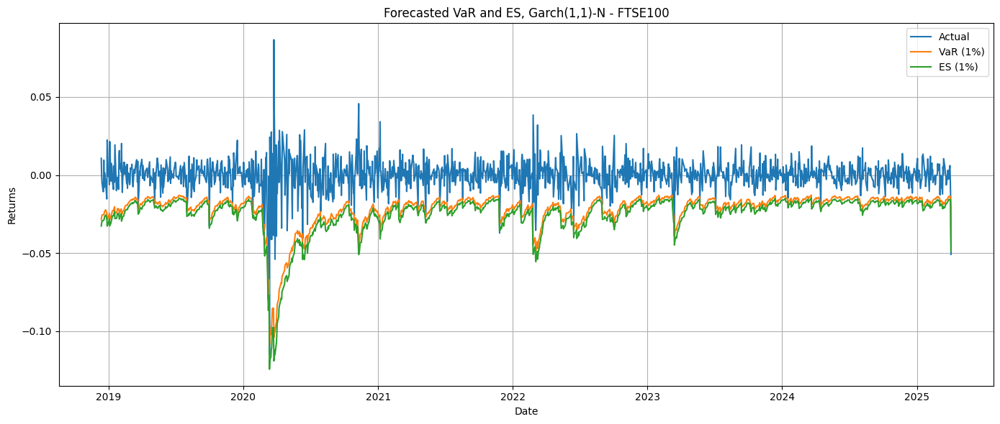

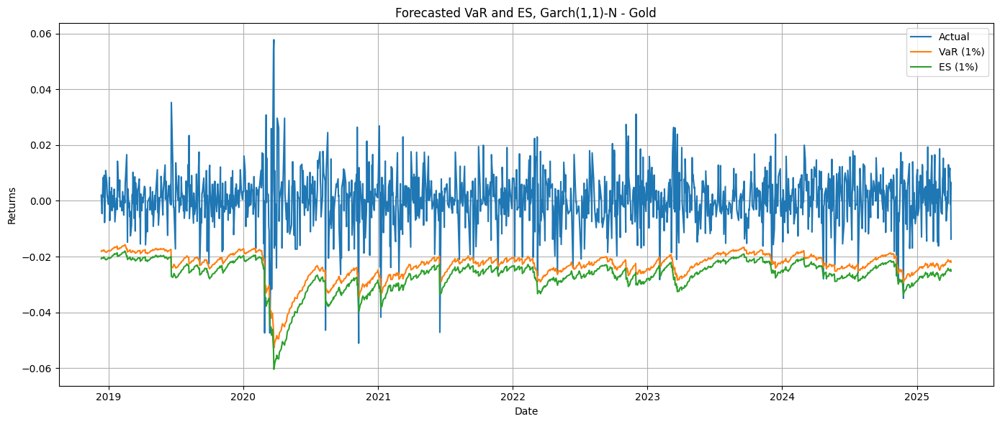

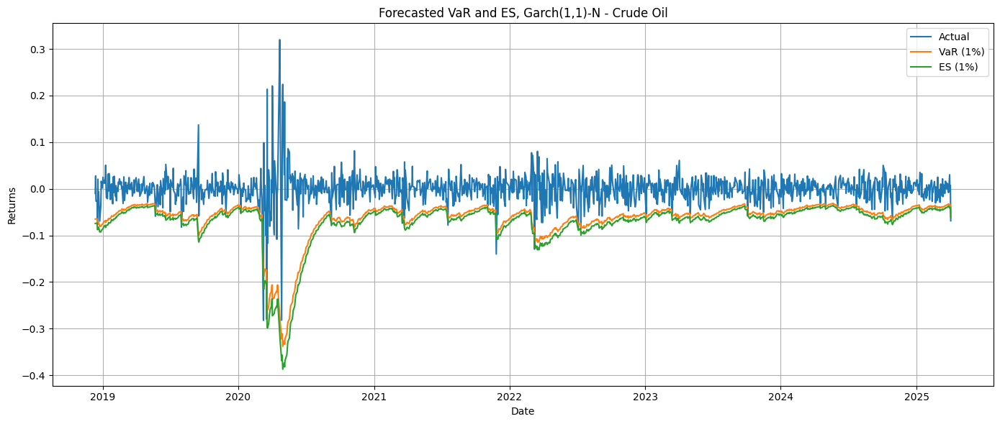

In [ ]:
df_forecast_garch_n_1percent = forecast_garch_normal(fits_norm, in_sample, out_sample, alpha=0.01)

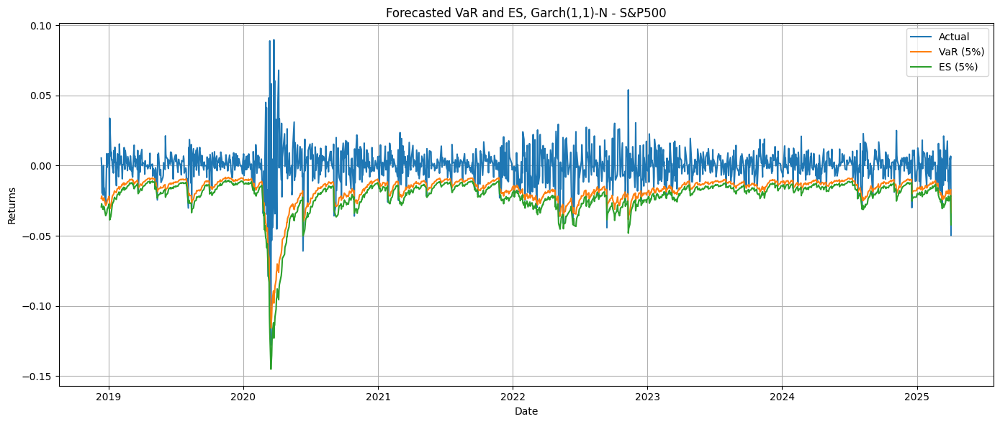

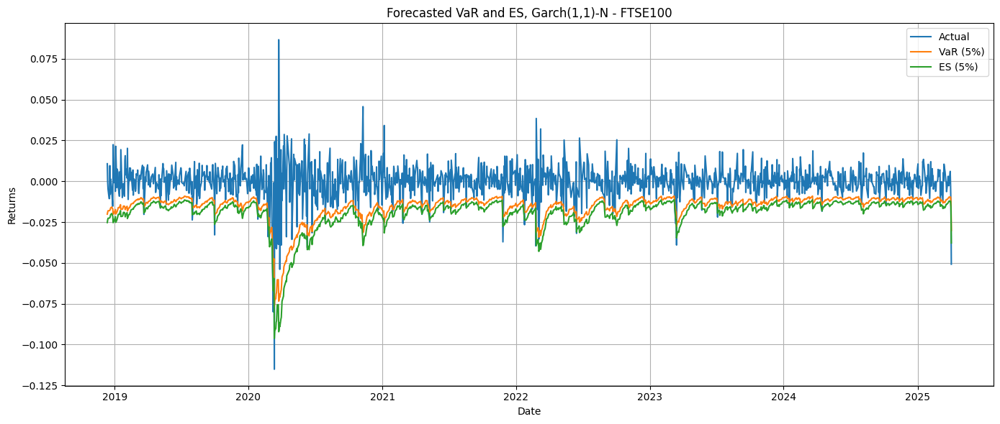

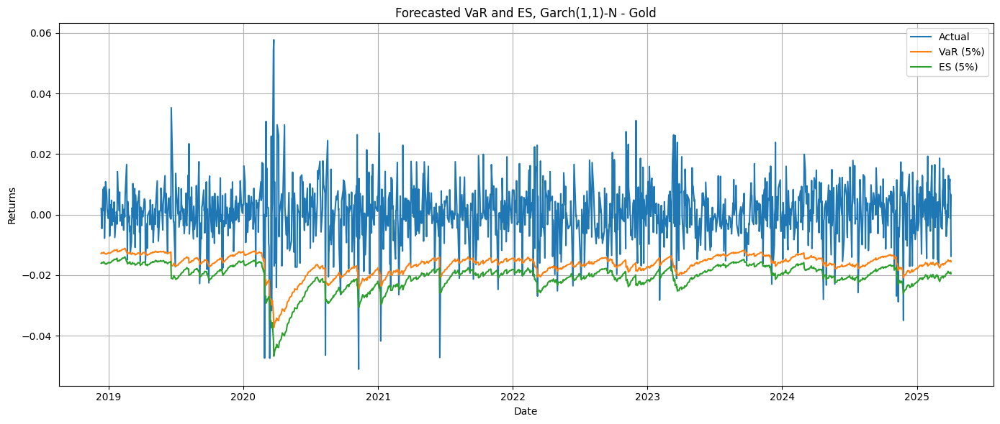

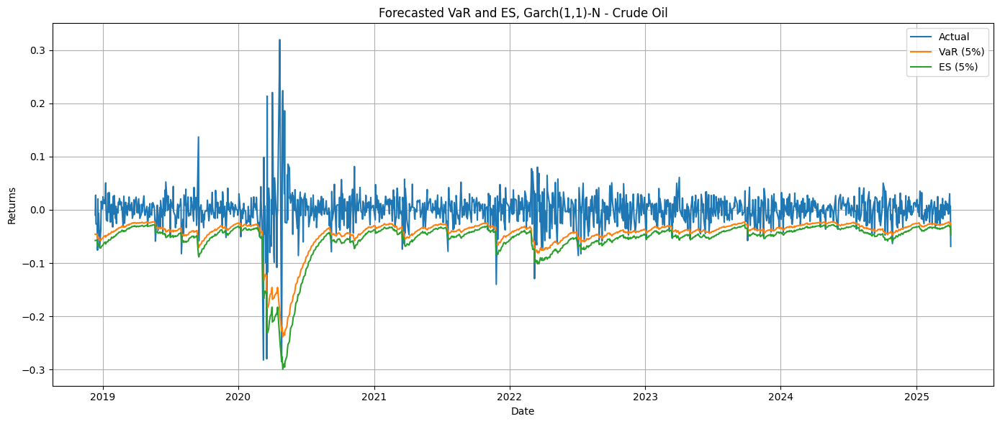

In [ ]:
df_forecast_garch_n_5percent = forecast_garch_normal(fits_norm, in_sample, out_sample, alpha=0.05)

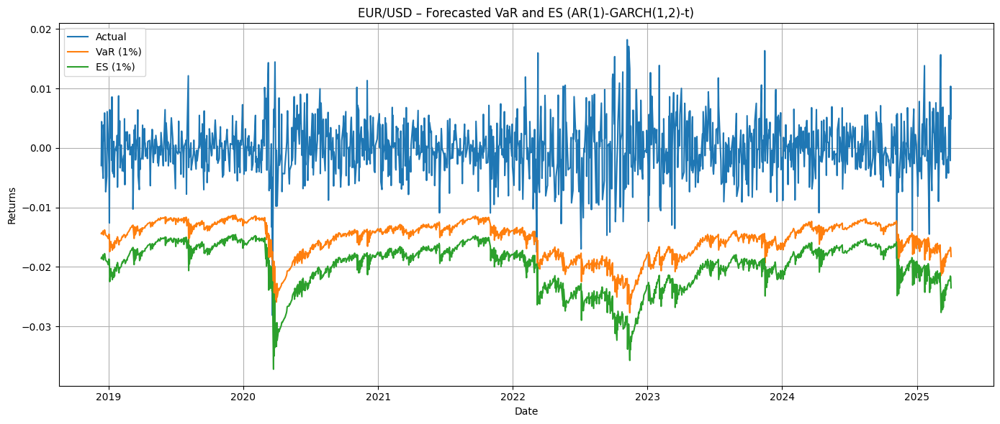

In [ ]:
df_forecasts_ar_garch_1percent = forecast_ar1_garch12_t(fits_ar_garch, in_sample, out_sample, alpha=0.01)

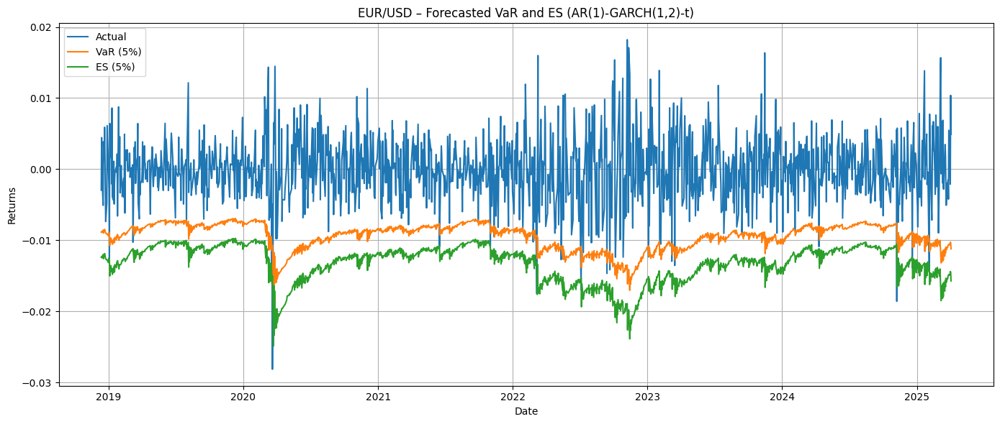

In [ ]:
df_forecasts_ar_garch_5percent = forecast_ar1_garch12_t(fits_ar_garch, in_sample, out_sample, alpha=0.05)

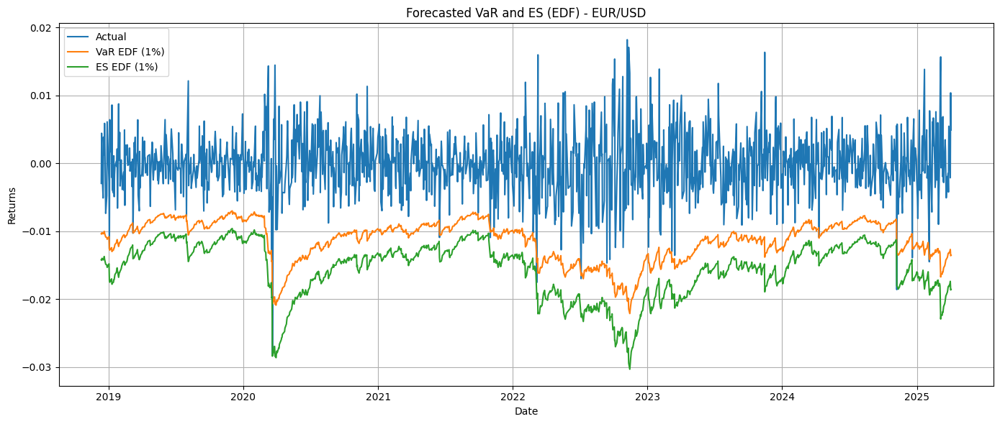

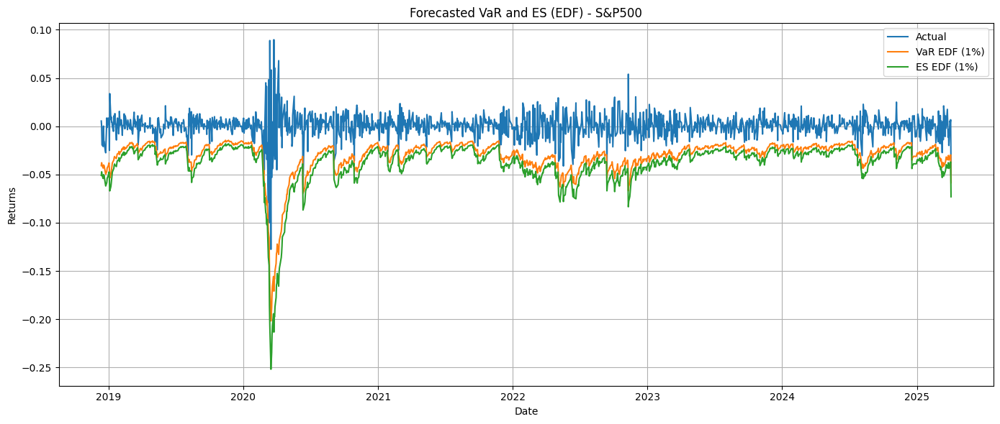

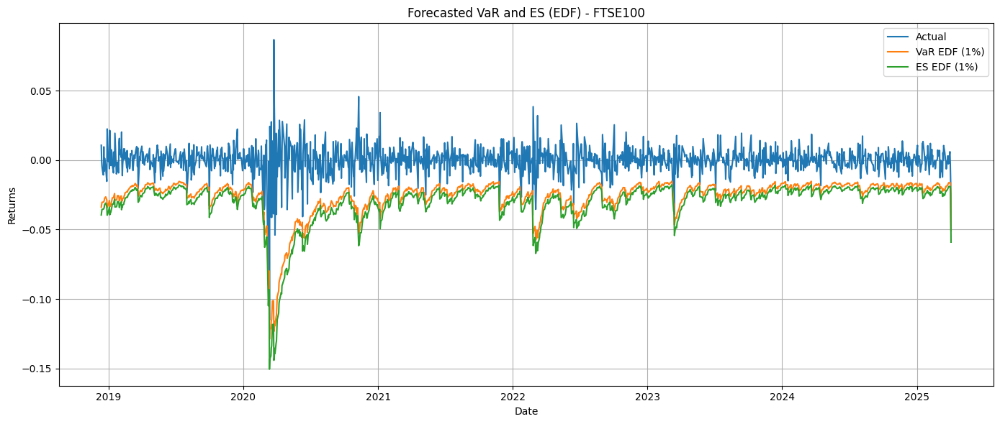

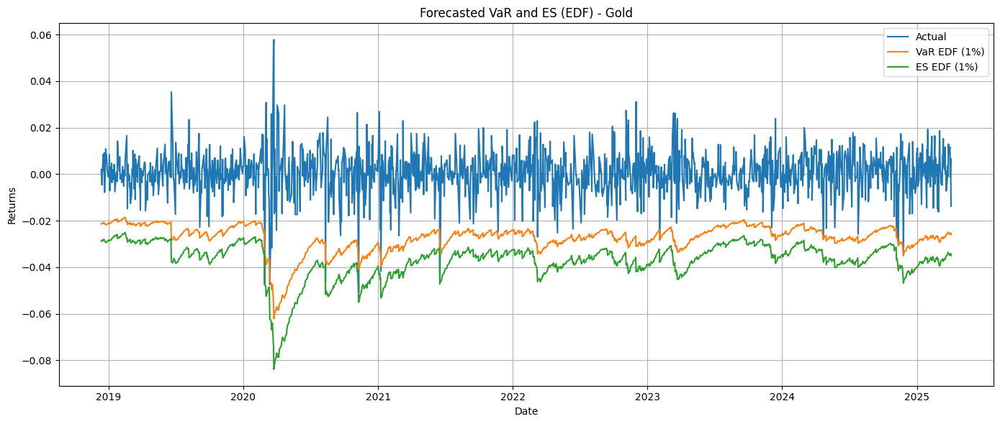

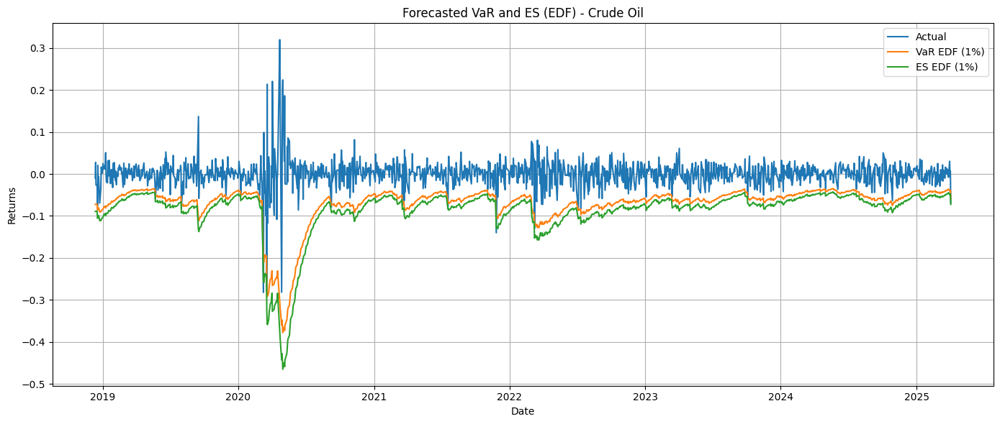

In [ ]:
df_forecasts_garch_edf_1percent = forecast_garch_edf(fits_norm, resids_norm, in_sample, out_sample, alpha=0.01)

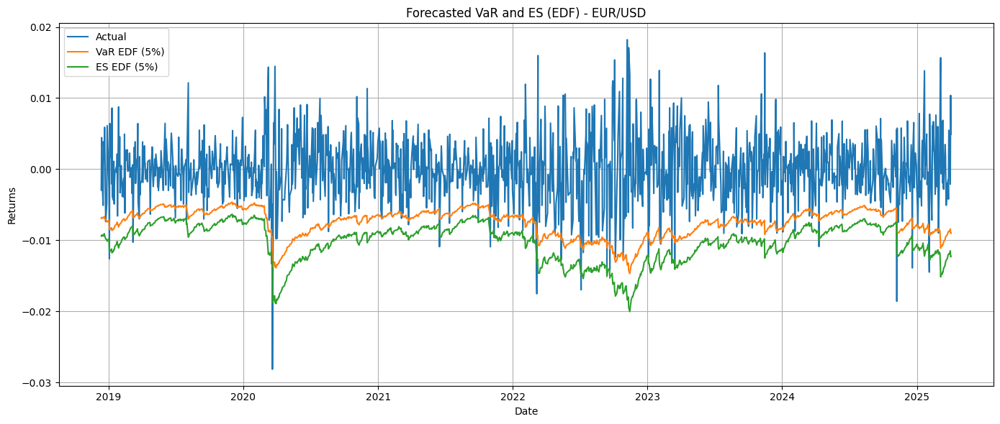

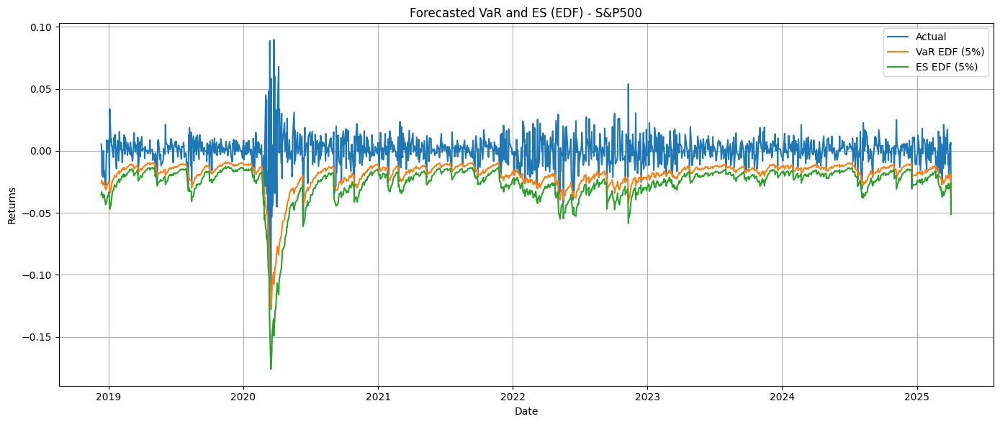

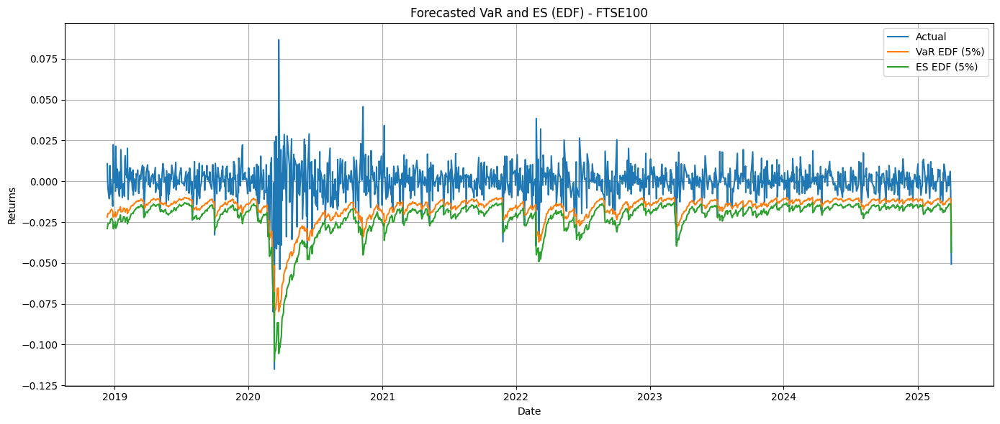

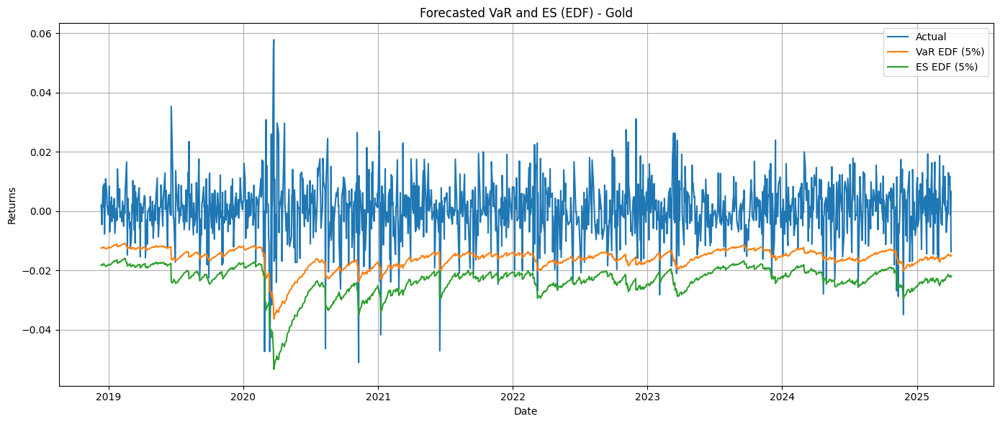

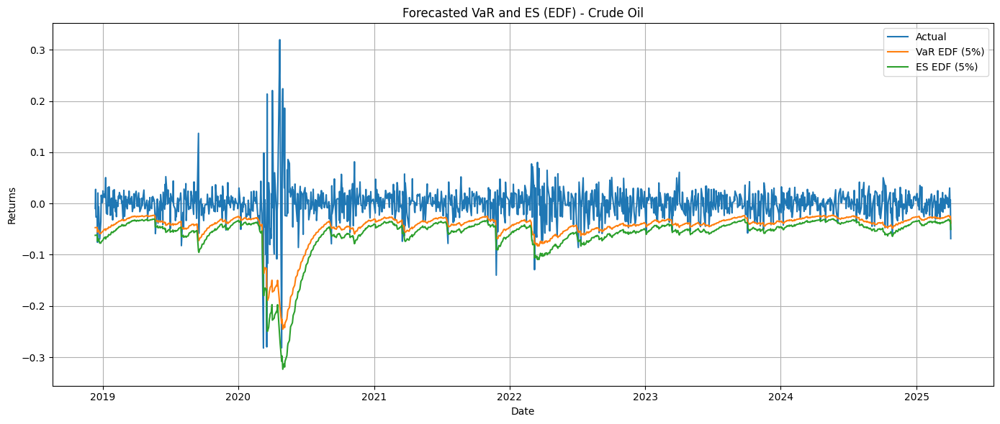

In [ ]:
df_forecasts_garch_edf_5percent = forecast_garch_edf(fits_norm, resids_norm, in_sample, out_sample, alpha=0.05)

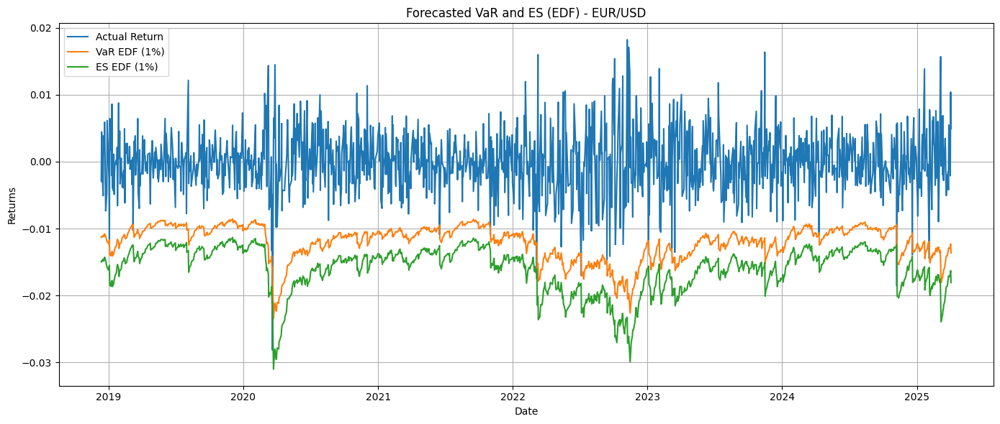

In [ ]:
df_forecasts_eu_usd_edf_1percent = forecast_ar1_garch_edf_eurusd(fits_ar_garch, edf_resids_argarch, in_sample, out_sample, alpha=0.01)

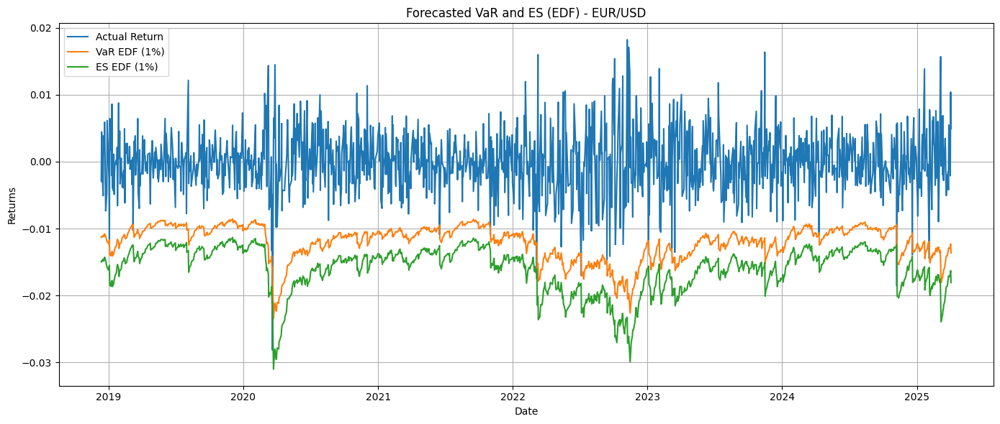

In [ ]:
df_forecasts_eu_usd_edf_5percent = forecast_ar1_garch_edf_eurusd(fits_ar_garch, edf_resids_argarch, in_sample, out_sample, alpha=0.01)

# **Stateful LSTM**

EUR/USD α=1.00% | best val FZ0: -3.837332 @ epoch 5


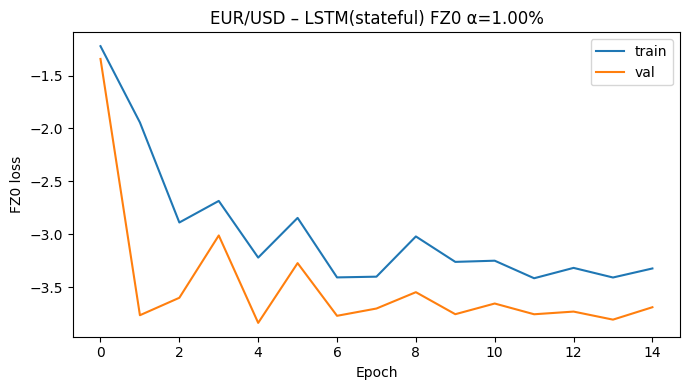

EUR/USD α=5.00% | best val FZ0: -4.452691 @ epoch 16


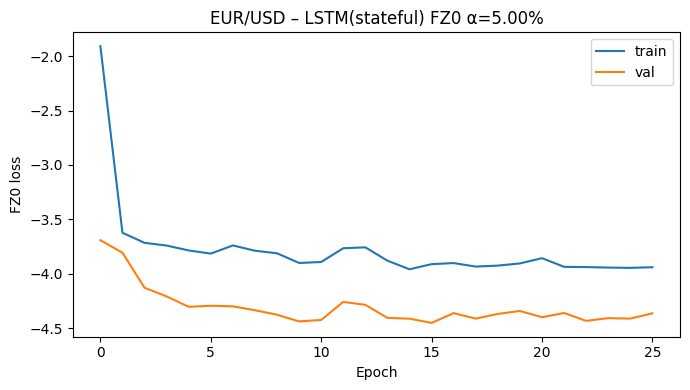

S&P500 α=1.00% | best val FZ0: -3.500937 @ epoch 35


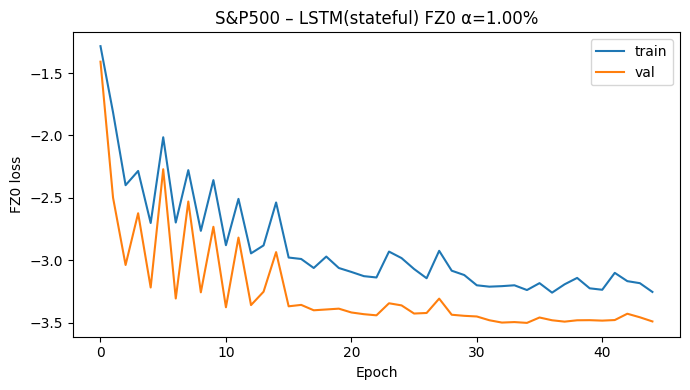

S&P500 α=5.00% | best val FZ0: -3.837998 @ epoch 2


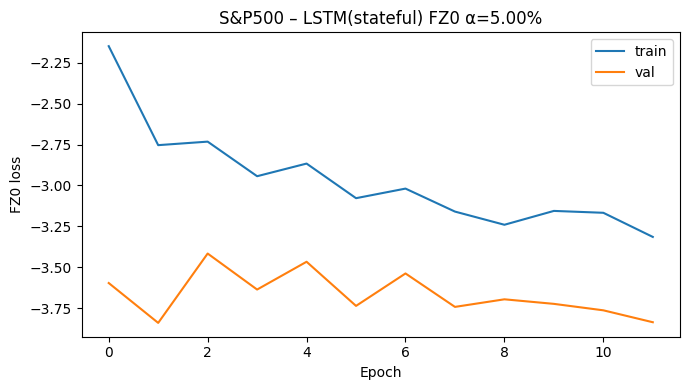

FTSE100 α=1.00% | best val FZ0: -3.473267 @ epoch 3


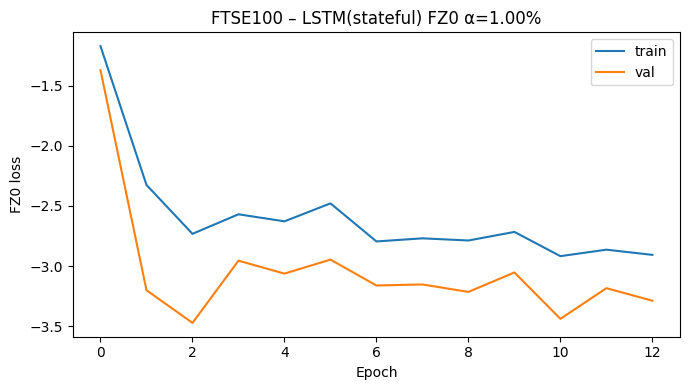

FTSE100 α=5.00% | best val FZ0: -4.027878 @ epoch 12


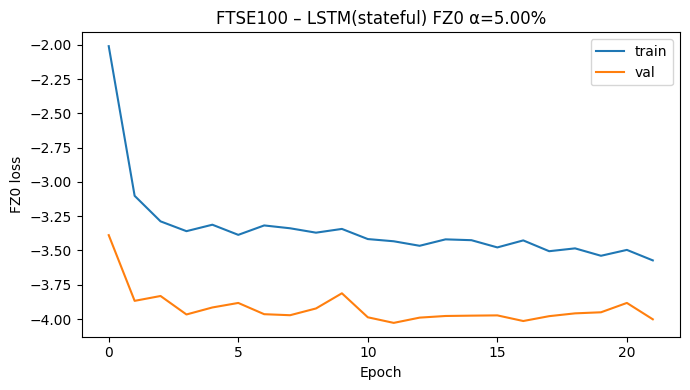

Gold α=1.00% | best val FZ0: -3.501281 @ epoch 2


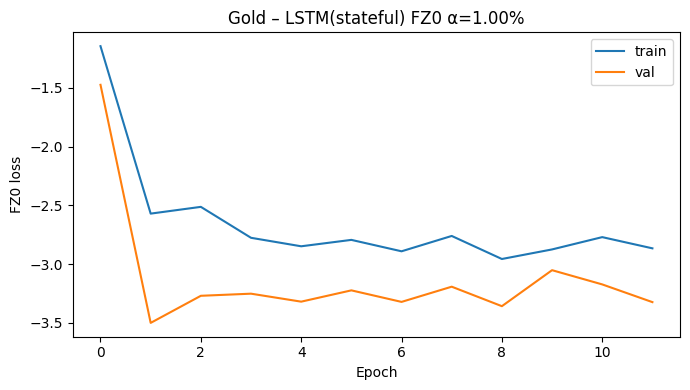

Gold α=5.00% | best val FZ0: -3.970727 @ epoch 2


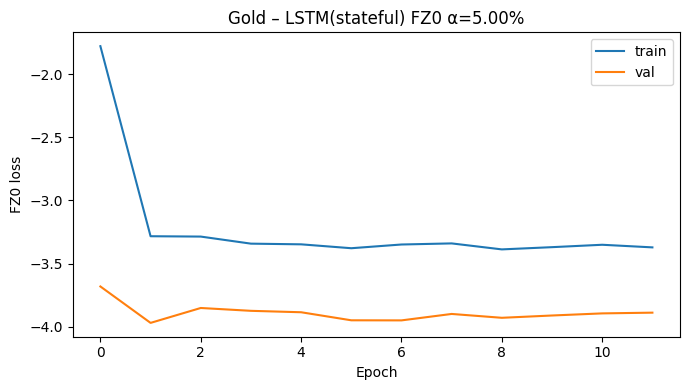

Crude Oil α=1.00% | best val FZ0: -2.803859 @ epoch 28


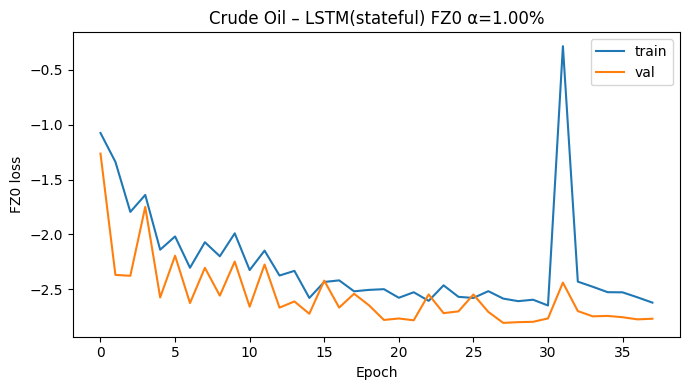

Crude Oil α=5.00% | best val FZ0: -3.156290 @ epoch 41


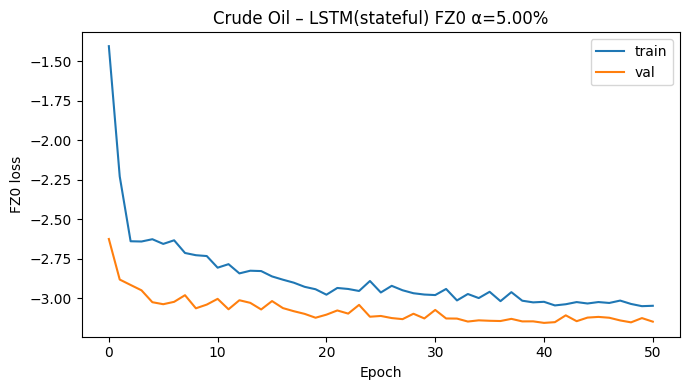


=== LSTM(stateful) – FZ0 Timing Table ===
    Asset  Alpha  Prep (s)  Train (s)  Infer (s)  Total (s)  Train n  Val n  Test n  Best Epoch  Best Val Loss
Crude Oil   0.01     0.009     96.314    154.985    251.308     2304    576    1388          28      -2.803859
Crude Oil   0.05     0.009    140.227    185.543    325.779     2304    576    1388          41      -3.156290
  EUR/USD   0.01     0.009     50.996    167.049    218.054     2304    576    1388           5      -3.837332
  EUR/USD   0.05     0.009     71.309    155.642    226.960     2304    576    1388          16      -4.452691
  FTSE100   0.01     0.011     36.895    136.401    173.307     2304    576    1388           3      -3.473267
  FTSE100   0.05     0.011     50.828    143.299    194.138     2304    576    1388          12      -4.027878
     Gold   0.01     0.009     30.181    146.523    176.713     2304    576    1388           2      -3.501281
     Gold   0.05     0.009     31.618    146.909    178.537     2304 

In [ ]:
# LSTM–FZ0 (stateful)
# - trains on in_sample
# - early stopping + dropout
# - FZ0 special case
# - overfitting diagnostics (train vs val loss)
# - walk-forward forecasts on out_sample
# - outputs:
#     df_forecasts_lstm_stateful_fz0_1percent
#     df_forecasts_lstm_stateful_fz0_5percent
#     df_time_lstm_stateful

# config
assets_list  = ["EUR/USD", "S&P500", "FTSE100", "Gold", "Crude Oil"]
ALPHAS       = (0.01, 0.05)
LOOKBACK     = 60
BATCH_SIZE   = 32
HIDDEN_UNITS = 64
DROPOUT      = 0.2
EPOCHS       = 100                   # EarlyStopping will stop earlier
PATIENCE     = 10
LR           = 1e-3
MODEL_NAME   = "LSTM-STATEFUL-FZ0"
EPS_LOG      = 1e-12                 # epsilon inside log(-ES)
SEED         = 42

np.random.seed(SEED)
tf.random.set_seed(SEED)

# helpers
def make_windows_train_val(x_scaled_in, y_raw_in, lookback, batch_size, val_frac=0.2):

    xs, ys = [], []
    xv = x_scaled_in.values.astype("float32")
    yv = y_raw_in.values.astype("float32")
    assert len(xv) == len(yv)
    for i in range(lookback, len(xv)):
        xs.append(xv[i-lookback:i])
        ys.append(yv[i])
    X = np.array(xs, dtype="float32")[..., None]  # (n, T, 1)
    y = np.array(ys, dtype="float32")            # (n,)
    n  = len(X)
    n_val = max(batch_size, int(n * val_frac))
    n_tr  = n - n_val
    # stateful: BOTH sets must be multiples of batch_size
    n_tr  = (n_tr  // batch_size) * batch_size
    n_val = (n_val // batch_size) * batch_size
    if n_tr <= 0:  raise ValueError("Training set too small after trimming; reduce BATCH_SIZE or LOOKBACK.")
    if n_val <= 0: raise ValueError("Validation set too small after trimming; reduce BATCH_SIZE or val_frac.")
    X_tr, y_tr = X[:n_tr], y[:n_tr]
    X_va, y_va = X[n - n_val:], y[n - n_val:]
    return X_tr, y_tr, X_va, y_va

class ResetStates(callbacks.Callback):
    """Reset states on recurrent layers; Keras Model itself has no reset_states()."""
    def _reset_all(self):
        for layer in self.model.layers:
            if hasattr(layer, "reset_states"):
                layer.reset_states()
    def on_train_begin(self, logs=None): self._reset_all()
    def on_epoch_begin(self, epoch, logs=None): self._reset_all()
    def on_test_begin(self, logs=None): self._reset_all()
    def on_epoch_end(self, epoch, logs=None): self._reset_all()

def plot_overfit(history, title):
    h = history.history
    plt.figure(figsize=(7,4))
    plt.plot(h["loss"], label="train")
    if "val_loss" in h: plt.plot(h["val_loss"], label="val")
    plt.title(title); plt.xlabel("Epoch"); plt.ylabel("FZ0 loss"); plt.legend()
    plt.tight_layout(); plt.show()

def build_train_model(lookback, alpha):
    inp = layers.Input(batch_shape=(BATCH_SIZE, lookback, 1), name="inp")
    h   = layers.LSTM(HIDDEN_UNITS, stateful=True, return_sequences=False, name="lstm")(inp)
    h   = layers.Dropout(DROPOUT, name="dropout")(h)
    raw = layers.Dense(2, name="raw_uv")(h)

    def transform_uv(uv):
        u = uv[:, 0:1]; v = uv[:, 1:2]
        es  = -tf.nn.softplus(u)         # ES < 0
        var = es + tf.nn.softplus(v)     # VaR >= ES
        return tf.concat([var, es], axis=1)
    out = layers.Lambda(transform_uv, name="var_es")(raw)

    a = tf.constant(float(alpha), dtype=tf.float32)
    def fz0_loss(y_true, y_pred):
        nu = y_pred[:, 0:1]                       # VaR
        e  = y_pred[:, 1:2]                       # ES
        I  = tf.cast(y_true[:, None] <= nu, tf.float32)
        loss = -(I*(nu - y_true[:, None]))/(a*e) + (nu/e) + tf.math.log(-e + EPS_LOG) - 1.0
        return tf.reduce_mean(loss)

    m = Model(inp, out)
    m.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LR), loss=fz0_loss)
    return m

def build_infer_model(lookback, train_model):
    """Batch size = 1 version for walk-forward inference; copies weights by name."""
    inp = layers.Input(batch_shape=(1, lookback, 1), name="inp_infer")
    h   = layers.LSTM(HIDDEN_UNITS, stateful=True, return_sequences=False, name="lstm")(inp)
    raw = layers.Dense(2, name="raw_uv")(h)
    def transform_uv(uv):
        u = uv[:, 0:1]; v = uv[:, 1:2]
        es  = -tf.nn.softplus(u)
        var = es + tf.nn.softplus(v)
        return tf.concat([var, es], axis=1)
    out  = layers.Lambda(transform_uv, name="var_es")(raw)
    infer = Model(inp, out)
    # copy weights
    infer.get_layer("lstm").set_weights(train_model.get_layer("lstm").get_weights())
    infer.get_layer("raw_uv").set_weights(train_model.get_layer("raw_uv").get_weights())
    return infer

# main loop (with timing)
time_rows, all_rows = [], []
global_t0 = time.perf_counter()

for ASSET in assets_list:
    # prep / scale (timed per asset)
    t0 = time.perf_counter()

    s_in_raw  = in_sample.set_index("Date")[ASSET].astype("float32")
    s_out_raw = out_sample.set_index("Date")[ASSET].astype("float32")
    full_raw  = pd.concat([s_in_raw, s_out_raw]).astype("float32")

    scaler = StandardScaler().fit(s_in_raw.values.reshape(-1,1))
    full_scaled = pd.Series(
        scaler.transform(full_raw.values.reshape(-1,1)).ravel(),
        index=full_raw.index, name=ASSET
    ).astype("float32")

    X_tr, y_tr, X_va, y_va = make_windows_train_val(
        x_scaled_in=full_scaled.loc[s_in_raw.index],
        y_raw_in=s_in_raw,
        lookback=LOOKBACK,
        batch_size=BATCH_SIZE,
        val_frac=0.2
    )
    prep_sec = time.perf_counter() - t0
    n_tr, n_va, n_te = len(X_tr), len(X_va), len(s_out_raw)

    for ALPHA in ALPHAS:
        # train
        train_t0 = time.perf_counter()
        model = build_train_model(LOOKBACK, ALPHA)
        es_cb  = callbacks.EarlyStopping(monitor="val_loss", patience=PATIENCE, restore_best_weights=True)
        history = model.fit(
            X_tr, y_tr,
            validation_data=(X_va, y_va),
            epochs=EPOCHS,
            batch_size=BATCH_SIZE,
            shuffle=False,                       # stateful!
            callbacks=[ResetStates(), es_cb],
            verbose=0
        )
        train_sec = time.perf_counter() - train_t0
        best_ep   = int(np.argmin(history.history["val_loss"]) + 1)
        best_vl   = float(np.min(history.history["val_loss"]))
        print(f"{ASSET} α={ALPHA:.2%} | best val FZ0: {best_vl:.6f} @ epoch {best_ep}")
        plot_overfit(history, title=f"{ASSET} – LSTM(stateful) FZ0 α={ALPHA:.2%}")

        # inference on out-sample (walk-forward, batch_size=1)
        infer_t0 = time.perf_counter()
        infer = build_infer_model(LOOKBACK, model)
        # reset states before forecasting
        for lyr in infer.layers:
            if hasattr(lyr, "reset_states"): lyr.reset_states()
        arr_scaled = full_scaled.values.astype("float32")
        first_test = full_scaled.index.get_loc(s_out_raw.index[0])
        pred_var, pred_es = [], []
        for t in range(first_test, len(arr_scaled)):
            x = arr_scaled[t-LOOKBACK:t].reshape(1, LOOKBACK, 1)
            yhat = infer.predict(x, batch_size=1, verbose=0)   # [VaR, ES]
            pred_var.append(float(yhat[0,0])); pred_es.append(float(yhat[0,1]))
        infer_sec = time.perf_counter() - infer_t0

        part = pd.DataFrame({
            "Date": s_out_raw.index.values,
            "Asset": ASSET,
            "Alpha": ALPHA,
            "Model": MODEL_NAME,
            "Actual Return": s_out_raw.values.astype("float64"),
            "VaR": np.array(pred_var, dtype="float64"),
            "ES":  np.array(pred_es,  dtype="float64"),
        })
        all_rows.append(part)

        time_rows.append({
            "Asset": ASSET,
            "Alpha": ALPHA,
            "Prep (s)": round(prep_sec, 3),
            "Train (s)": round(train_sec, 3),
            "Infer (s)": round(infer_sec, 3),
            "Total (s)": round(prep_sec + train_sec + infer_sec, 3),
            "Train n": n_tr,
            "Val n": n_va,
            "Test n": n_te,
            "Best Epoch": best_ep,
            "Best Val Loss": round(best_vl, 6),
        })

global_total_sec = time.perf_counter() - global_t0

df_forecasts_lstm_stateful_fz0 = pd.concat(all_rows, ignore_index=True)[
    ["Date","Asset","Alpha","Model","Actual Return","VaR","ES"]
]

_alpha = df_forecasts_lstm_stateful_fz0["Alpha"].astype(float).to_numpy()
mask_01 = np.isclose(_alpha, 0.01, rtol=0, atol=5e-6)
mask_05 = np.isclose(_alpha, 0.05, rtol=0, atol=5e-6)
cols = ["Date","Asset","Alpha","Model","Actual Return","VaR","ES"]
df_forecasts_lstm_stateful_fz0_1percent = df_forecasts_lstm_stateful_fz0.loc[mask_01, cols].reset_index(drop=True)
df_forecasts_lstm_stateful_fz0_5percent = df_forecasts_lstm_stateful_fz0.loc[mask_05, cols].reset_index(drop=True)

df_time_lstm_stateful = pd.DataFrame(time_rows).sort_values(["Asset","Alpha"]).reset_index(drop=True)

print(df_time_lstm_stateful.to_string(index=False))

summary_totals = (df_time_lstm_stateful[["Prep (s)","Train (s)","Infer (s)","Total (s)"]]
                  .sum().to_frame().T)
summary_totals["Overall Wall (s)"] = round(global_total_sec, 3)

print(summary_totals.to_string(index=False))

by_asset = (df_time_lstm_stateful
            .groupby("Asset")[["Prep (s)","Train (s)","Infer (s)","Total (s)"]]
            .sum().round(3).reset_index())

print(by_asset.to_string(index=False))


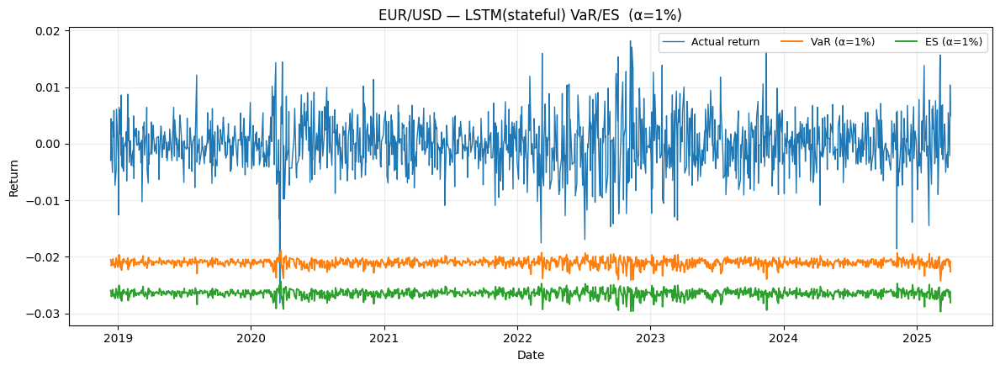

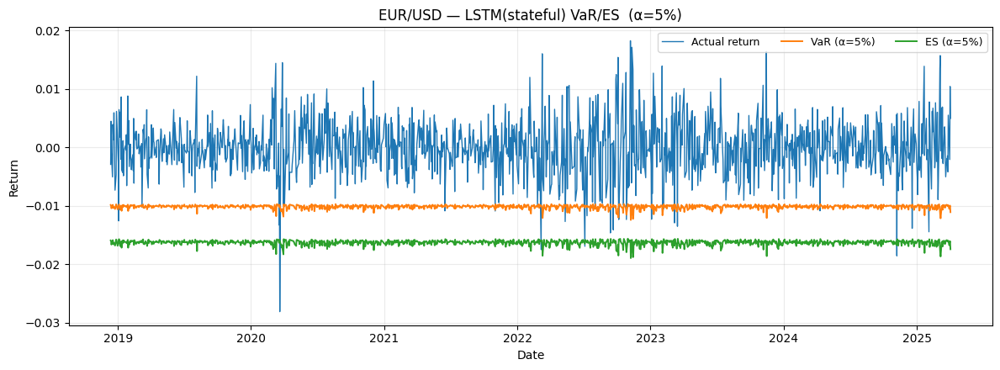

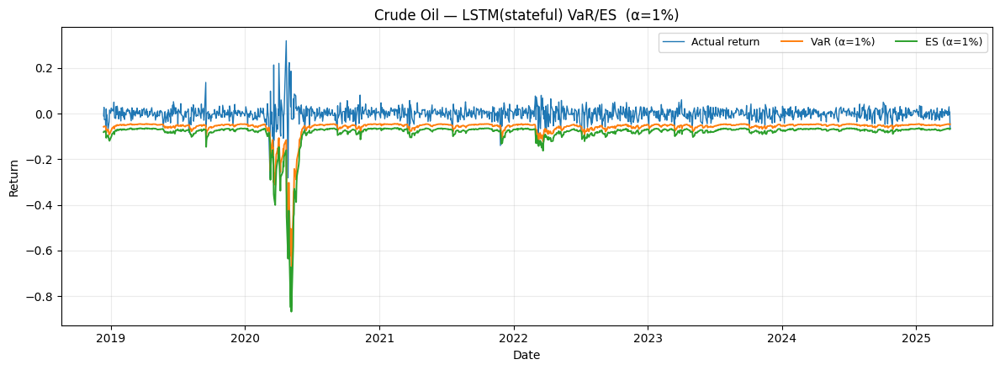

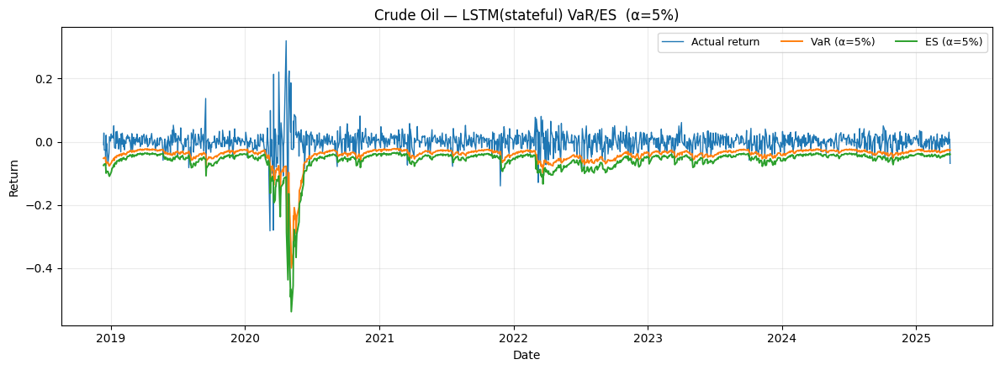

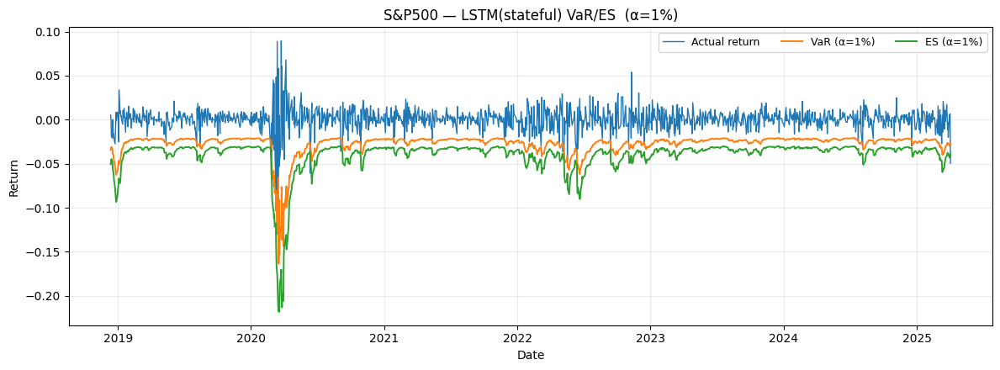

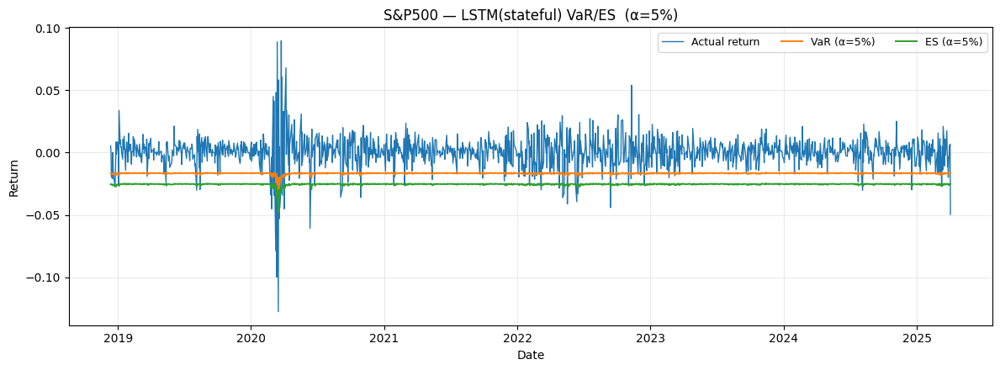

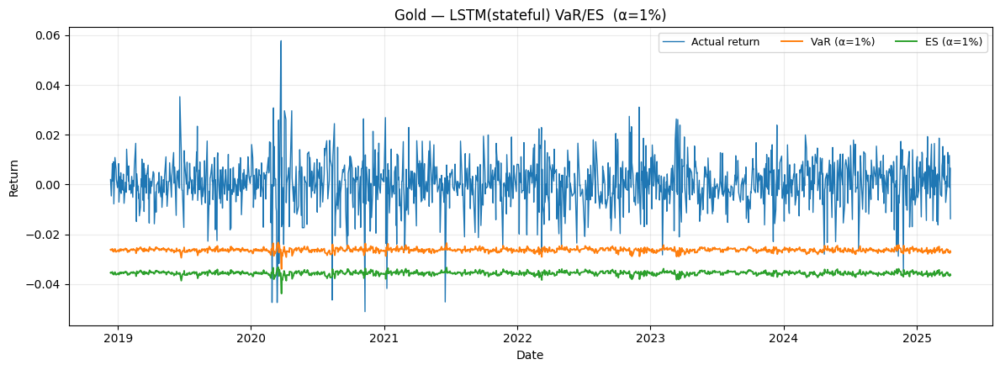

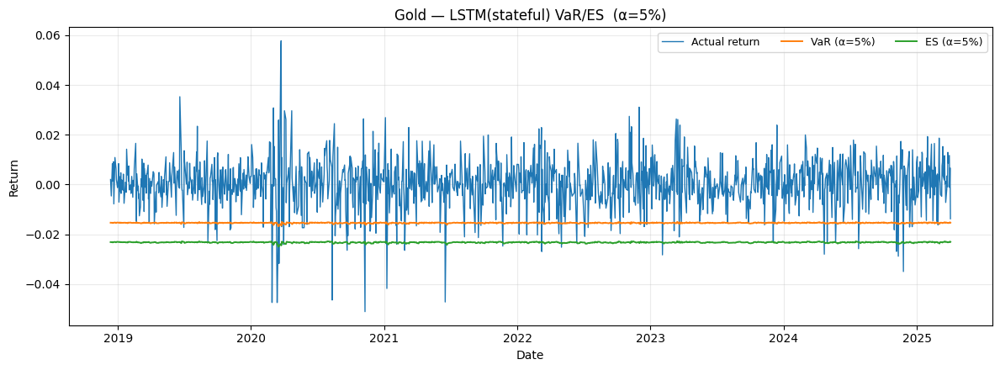

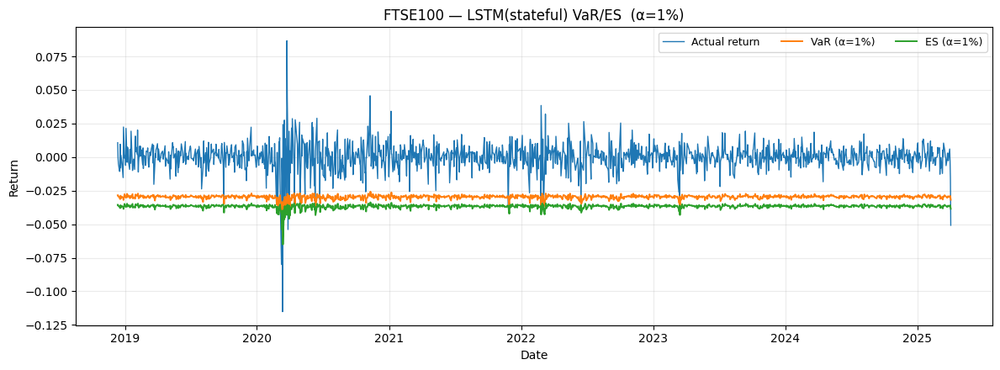

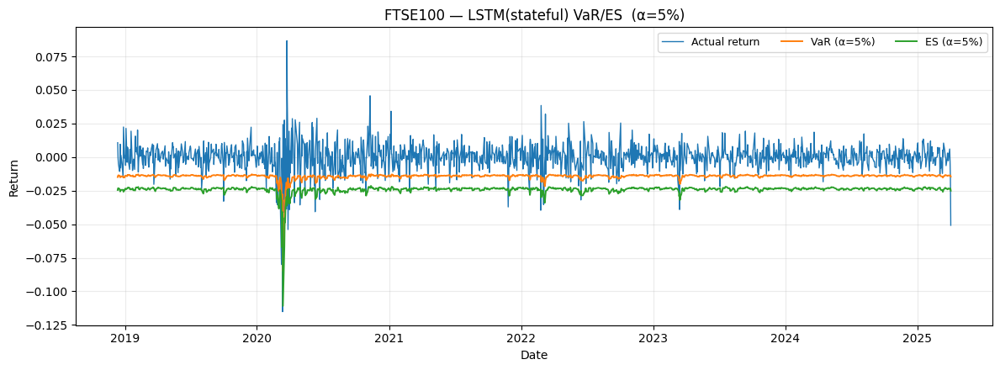

['plots_lstm_stateful_fz0/EUR-USD_alpha1.png',
 'plots_lstm_stateful_fz0/EUR-USD_alpha5.png',
 'plots_lstm_stateful_fz0/Crude_Oil_alpha1.png',
 'plots_lstm_stateful_fz0/Crude_Oil_alpha5.png',
 'plots_lstm_stateful_fz0/S&P500_alpha1.png',
 'plots_lstm_stateful_fz0/S&P500_alpha5.png',
 'plots_lstm_stateful_fz0/Gold_alpha1.png',
 'plots_lstm_stateful_fz0/Gold_alpha5.png',
 'plots_lstm_stateful_fz0/FTSE100_alpha1.png',
 'plots_lstm_stateful_fz0/FTSE100_alpha5.png']

In [ ]:
def _prep(df):
    df = df.copy()
    df["Date"] = pd.to_datetime(df["Date"])
    for c in ["Actual Return","VaR","ES","Alpha"]:
        df[c] = pd.to_numeric(df[c], errors="coerce")
    return df.sort_values("Date")

def plot_var_es_all_simple(
    df_1pct, df_5pct,
    assets=None,
    outdir=None,
    show=True
):
    """
    Plot Actual Return, VaR, ES for each asset at α=1% and α=5%.
    No breach markers, no VaR–ES band.
    Saves one PNG per (asset, alpha) if outdir is provided.
    """
    df1 = _prep(df_1pct).assign(Alpha=0.01)
    df5 = _prep(df_5pct).assign(Alpha=0.05)
    df  = pd.concat([df1, df5], ignore_index=True)

    if assets is None:
        assets = list(df["Asset"].dropna().unique())

    saved = []
    if outdir:
        os.makedirs(outdir, exist_ok=True)

    for asset in assets:
        for alpha in (0.01, 0.05):
            sub = df[(df["Asset"] == asset) & (np.isclose(df["Alpha"], alpha))].copy()
            if sub.empty:
                continue
            sub = sub.sort_values("Date")

            fig, ax = plt.subplots(figsize=(12, 4.5))
            ax.plot(sub["Date"], sub["Actual Return"], lw=1.0, label="Actual return")
            ax.plot(sub["Date"], sub["VaR"], lw=1.4, label=f"VaR (α={alpha:.0%})")
            ax.plot(sub["Date"], sub["ES"], lw=1.4, label=f"ES (α={alpha:.0%})")

            ax.set_title(f"{asset} — LSTM(stateful) VaR/ES  (α={alpha:.0%})")
            ax.set_xlabel("Date")
            ax.set_ylabel("Return")
            ax.grid(True, alpha=0.25)
            ax.legend(ncol=3, fontsize=9, loc="upper right")
            fig.tight_layout()

            if outdir:
                fname = f"{asset.replace('/','-').replace(' ','_')}_alpha{int(alpha*100)}.png"
                path = os.path.join(outdir, fname)
                fig.savefig(path, dpi=180, bbox_inches="tight")
                saved.append(path)

            if show:
                plt.show()
            else:
                plt.close(fig)

    return saved

plot_var_es_all_simple(
    df_forecasts_lstm_stateful_fz0_1percent,
    df_forecasts_lstm_stateful_fz0_5percent,
    outdir="plots_lstm_stateful_fz0",
    show=True
)

# **Stateless LSTM**

EUR/USD α=1.00% | best val FZ0: -3.887947 @ epoch 8


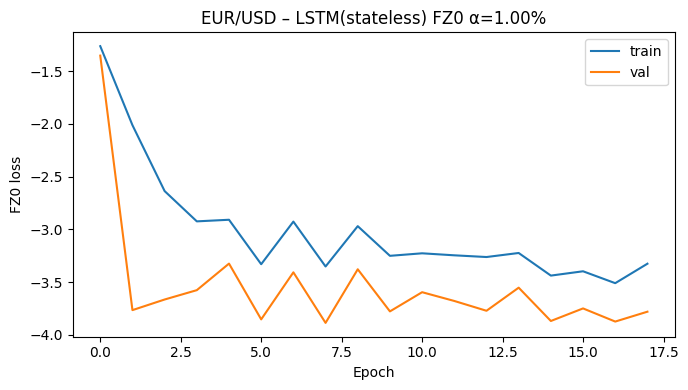

EUR/USD α=5.00% | best val FZ0: -4.419342 @ epoch 6


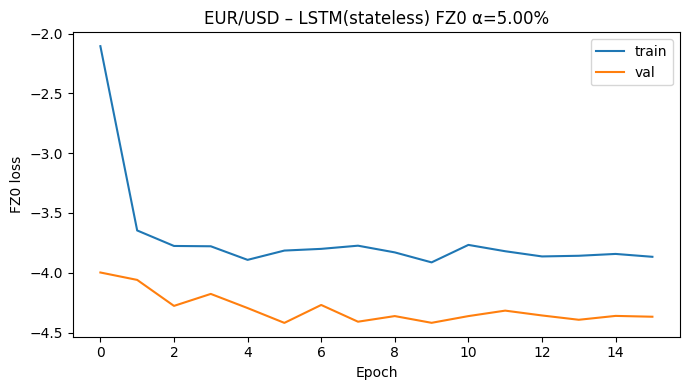

S&P500 α=1.00% | best val FZ0: -3.467246 @ epoch 37


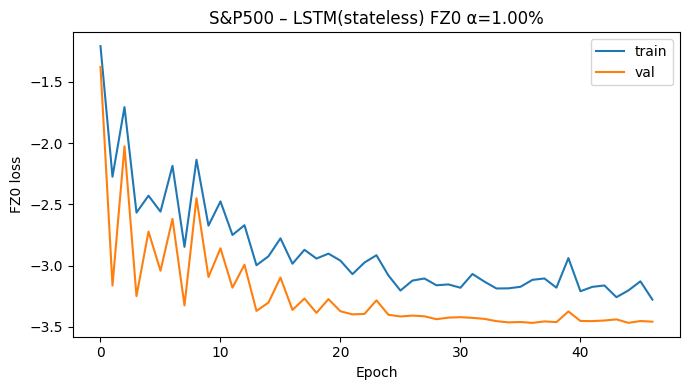

S&P500 α=5.00% | best val FZ0: -4.038956 @ epoch 53


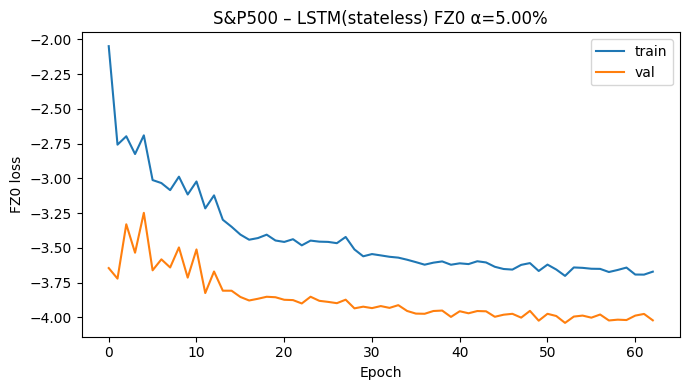

FTSE100 α=1.00% | best val FZ0: -3.597107 @ epoch 36


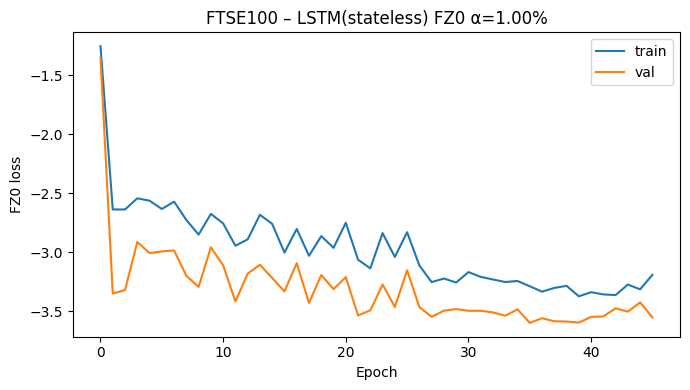

FTSE100 α=5.00% | best val FZ0: -4.015397 @ epoch 18


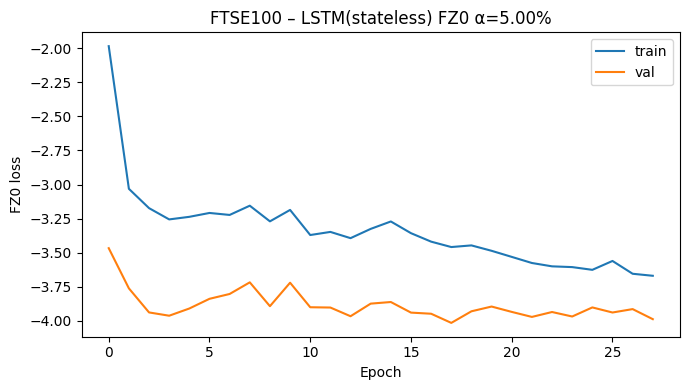

Gold α=1.00% | best val FZ0: -3.497666 @ epoch 2


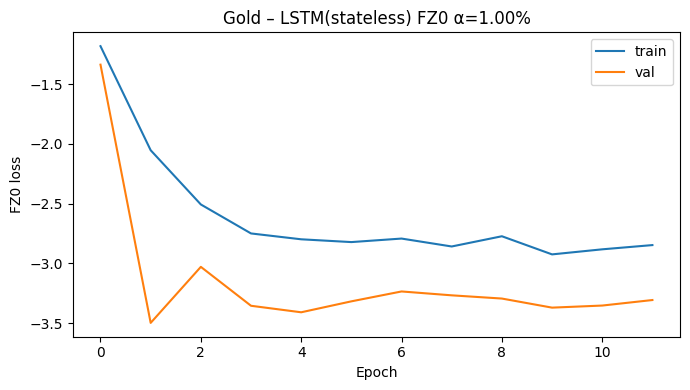

Gold α=5.00% | best val FZ0: -3.967326 @ epoch 2


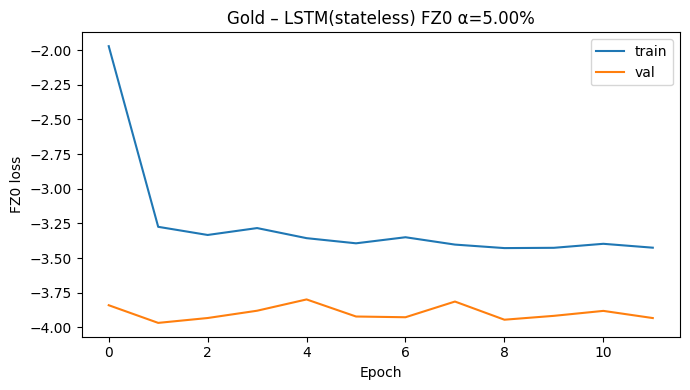

Crude Oil α=1.00% | best val FZ0: -2.596127 @ epoch 4


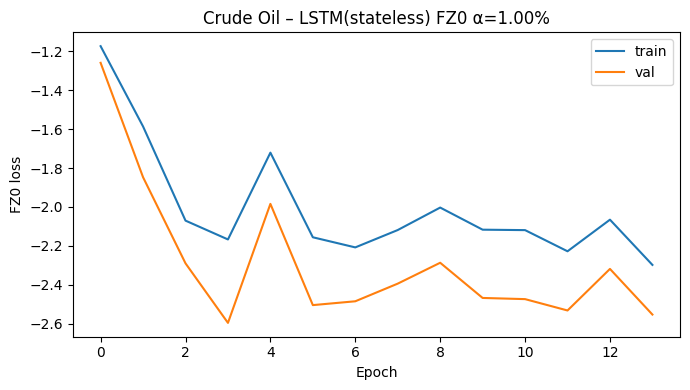

Crude Oil α=5.00% | best val FZ0: -3.147068 @ epoch 23


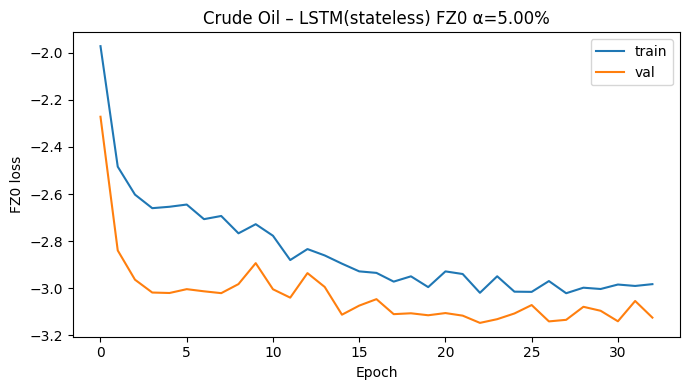


=== LSTM(stateless) – FZ0 Timing Table ===
    Asset  Alpha  Prep (s)  Train (s)  Infer (s)  Total (s)  Train n  Val n  Test n  Best Epoch  Best Val Loss
Crude Oil   0.01     0.008     38.855      1.351     40.214     2328    582    1388           4      -2.596127
Crude Oil   0.05     0.008     89.263      1.358     90.630     2328    582    1388          23      -3.147068
  EUR/USD   0.01     0.016     61.621      1.340     62.978     2328    582    1388           8      -3.887947
  EUR/USD   0.05     0.016     46.260      0.841     47.117     2328    582    1388           6      -4.419342
  FTSE100   0.01     0.008    122.994      1.368    124.370     2328    582    1388          36      -3.597107
  FTSE100   0.05     0.008     79.739      1.343     81.090     2328    582    1388          18      -4.015397
     Gold   0.01     0.008     35.462      0.909     36.378     2328    582    1388           2      -3.497666
     Gold   0.05     0.008     33.518      0.855     34.381     2328

In [ ]:
# LSTM–FZ0 (stateless)
# - trains on in_sample
# - early stopping + dropout
# - FZ0 special case
# - walk-forward forecasts on out_sample
# - outputs:
#     df_forecasts_lstm_stateless_fz0_1percent
#     df_forecasts_lstm_stateless_fz0_5percent
#     df_time_lstm_stateless

# config
assets_list  = ["EUR/USD", "S&P500", "FTSE100", "Gold", "Crude Oil"]
ALPHAS       = (0.01, 0.05)
LOOKBACK     = 60
BATCH_SIZE   = 32
HIDDEN_UNITS = 64
DROPOUT      = 0.2
EPOCHS       = 100                   # EarlyStopping will stop earlier
PATIENCE     = 10
LR           = 1e-3
MODEL_NAME   = "LSTM-STATELESS-FZ0"
EPS_LOG      = 1e-12                 # epsilon inside log(-ES)
SEED         = 42

np.random.seed(SEED)
tf.random.set_seed(SEED)

# helpers
def make_windows_train_val(x_scaled_in, y_raw_in, lookback, val_frac=0.2):
    """Build windows from IN-SAMPLE.
       Inputs (X) are from scaled series; targets y are RAW returns."""
    xs, ys = [], []
    xv = x_scaled_in.values.astype("float32")
    yv = y_raw_in.values.astype("float32")
    assert len(xv) == len(yv)
    for i in range(lookback, len(xv)):
        xs.append(xv[i-lookback:i])
        ys.append(yv[i])
    X = np.array(xs, dtype="float32")[..., None]  # (n, T, 1)
    y = np.array(ys, dtype="float32")            # (n,)
    n  = len(X)
    n_val = max(1, int(n * val_frac))
    n_tr  = n - n_val
    if n_tr <= 0:  raise ValueError("Training set too small; reduce LOOKBACK or val_frac.")
    if n_val <= 0: raise ValueError("Validation set too small; increase val_frac.")
    X_tr, y_tr = X[:n_tr], y[:n_tr]
    X_va, y_va = X[n_tr:], y[n_tr:]
    return X_tr, y_tr, X_va, y_va

def plot_overfit(history, title):
    h = history.history
    plt.figure(figsize=(7,4))
    plt.plot(h["loss"], label="train")
    if "val_loss" in h: plt.plot(h["val_loss"], label="val")
    plt.title(title); plt.xlabel("Epoch"); plt.ylabel("FZ0 loss"); plt.legend()
    plt.tight_layout(); plt.show()

def build_train_model(lookback, alpha):
    # Stateless: batch dimension is flexible; shape=(T,1)
    inp = layers.Input(shape=(lookback, 1), name="inp")
    h   = layers.LSTM(HIDDEN_UNITS, stateful=False, return_sequences=False, name="lstm")(inp)
    h   = layers.Dropout(DROPOUT, name="dropout")(h)
    raw = layers.Dense(2, name="raw_uv")(h)

    def transform_uv(uv):
        u = uv[:, 0:1]; v = uv[:, 1:2]
        es  = -tf.nn.softplus(u)         # ES < 0
        var = es + tf.nn.softplus(v)     # VaR >= ES
        return tf.concat([var, es], axis=1)
    out = layers.Lambda(transform_uv, name="var_es")(raw)

    a = tf.constant(float(alpha), dtype=tf.float32)
    def fz0_loss(y_true, y_pred):
        nu = y_pred[:, 0:1]                       # VaR
        e  = y_pred[:, 1:2]                       # ES
        I  = tf.cast(y_true[:, None] <= nu, tf.float32)
        loss = -(I*(nu - y_true[:, None]))/(a*e) + (nu/e) + tf.math.log(-e + EPS_LOG) - 1.0
        return tf.reduce_mean(loss)

    m = Model(inp, out)
    m.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LR), loss=fz0_loss)
    return m

def make_oos_windows(full_scaled_series, out_index, lookback):
    """Build all out-sample windows at once (vectorized)."""
    arr = full_scaled_series.values.astype("float32")

    first_test = full_scaled_series.index.get_loc(out_index[0])
    n_test = len(out_index)
    X = np.zeros((n_test, lookback, 1), dtype="float32")
    for i in range(n_test):
        t = first_test + i
        X[i, :, 0] = arr[t - lookback:t]
    return X

# main loop
time_rows, all_rows = [], []
global_t0 = time.perf_counter()

for ASSET in assets_list:
    # prep / scale (timed per asset)
    t0 = time.perf_counter()

    s_in_raw  = in_sample.set_index("Date")[ASSET].astype("float32")
    s_out_raw = out_sample.set_index("Date")[ASSET].astype("float32")
    full_raw  = pd.concat([s_in_raw, s_out_raw]).astype("float32")

    scaler = StandardScaler().fit(s_in_raw.values.reshape(-1,1))
    full_scaled = pd.Series(
        scaler.transform(full_raw.values.reshape(-1,1)).ravel(),
        index=full_raw.index, name=ASSET
    ).astype("float32")

    X_tr, y_tr, X_va, y_va = make_windows_train_val(
        x_scaled_in=full_scaled.loc[s_in_raw.index],
        y_raw_in=s_in_raw,
        lookback=LOOKBACK,
        val_frac=0.2
    )
    prep_sec = time.perf_counter() - t0
    n_tr, n_va, n_te = len(X_tr), len(X_va), len(s_out_raw)

    # vectorize all test windows (stateless → no special inference graph)
    X_test = make_oos_windows(full_scaled, s_out_raw.index, LOOKBACK)

    for ALPHA in ALPHAS:
        # train
        train_t0 = time.perf_counter()
        model = build_train_model(LOOKBACK, ALPHA)
        es_cb  = callbacks.EarlyStopping(monitor="val_loss", patience=PATIENCE, restore_best_weights=True)
        history = model.fit(
            X_tr, y_tr,
            validation_data=(X_va, y_va),
            epochs=EPOCHS,
            batch_size=BATCH_SIZE,
            shuffle=False,                       # we keep chronological order
            callbacks=[es_cb],
            verbose=0
        )
        train_sec = time.perf_counter() - train_t0
        best_ep   = int(np.argmin(history.history["val_loss"]) + 1)
        best_vl   = float(np.min(history.history["val_loss"]))
        print(f"{ASSET} α={ALPHA:.2%} | best val FZ0: {best_vl:.6f} @ epoch {best_ep}")
        plot_overfit(history, title=f"{ASSET} – LSTM(stateless) FZ0 α={ALPHA:.2%}")

        # inference on out-sample (vectorized)
        infer_t0 = time.perf_counter()
        yhat = model.predict(X_test, batch_size=BATCH_SIZE, verbose=0)  # shape (n_test, 2): [VaR, ES]
        pred_var = yhat[:, 0].astype("float64")
        pred_es  = yhat[:, 1].astype("float64")
        infer_sec = time.perf_counter() - infer_t0

        part = pd.DataFrame({
            "Date": s_out_raw.index.values,
            "Asset": ASSET,
            "Alpha": ALPHA,
            "Model": MODEL_NAME,
            "Actual Return": s_out_raw.values.astype("float64"),
            "VaR": pred_var,
            "ES":  pred_es,
        })
        all_rows.append(part)

        time_rows.append({
            "Asset": ASSET,
            "Alpha": ALPHA,
            "Prep (s)": round(prep_sec, 3),
            "Train (s)": round(train_sec, 3),
            "Infer (s)": round(infer_sec, 3),
            "Total (s)": round(prep_sec + train_sec + infer_sec, 3),
            "Train n": n_tr,
            "Val n": n_va,
            "Test n": n_te,
            "Best Epoch": best_ep,
            "Best Val Loss": round(best_vl, 6),
        })

global_total_sec = time.perf_counter() - global_t0

df_forecasts_lstm_stateless_fz0 = pd.concat(all_rows, ignore_index=True)[
    ["Date","Asset","Alpha","Model","Actual Return","VaR","ES"]
]

_alpha = df_forecasts_lstm_stateless_fz0["Alpha"].astype(float).to_numpy()
mask_01 = np.isclose(_alpha, 0.01, rtol=0, atol=5e-6)
mask_05 = np.isclose(_alpha, 0.05, rtol=0, atol=5e-6)
cols = ["Date","Asset","Alpha","Model","Actual Return","VaR","ES"]
df_forecasts_lstm_stateless_fz0_1percent = df_forecasts_lstm_stateless_fz0.loc[mask_01, cols].reset_index(drop=True)
df_forecasts_lstm_stateless_fz0_5percent = df_forecasts_lstm_stateless_fz0.loc[mask_05, cols].reset_index(drop=True)

# timing table
df_time_lstm_stateless = pd.DataFrame(time_rows).sort_values(["Asset","Alpha"]).reset_index(drop=True)

print(df_time_lstm_stateless.to_string(index=False))

summary_totals = (df_time_lstm_stateless[["Prep (s)","Train (s)","Infer (s)","Total (s)"]]
                  .sum().to_frame().T)
summary_totals["Overall Wall (s)"] = round(global_total_sec, 3)
print(summary_totals.to_string(index=False))

by_asset = (df_time_lstm_stateless
            .groupby("Asset")[["Prep (s)","Train (s)","Infer (s)","Total (s)"]]
            .sum().round(3).reset_index())

print(by_asset.to_string(index=False))


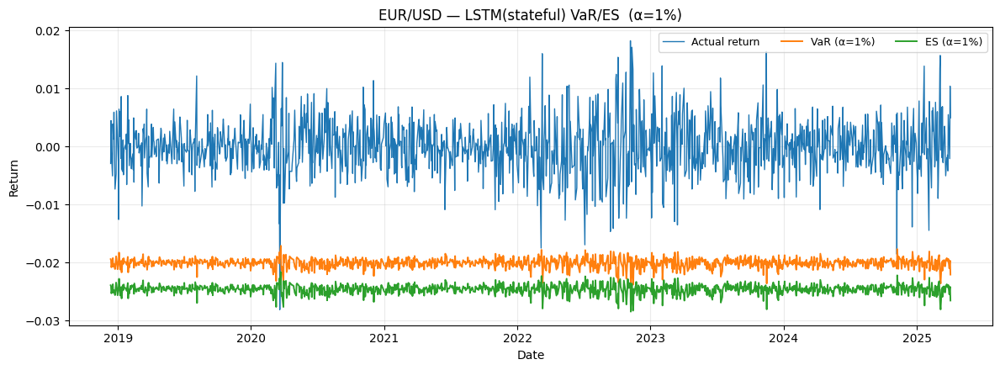

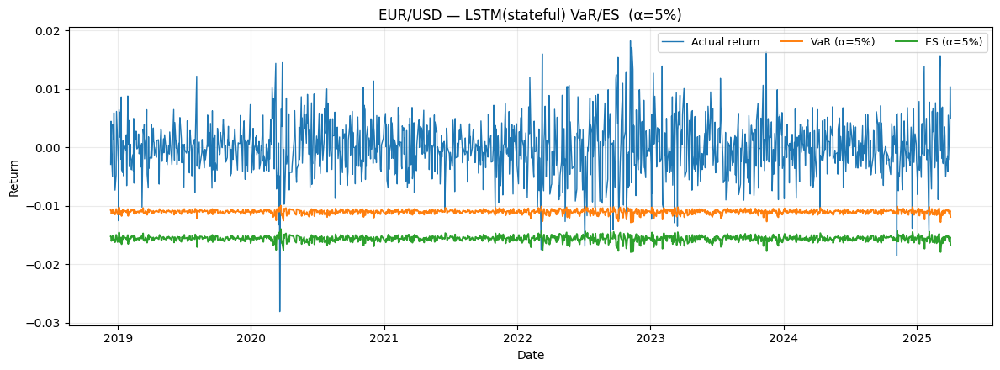

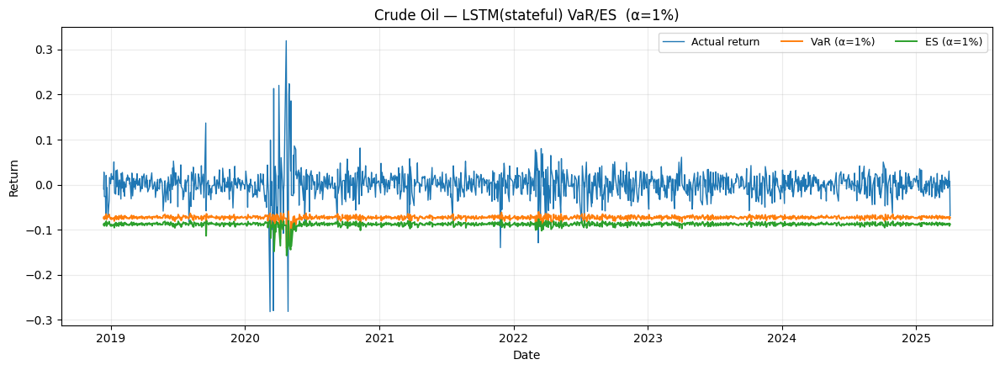

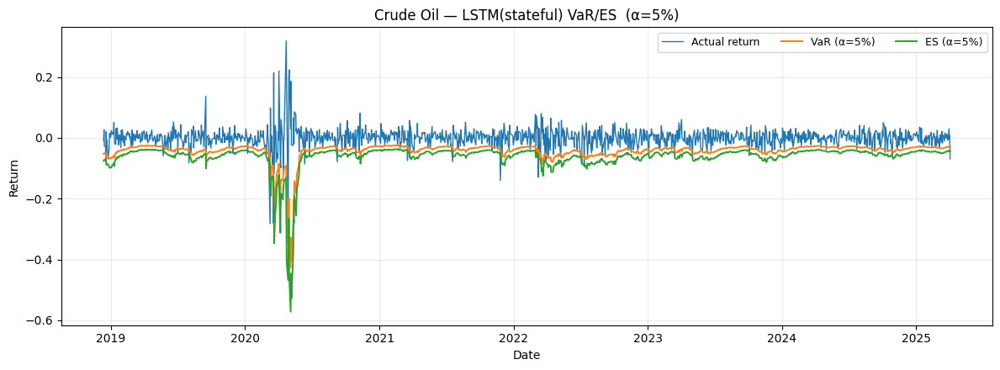

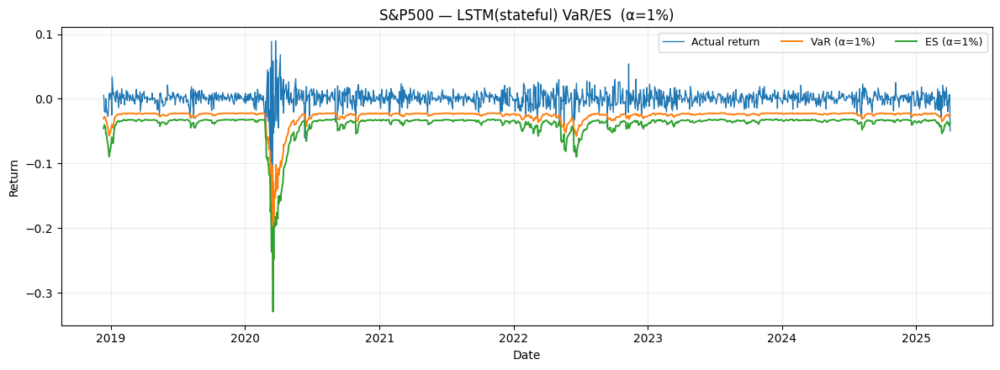

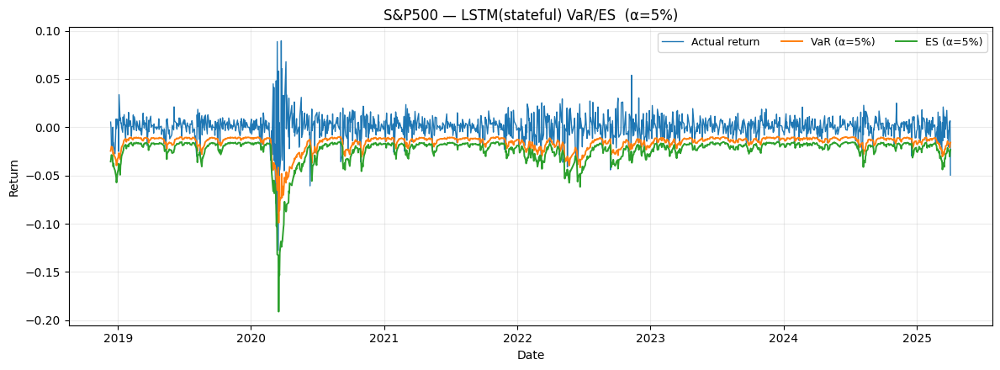

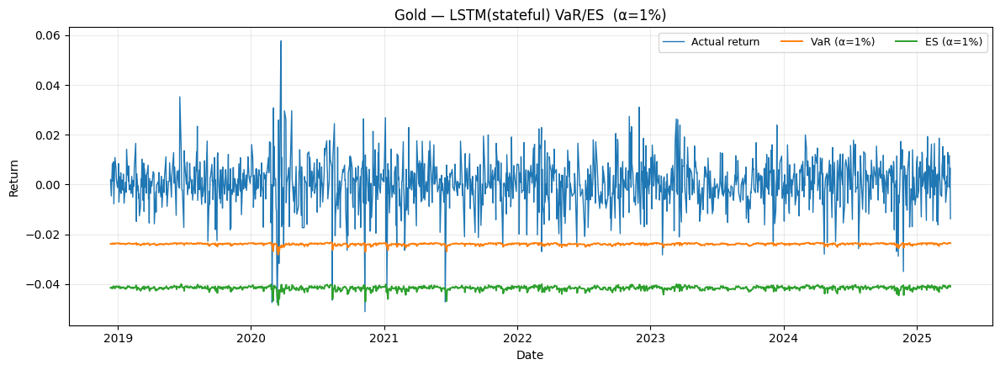

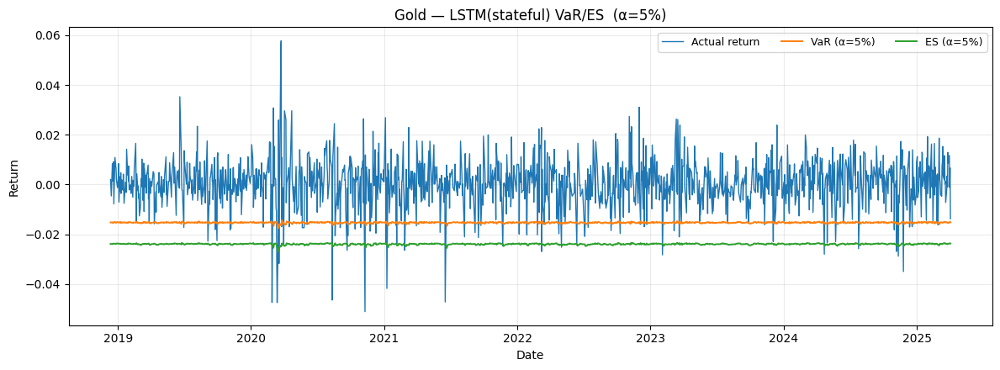

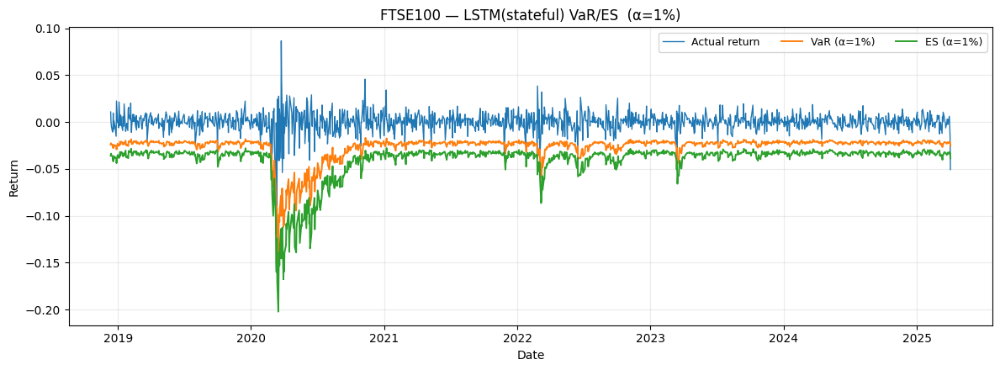

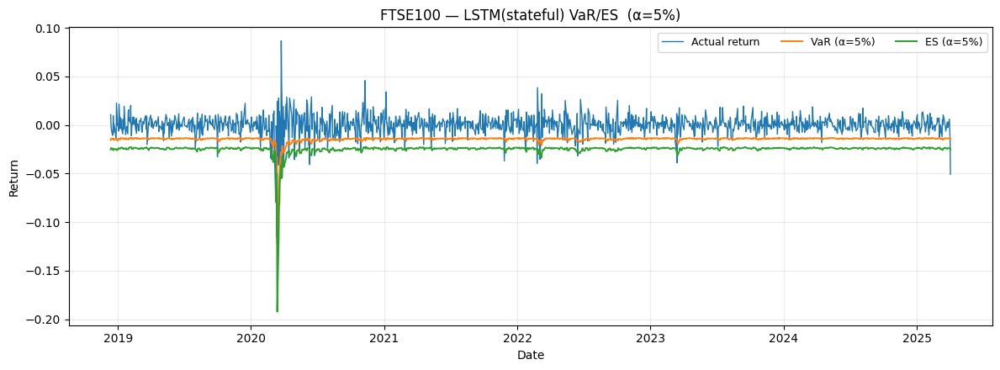

['plots_lstm_stateless_fz0/EUR-USD_alpha1.png',
 'plots_lstm_stateless_fz0/EUR-USD_alpha5.png',
 'plots_lstm_stateless_fz0/Crude_Oil_alpha1.png',
 'plots_lstm_stateless_fz0/Crude_Oil_alpha5.png',
 'plots_lstm_stateless_fz0/S&P500_alpha1.png',
 'plots_lstm_stateless_fz0/S&P500_alpha5.png',
 'plots_lstm_stateless_fz0/Gold_alpha1.png',
 'plots_lstm_stateless_fz0/Gold_alpha5.png',
 'plots_lstm_stateless_fz0/FTSE100_alpha1.png',
 'plots_lstm_stateless_fz0/FTSE100_alpha5.png']

In [ ]:
plot_var_es_all_simple(
    df_forecasts_lstm_stateless_fz0_1percent,
    df_forecasts_lstm_stateless_fz0_5percent,
    outdir="plots_lstm_stateless_fz0",
    show=True
)


## 2.4. Get Forecasts in One DataFrame ##

In [ ]:
df_forecasts_garch_edf_1percent['Model']    = 'GARCH-EDF'
df_forecast_garch_n_1percent['Model']       = 'GARCH-Normal'
df_forecast_garch_t_1percent['Model']       = 'GARCH-t'
rolling_window_125_df_1percent['Model']     = 'Rolling-125'
rolling_window_250_df_1percent['Model']     = 'Rolling-250'
rolling_window_500_df_1percent['Model']     = 'Rolling-500'
df_forecasts_ar_garch_1percent['Model']     = 'AR-GARCH'
df_forecasts_eu_usd_edf_1percent['Model']     = 'AR-GARCH-EDF'
df_forecasts_lstm_stateful_fz0_1percent['Model'] = 'LSTM-Stateful 1%'
df_forecasts_lstm_stateless_fz0_1percent['Model'] = 'LSTM-Stateless 1%'

for df in [rolling_window_125_df_1percent, rolling_window_250_df_1percent, rolling_window_500_df_1percent]:
    if 'window' in df.columns:
        df.drop(columns='window', inplace=True)

all_forecasts_df = pd.concat([
    df_forecast_garch_t_1percent,
    df_forecast_garch_n_1percent,
    df_forecasts_ar_garch_1percent,
    df_forecasts_garch_edf_1percent,
    df_forecasts_eu_usd_edf_1percent,
    rolling_window_125_df_1percent,
    rolling_window_250_df_1percent,
    rolling_window_500_df_1percent,
    df_forecasts_lstm_stateful_fz0_1percent,
    df_forecasts_lstm_stateless_fz0_1percent
], ignore_index=True)

all_forecasts_1percent_df = all_forecasts_df[['Date', 'Asset', 'Alpha', 'Model', 'Actual Return', 'VaR', 'ES']]
all_forecasts_1percent_df

,Date,Asset,Alpha,Model,Actual Return,VaR,ES
0,2018-12-12,S&P500,0.01,GARCH-t,0.005405,-0.050126,-0.066115
1,2018-12-13,S&P500,0.01,GARCH-t,-0.000200,-0.046922,-0.061889
2,2018-12-14,S&P500,0.01,GARCH-t,-0.019271,-0.049666,-0.065509
3,2018-12-17,S&P500,0.01,GARCH-t,-0.020992,-0.052890,-0.069760
4,2018-12-18,S&P500,0.01,GARCH-t,0.000086,-0.049490,-0.065276
...,...,...,...,...,...,...,...
55515,2025-03-28,Crude Oil,0.01,LSTM-Stateless 1%,-0.008041,-0.072911,-0.087647
55516,2025-03-31,Crude Oil,0.01,LSTM-Stateless 1%,0.030107,-0.071260,-0.086075
55517,2025-04-01,Crude Oil,0.01,LSTM-Stateless 1%,-0.003925,-0.077189,-0.091780
55518,2025-04-02,Crude Oil,0.01,LSTM-Stateless 1%,0.007137,-0.071662,-0.086459


In [ ]:
df_forecasts_garch_edf_5percent['Model']    = 'GARCH-EDF'
df_forecast_garch_n_5percent['Model']       = 'GARCH-Normal'
df_forecast_garch_t_5percent['Model']       = 'GARCH-t'
rolling_window_125_df_5percent['Model']     = 'Rolling-125'
rolling_window_250_df_5percent['Model']     = 'Rolling-250'
rolling_window_500_df_5percent['Model']     = 'Rolling-500'
df_forecasts_ar_garch_5percent['Model']     = 'AR-GARCH'
df_forecasts_eu_usd_edf_5percent['Model']     = 'AR-GARCH-EDF'
df_forecasts_lstm_stateful_fz0_5percent['Model'] = 'LSTM-Stateful 5%'
df_forecasts_lstm_stateless_fz0_5percent['Model'] = 'LSTM-Stateless 5%'

for df in [rolling_window_125_df_5percent, rolling_window_250_df_5percent, rolling_window_500_df_5percent]:
    if 'window' in df.columns:
        df.drop(columns='window', inplace=True)

all_forecasts_df = pd.concat([
    df_forecast_garch_t_5percent,
    df_forecast_garch_n_5percent,
    df_forecasts_ar_garch_5percent,
    df_forecasts_garch_edf_5percent,
    df_forecasts_eu_usd_edf_5percent,
    rolling_window_125_df_5percent,
    rolling_window_250_df_5percent,
    rolling_window_500_df_5percent,
    df_forecasts_lstm_stateful_fz0_5percent,
    df_forecasts_lstm_stateless_fz0_5percent
], ignore_index=True)

all_forecasts_5percent_df = all_forecasts_df[['Date', 'Asset', 'Alpha', 'Model', 'Actual Return', 'VaR', 'ES']]
all_forecasts_5percent_df

,Date,Asset,Alpha,Model,Actual Return,VaR,ES
0,2018-12-12,S&P500,0.05,GARCH-t,0.005405,-0.030116,-0.043070
1,2018-12-13,S&P500,0.05,GARCH-t,-0.000200,-0.028190,-0.040317
2,2018-12-14,S&P500,0.05,GARCH-t,-0.019271,-0.029839,-0.042675
3,2018-12-17,S&P500,0.05,GARCH-t,-0.020992,-0.031776,-0.045445
4,2018-12-18,S&P500,0.05,GARCH-t,0.000086,-0.029733,-0.042523
...,...,...,...,...,...,...,...
55515,2025-03-28,Crude Oil,0.05,LSTM-Stateless 5%,-0.008041,-0.028962,-0.042916
55516,2025-03-31,Crude Oil,0.05,LSTM-Stateless 5%,0.030107,-0.028689,-0.042456
55517,2025-04-01,Crude Oil,0.05,LSTM-Stateless 5%,-0.003925,-0.030239,-0.044527
55518,2025-04-02,Crude Oil,0.05,LSTM-Stateless 5%,0.007137,-0.028966,-0.042766


# 3. Backtesting

## 3.1. Fissler and Ziegel (2016) FZ loss function ##

Fissler and Ziegel (2016) propose a novel loss function for the **joint estimation** of VaR and ES, defined as follows:

#### General FZ Loss Function:

$$
L_{FZ}(y, v, e; \alpha, G_1, G_2) = (\mathbb{1}\{y \leq v\} - \alpha)\left(G_1(v) - G_1(y) + \frac{\alpha}{1} G_2(e)v\right) - G_2(e)\left(\alpha \mathbb{1}\{y \leq v\}y - e\right) - g_2(e)
$$

where:
- $y$ is the observed return,
- $v$ is the predicted VaR,
- $e$ is the predicted ES,
- $\alpha$ is the confidence level,
- $G_1$ is a weakly increasing function,
- $G_2$ is strictly increasing and strictly positive,
- $g_2'(e) = G_2(e)$

The **VaR and ES estimates** are obtained by minimizing the expected FZ loss:

$$
(\text{VaR}^\alpha_t, \text{ES}^\alpha_t) = \arg\min \mathbb{E}_{t-1} \left[ L_{FZ}(y_t, v, e; \alpha, G_1, G_2) \right]
$$

---

#### FZ0 Special Case:

Patton et al. (2019) consider a special case, referred to as the **FZ0 loss function**, where:

- $G_1(x) = 0$
- $G_2(x) = -\frac{1}{x}$

The FZ0 loss simplifies to:

$$
L_{FZ0}(y, v, e; \alpha) = - \frac{1}{\alpha e} \mathbb{1}\{y \leq v\}(v - y) + \frac{v}{e} + \log(-e) - 1
$$

This function will be used to jointly estimate the metrics for DL/ML models

In [ ]:
# FZ0 (Patton et al., 2019) special case
def fz0_loss(y, var, es, alpha, eps=1e-12):
    """
    Lower is better.
    Assumes lower-tail risk on returns => ES must be strictly negative.
    """
    y   = np.asarray(y,   dtype=float)
    var = np.asarray(var, dtype=float)
    es  = np.asarray(es,  dtype=float)
    a   = np.asarray(alpha, dtype=float)

    # Guardrails (avoid log/0 and wrong sign)
    es = np.where(es <= -eps, es, -eps)

    I = (y <= var).astype(float)
    return -(I * (var - y)) / (a * es) + (var / es) + np.log(-es) - 1.0


def build_fz0_rankings(all_forecasts_1percent_df, all_forecasts_5percent_df,
                       export_excel_path="FZ0_rankings_by_asset.xlsx"):

    # 1) Combine the two alpha DataFrames
    df = pd.concat(
        [all_forecasts_1percent_df.copy(), all_forecasts_5percent_df.copy()],
        ignore_index=True
    )

    # Clean up a few columns
    df["Model"] = df["Model"].astype(str).str.strip().str.upper()
    df["Alpha"] = pd.to_numeric(df["Alpha"], errors="coerce")

    # 2) Compute per-row FZ0 using each row's alpha
    df["FZ0_Loss"] = fz0_loss(
        y=df["Actual Return"].to_numpy(),
        var=df["VaR"].to_numpy(),
        es=df["ES"].to_numpy(),
        alpha=df["Alpha"].to_numpy()
    )

    # 3) Average by Asset × Alpha × Model and rank
    ranking_df = (
        df.groupby(["Asset", "Alpha", "Model"], as_index=False)
          .agg(Avg_FZ0_Loss=("FZ0_Loss", "mean"),
               N=("FZ0_Loss", "size"))
    )
    # Rank (lower loss = better)
    ranking_df["Rank"] = (
        ranking_df
        .groupby(["Asset", "Alpha"])["Avg_FZ0_Loss"]
        .rank(method="dense", ascending=True)
        .astype(int)
    )

    # Sort
    ranking_df = ranking_df.sort_values(["Asset", "Alpha", "Rank", "Avg_FZ0_Loss"]).reset_index(drop=True)

    # 4) Build a table with  sections per asset
    sections = []
    for asset in ranking_df["Asset"].unique():
        sections.append({
            "Asset Section": f"— {asset} —",
            "Alpha": "", "Rank": "", "Model": "", "Avg FZ0 Loss": "", "N": ""
        })
        sub = ranking_df[ranking_df["Asset"] == asset].copy()

        sub["Alpha"] = (sub["Alpha"] * 100).map(lambda x: f"{x:.0f}%")
        sub = sub[["Alpha", "Rank", "Model", "Avg_FZ0_Loss", "N"]]
        sub = sub.rename(columns={"Avg_FZ0_Loss": "Avg FZ0 Loss"})

        sections.append(sub)

        sections.append(pd.DataFrame([{"Alpha":"", "Rank":"", "Model":"", "Avg FZ0 Loss":"", "N":""}]))

    report_df = pd.concat(
        [pd.DataFrame([r]) if isinstance(r, dict) else r for r in sections],
        ignore_index=True
    )


    try:
        with pd.ExcelWriter(export_excel_path, engine="xlsxwriter") as writer:
            for asset in ranking_df["Asset"].unique():
                sub = ranking_df[ranking_df["Asset"] == asset].copy()
                sub_out = sub.sort_values(["Alpha", "Rank", "Avg_FZ0_Loss"])

                sub_out["Alpha"] = (sub_out["Alpha"] * 100).map(lambda x: f"{x:.0f}%")
                sub_out.rename(columns={"Avg_FZ0_Loss": "Avg FZ0 Loss"}, inplace=True)
                sub_out.to_excel(writer, sheet_name=asset[:31], index=False)  # Excel sheet names ≤31 chars
    except Exception as e:

        print(f"[Info] Skipped Excel export: {e}")

    return ranking_df, report_df


In [ ]:
ranking_df, report_df = build_fz0_rankings(
    all_forecasts_1percent_df,
    all_forecasts_5percent_df,
    export_excel_path="FZ0_rankings_by_asset.xlsx"
)
ranking_df

[Info] Skipped Excel export: No module named 'xlsxwriter'


,Asset,Alpha,Model,Avg_FZ0_Loss,N,Rank
0,Crude Oil,0.01,GARCH-NORMAL,-2.667833,1388,1
1,Crude Oil,0.01,GARCH-EDF,-2.665380,1388,2
2,Crude Oil,0.01,GARCH-T,-2.643228,1388,3
3,Crude Oil,0.01,LSTM-STATEFUL 1%,-2.233832,1388,4
4,Crude Oil,0.01,ROLLING-125,-1.897739,1388,5
...,...,...,...,...,...,...
74,S&P500,0.05,LSTM-STATELESS 5%,-3.666056,1388,4
75,S&P500,0.05,ROLLING-125,-3.506507,1388,5
76,S&P500,0.05,LSTM-STATEFUL 5%,-3.464315,1388,6
77,S&P500,0.05,ROLLING-500,-3.443561,1388,7


## 3.2. Dynamic Quantile Test ##

In [ ]:
def dynamic_quantile_test_bootstrap(forecast_df, alpha=0.01, lags=1, p_threshold=0.01, n_bootstrap=1000):
    """
    Dynamic Quantile (DQ) Test with Bootstrap p-value.
    """
    results = []

    for (asset, model), group in forecast_df.groupby(['Asset', 'Model']):
        group = group.dropna(subset=['Actual Return', 'VaR'])

        # Violation indicator: 1 if return < VaR
        I_t = (group['Actual Return'] < group['VaR']).astype(int)
        hit = I_t - alpha

        if len(hit) <= lags:
            continue

        # Build design matrix for real data
        y_real = hit[lags:].values
        X_real = np.column_stack([hit.shift(i).values for i in range(1, lags + 1)])
        X_real = X_real[lags:]
        X_real = sm.add_constant(X_real)

        # Real DQ statistic
        model_ols = sm.OLS(y_real, X_real).fit()
        dq_real = len(y_real) * model_ols.rsquared

        # Bootstrap procedure
        dq_bootstrap = []
        for b in range(n_bootstrap):
            # Simulate new I_t* ~ Bernoulli(alpha)
            I_star = np.random.binomial(1, alpha, size=len(I_t))
            hit_star = I_star - alpha

            y_star = hit_star[lags:]
            X_star = np.column_stack([np.roll(hit_star, i) for i in range(1, lags + 1)])
            X_star = X_star[lags:]
            X_star = sm.add_constant(X_star)

            model_star = sm.OLS(y_star, X_star).fit()
            dq_bootstrap.append(len(y_star) * model_star.rsquared)

        dq_bootstrap = np.array(dq_bootstrap)

        # Bootstrap p-value: proportion of bootstraps greater than real DQ
        p_value_bootstrap = np.mean(dq_bootstrap > dq_real)

        results.append({
            'Asset': asset,
            'Model': model,
            'Alpha': alpha,
            'DQ Stat': dq_real,
            'p-value (bootstrap)': p_value_bootstrap,
            'DQ Pass': ' Pass' if p_value_bootstrap > p_threshold else ' Fail',
            'Lags': lags,
            'Violations': I_t.sum(),
            'Total Obs': len(hit)
        })

    return pd.DataFrame(results)

In [ ]:
dq_results_1percent = dynamic_quantile_test_bootstrap(all_forecasts_1percent_df)

In [ ]:
dq_results_5percent = dynamic_quantile_test_bootstrap(all_forecasts_5percent_df)

## 3.4. Dynamic ES (DES) regression test ##

In [ ]:
def des_dynamic_test(forecast_df: pd.DataFrame, alpha=0.01, lags=1, min_violations=10, min_effective_obs=10, n_bootstrap=1000, plot=False):

    results = []

    grouped = forecast_df.groupby(["Asset", "Model"])

    for (asset, model), group in grouped:
        group = group.dropna(subset=["Actual Return", "VaR", "ES"])

        # Hit indicator
        I_t = (group["Actual Return"] < group["VaR"]).astype(int)
        losses = I_t * (group["Actual Return"] - group["ES"])

        total_obs = len(group)
        total_violations = int(I_t.sum())

        if total_violations < min_violations:
            results.append({
                "Asset": asset,
                "Model": model,
                "Alpha": alpha,
                "DES Stat": np.nan,
                "p-value (bootstrap)": np.nan,
                "Status": "Too few violations",
                "Violations": total_violations,
                "Total Obs": total_obs
            })
            continue

        losses = losses.reset_index(drop=True)

        # Build lagged design matrix
        Y = losses.values[lags:]
        X = np.column_stack([losses.shift(i).values for i in range(1, lags + 1)])
        X = X[lags:]
        X = sm.add_constant(X)

        # Check if effective sample is enough
        if np.sum(np.abs(Y) > 1e-8) < min_effective_obs:
            results.append({
                "Asset": asset,
                "Model": model,
                "Alpha": alpha,
                "DES Stat": np.nan,
                "p-value (bootstrap)": np.nan,
                "Status": "Too few effective points after lags",
                "Violations": total_violations,
                "Total Obs": total_obs
            })
            continue

        model_ols = sm.OLS(Y, X).fit()
        des_stat = len(Y) * model_ols.rsquared

        # Bootstrap procedure
        des_bootstrap = []
        for _ in range(n_bootstrap):
            I_star = np.random.binomial(1, alpha, size=len(group))
            losses_star = I_star * (group["Actual Return"] - group["ES"])
            losses_star = losses_star.reset_index(drop=True)

            Y_star = losses_star.values[lags:]
            X_star = np.column_stack([losses_star.shift(i).values for i in range(1, lags + 1)])
            X_star = X_star[lags:]
            X_star = sm.add_constant(X_star)

            if np.sum(np.abs(Y_star) > 1e-8) < min_effective_obs:
                continue

            model_star = sm.OLS(Y_star, X_star).fit()
            des_bootstrap.append(len(Y_star) * model_star.rsquared)

        if len(des_bootstrap) == 0:
            p_value = np.nan
        else:
            des_bootstrap = np.array(des_bootstrap)
            p_value = np.mean(des_bootstrap > des_stat)

        results.append({
            "Asset": asset,
            "Model": model,
            "Alpha": alpha,
            "DES Stat": des_stat,
            "p-value (bootstrap)": round(p_value, 4) if not np.isnan(p_value) else np.nan,
            "Status": " Pass" if p_value > 0.01 else " Fail",
            "Violations": total_violations,
            "Total Obs": total_obs
        })

    return pd.DataFrame(results)

In [ ]:
des_results_1percent = des_dynamic_test(all_forecasts_1percent_df)

In [ ]:
des_results_5percent = des_dynamic_test(all_forecasts_5percent_df)

## 3.5 Model Ranking Methodology

### 1. Objective

We evaluate models using three complementary criteria:

- **DQ Test p-value**: frequency and independence of violations.
- **DES Test p-value**: severity and independence of losses beyond VaR.
- **Violation Deviation Score**: evaluates how close the observed violation frequency is to the expected violation frequency under the target VaR level (1%).
---

### 2. Computation Details

- **Expected Number of Violations** is computed as:

$$
\text{Expected Violations} = \alpha \times T
$$

where:
- $\alpha$ is the VaR confidence level (1%),
- $T$ is the total number of observations.

- **Violation Deviation Score** is computed as:

$$
\text{Violation Deviation Score} = 1 - \frac{|\text{Actual Violations} - \text{Expected Violations}|}{\text{Expected Violations}}
$$

- A Violation Deviation Score close to **1** indicates that the model's observed violation frequency is close to the theoretical expectation.  
- A score close to **0** indicates significant under-coverage or over-coverage.

- The **Composite Score** for each model is computed as a weighted average of the three criteria:

$$
\text{Composite Score} = 0.4 \times (\text{DQ p-value}) + 0.4 \times (\text{DES p-value}) + 0.2 \times (\text{Violation Deviation Score})
$$

The weights reflect the relative importance attributed to dynamic quantile adequacy, expected shortfall correctness, and unconditional coverage.

---

### 3. Ranking Rule

- Models are ranked in descending order of the Composite Score.
- Higher Composite Scores indicate better overall model performance across VaR and ES dimensions.
- Models with insufficient violations to perform valid statistical tests are listed but not ranked.

---

### 4. Interpretation

| Composite Score Range | Interpretation |
|:---|:---|
| > 0.8 | Excellent model |
| 0.6 - 0.8 | Good model |
| 0.4 - 0.6 | Moderate model |
| < 0.4 | Poor model |

In [ ]:
merged = dq_results_1percent.merge(
    des_results_1percent,
    on=["Asset", "Model", "Alpha"],
    suffixes=('_DQ', '_DES')
)

# Expected number of violations based on Alpha level
expected_violations = merged['Total Obs_DQ'] * merged['Alpha']

# Violation Deviation Score: measures how far the observed violations deviate from expected
merged['Violation Deviation Score'] = 1 - abs(merged['Violations_DQ'] - expected_violations) / expected_violations
merged['Violation Deviation Score'] = merged['Violation Deviation Score'].clip(lower=0)

# Composite Score: weighted combination of DQ p-value, DES p-value, and violation deviation
merged['Composite Score'] = (
    0.4 * merged['p-value (bootstrap)_DQ'] +
    0.4 * merged['p-value (bootstrap)_DES'] +
    0.2 * merged['Violation Deviation Score']
)

# Ranking only models with valid composite scores
valid_scores = merged['Composite Score'].notna()
merged.loc[valid_scores, 'Rank'] = merged.loc[valid_scores, 'Composite Score']\
    .rank(ascending=False, method='dense').astype(int)

# Sort by Asset (to group), then by Rank within each Asset
merged = merged.sort_values(by=['Asset', 'Rank'])

display(merged[['Rank', 'Asset', 'Model', 'Composite Score', 'DQ Pass', 'Status', 'Violations_DQ', 'Total Obs_DQ']])


,Rank,Asset,Model,Composite Score,DQ Pass,Status,Violations_DQ,Total Obs_DQ
1,12.0,Crude Oil,GARCH-Normal,0.223991,Pass,Pass,14,1388
4,13.0,Crude Oil,LSTM-Stateless 1%,0.223434,Pass,Pass,18,1388
0,15.0,Crude Oil,GARCH-EDF,0.197791,Pass,Pass,12,1388
6,17.0,Crude Oil,Rolling-250,0.190305,Pass,Pass,19,1388
7,19.0,Crude Oil,Rolling-500,0.166323,Fail,Pass,17,1388
2,20.0,Crude Oil,GARCH-t,0.162372,Pass,Pass,10,1388
5,25.0,Crude Oil,Rolling-125,0.116548,Pass,Fail,23,1388
3,28.0,Crude Oil,LSTM-Stateful 1%,0.063080,Pass,Pass,28,1388
10,1.0,EUR/USD,GARCH-EDF,0.885732,Pass,Pass,10,1388
9,2.0,EUR/USD,AR-GARCH-EDF,0.857711,Pass,Pass,12,1388


In [ ]:
merged = dq_results_5percent.merge(
    des_results_5percent,
    on=["Asset", "Model", "Alpha"],
    suffixes=('_DQ', '_DES')
)

# Expected number of violations based on Alpha level
expected_violations = merged['Total Obs_DQ'] * merged['Alpha']

# Violation Deviation Score: measures how far the observed violations deviate from expected
merged['Violation Deviation Score'] = 1 - abs(merged['Violations_DQ'] - expected_violations) / expected_violations
merged['Violation Deviation Score'] = merged['Violation Deviation Score'].clip(lower=0)

# Composite Score: weighted combination of DQ p-value, DES p-value, and violation deviation
merged['Composite Score'] = (
    0.4 * merged['p-value (bootstrap)_DQ'] +
    0.4 * merged['p-value (bootstrap)_DES'] +
    0.2 * merged['Violation Deviation Score']
)

# Ranking only models with valid composite scores
valid_scores = merged['Composite Score'].notna()
merged.loc[valid_scores, 'Rank'] = merged.loc[valid_scores, 'Composite Score']\
    .rank(ascending=False, method='dense').astype(int)

# Sort by Asset (to group), then by Rank within each Asset
merged = merged.sort_values(by=['Asset', 'Rank'])

# Display the relevant columns
display(merged[['Rank', 'Asset', 'Model', 'Composite Score', 'DQ Pass', 'Status', 'Violations_DQ', 'Total Obs_DQ']])


,Rank,Asset,Model,Composite Score,DQ Pass,Status,Violations_DQ,Total Obs_DQ
4,15.0,Crude Oil,LSTM-Stateless 5%,0.276800,Pass,Pass,81,1388
2,17.0,Crude Oil,GARCH-t,0.226120,Pass,Pass,47,1388
3,19.0,Crude Oil,LSTM-Stateful 5%,0.104560,Pass,Pass,84,1388
1,25.0,Crude Oil,GARCH-Normal,0.059320,Pass,Pass,61,1388
0,29.0,Crude Oil,GARCH-EDF,0.047080,Pass,Pass,54,1388
6,32.0,Crude Oil,Rolling-250,0.039400,Pass,Pass,71,1388
5,36.0,Crude Oil,Rolling-125,0.023800,Pass,Pass,76,1388
7,38.0,Crude Oil,Rolling-500,0.017240,Fail,Pass,74,1388
9,1.0,EUR/USD,AR-GARCH-EDF,0.860111,Pass,Pass,12,1388
12,3.0,EUR/USD,LSTM-Stateless 5%,0.626634,Pass,Pass,18,1388
